# Assumptions:

* The model outputs draws/mean across draws of Model 4 will be within upper/lower bounds of the GBD 2017 estimates (using get_outputs) for each location/sex/age_group

* Prevalence
* YLLs
* YLDs
* CSMR

* The model outputs draws/mean across draws of Model 3 will not be within upper/lower bounds of the GBD 2017 estimates (using get_outputs) for each location/sex/age_group

* Incidence

 

In [1]:
import pandas as pd
import numpy as np
from vivarium import Artifact
import os
from pathlib import Path
from db_queries import get_outputs, get_ids, get_model_results, get_population
import matplotlib.pyplot as plt
import seaborn as sns
import glob
import gbd_mapping
from matplotlib.backends.backend_pdf import PdfPages
pd.set_option('use_inf_as_na', True)
sns.set(context = 'paper', style='whitegrid', font_scale=1.8, rc = {'axes.spines.right':False, 'axes.spines.top': False, 'figure.figsize':(12.7,8.6)}, palette='Set1')


## Change variable save_path to local directory file path for file results

In [2]:
mapping_dict_data = {'cause': {'acute_myocardial_infarction':'ischemic_heart_disease','post_myocardial_infarction':'ischemic_heart_disease','acute_ischemic_stroke':'ischemic_stroke','post_ischemic_stroke':'ischemic_stroke', 'other_causes':'other_causes', 'albuminuria':'chronic_kidney_disease', 'stage_iii_chronic_kidney_disease':'chronic_kidney_disease','stage_iv_chronic_kidney_disease':'chronic_kidney_disease','stage_v_chronic_kidney_disease':'chronic_kidney_disease','moderate_diabetes_mellitus':'diabetes_mellitus','severe_diabetes_mellitus':'diabetes_mellitus', 'chronic_kidney_disease':'chronic_kidney_disease'},
                    'location': {'china':'China', 'brazil':'Brazil', 'france':'France', 'italy':'Italy', 'russian_federation':'Russian Federation', 'spain':'Spain'},
                    'sex':{'female':'Female','male':'Male'},
                    'measure':{'death':'deaths','ylds':'ylds','ylls':'ylls'},
                    'model_4_results':{'brazil':'brazil/2020_03_25_22_41_53','china':'china/2020_03_22_19_26_03', 'france':'france/2020_03_22_19_24_38', 'italy':'italy/2020_03_22_21_17_46', 'russian_federation':'russian_federation/2020_03_22_22_01_36', 'spain':'spain/2020_03_22_23_17_15'}}

# locations = ['brazil','china','france','italy','russian_federation','spain']
#model rerun
locations = ['brazil']
measures = ['deaths', 'person_time','population','ylds','ylls']
save_path_j = '/home/j/Project/simulation_science/zenon/validation/model_4'

## GBD 2017 estimates

In [14]:
def get_gbd_outputs(location):
    locations = {'brazil': 135,
                 'china': 6,
                 'italy': 86,
                 'france': 80,
                 'spain': 92,
                 'russian_federation': 62}
    loc_id = locations[location]
    from gbd_mapping import causes
    ages = list(range(11, 21)) + [30, 31, 32, 235]
    male, female = 1, 2
    rate = 3
    deaths, ylds, ylls, prevalence, incidence = 1, 3, 4, 5, 6
    cause_names = ['ischemic_heart_disease', 'ischemic_stroke', 'chronic_kidney_disease', 'diabetes_mellitus']
    cause_map = {c.gbd_id: c.name for c in causes if c.name in cause_names}

    gbd_outputs = get_outputs('cause', cause_id=list(cause_map.keys()), 
                              metric_id=[rate], measure_id=[deaths,ylls, ylds,prevalence, incidence], 
                              sex_id = [male, female], age_group_id=ages,
                              location_id=loc_id, gbd_round_id=5, year_id=2017)
    
    gbd_outputs = gbd_outputs[['cause_id', 'year_id','age_group_name', 'measure_name', 'sex', 'val', 'upper', 'lower']]
    gbd_outputs['cause'] = gbd_outputs.cause_id.map(cause_map)
    gbd_outputs['location'] = f'{location}'
    gbd_outputs['measure'] = gbd_outputs.measure_name.map({'Deaths':'deaths',
                                                           'YLLs (Years of Life Lost)': 'ylls',
                                                           'YLDs (Years Lived with Disability)': 'ylds',
                                                           'Prevalence': 'prevalence',
                                                           'Incidence': 'incidence'})
    gbd_outputs['age_group'] = gbd_outputs.age_group_name.str.replace(' ', '_')
    gbd_outputs = gbd_outputs.rename(columns={'year_id':'year'})
    gbd_outputs = gbd_outputs.drop(columns=['cause_id', 'measure_name', 'age_group_name'])
    gbd = gbd_outputs.set_index(['cause', 'measure', 'sex', 'age_group']).sort_index().reset_index()
    gbd[['val', 'upper', 'lower']] *= 100_000

    return gbd
    

In [15]:
def get_gbd_outputs_all(locations):
    gbd_outputs = pd.DataFrame()
    for location in locations:
        data = get_gbd_outputs(location)
        gbd_outputs = gbd_outputs.append(data)
    return gbd_outputs

## Artifact 

* Pulled to compare against sim initialization and against GBD 2017

* EMR
* Deaths

In [18]:
def load_artifact_data_emr(locations):
    master_art_data = pd.DataFrame()
    for location in locations:
        for sequela in ['acute_myocardial_infarction', 'post_myocardial_infarction']:
            art = Artifact(f'/share/costeffectiveness/artifacts/vivarium_csu_zenon/{location}.hdf', filter_terms=['year_start ==2017', 'age_start > 29'])
            data = art.load(f'sequela.{sequela}.excess_mortality_rate')

            data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
            data['location'] = f'{location}'
            data['measure'] = 'excess_mortality_rate'
            data['age_group'] = 0
            data['cause'] = f'{sequela}'
            data['age_group'] = np.where(data['age_start'] == 30.0, '30_to_34', 
                                         np.where(data['age_start'] == 35.0, '35_to_39',
                                                  np.where(data['age_start'] == 40.0, '40_to_44',
                                                          np.where(data['age_start'] == 45.0, '45_to_49',
                                                                  np.where(data['age_start'] == 50.0, '50_to_54',
                                                                           np.where(data['age_start'] == 55.0, '55_to_59',
                                                                                   np.where(data['age_start'] == 60.0, '60_to_64',
                                                                                            np.where(data['age_start'] == 65.0, '65_to_69',
                                                                                                     np.where(data['age_start'] == 70.0, '70_to_74',
                                                                                                              np.where(data['age_start'] == 75.0, '75_to_79',
                                                                                                                       np.where(data['age_start'] == 80.0, '80_to_84',
                                                                                                                               np.where(data['age_start'] == 85.0, '85_to_89',
                                                                                                                                       np.where(data['age_start'] == 90.0, '90_to_94',
                                                                                                                                                np.where(data['age_start'] == 95.0, '95_plus', 'too_young'))))))))))))))
            master_art_data = master_art_data.append(data)
    master_art_data['year'] = '2017'

    master_art_data = master_art_data.drop(columns=['year_start', 'year_end', 'age_start', 'age_end'])
    master_art_data = master_art_data.set_index(['cause', 'measure', 'sex', 'age_group', ]).sort_index().reset_index()
    master_art_data[['value']] *= 100_000

    return master_art_data

In [19]:
artifact_emr = load_artifact_data_emr(locations)

In [ ]:

def load_artifact_data(locations):
    master_art_data = pd.DataFrame()
    for location in locations:
        art = Artifact(f'/share/costeffectiveness/artifacts/vivarium_csu_zenon/{location}.hdf', filter_terms=['year_start ==2017', 'age_start > 29'])
        data = art.load('cause.ischemic_heart_disease.cause_specific_mortality_rate')
        
        data = pd.DataFrame(data.mean(axis=1)).reset_index().rename(columns={0:'value'})
        data['location'] = f'{location}'
        data['measure'] = 'deaths'
        data['age_group'] = 0
        data['age_group'] = np.where(data['age_start'] == 30.0, '30_to_34', 
                                     np.where(data['age_start'] == 35.0, '35_to_39',
                                              np.where(data['age_start'] == 40.0, '40_to_44',
                                                      np.where(data['age_start'] == 45.0, '45_to_49',
                                                              np.where(data['age_start'] == 50.0, '50_to_54',
                                                                       np.where(data['age_start'] == 55.0, '55_to_59',
                                                                               np.where(data['age_start'] == 60.0, '60_to_64',
                                                                                        np.where(data['age_start'] == 65.0, '65_to_69',
                                                                                                 np.where(data['age_start'] == 70.0, '70_to_74',
                                                                                                          np.where(data['age_start'] == 75.0, '75_to_79',
                                                                                                                   np.where(data['age_start'] == 80.0, '80_to_84',
                                                                                                                           np.where(data['age_start'] == 85.0, '85_to_89',
                                                                                                                                   np.where(data['age_start'] == 90.0, '90_to_94',
                                                                                                                                            np.where(data['age_start'] == 95.0, '95_plus', 'too_young'))))))))))))))
        master_art_data = master_art_data.append(data)
    master_art_data['year'] = '2017'
    master_art_data['cause'] = 'ischemic_heart_disease'
    master_art_data = master_art_data.drop(columns=['year_start', 'year_end', 'age_start', 'age_end'])
    master_art_data = master_art_data.set_index(['cause', 'measure', 'sex', 'age_group', ]).sort_index().reset_index()
    master_art_data[['value']] *= 100_000
    
    return master_art_data

In [102]:
artifact_csmr = load_artifact_data(locations)

In [103]:
artifact_csmr.head()


,cause,measure,sex,age_group,location,value,year
0,ischemic_heart_disease,deaths,Female,30_to_34,brazil,3.401651,2017
1,ischemic_heart_disease,deaths,Female,30_to_34,china,3.324110,2017
2,ischemic_heart_disease,deaths,Female,30_to_34,france,0.634890,2017
3,ischemic_heart_disease,deaths,Female,30_to_34,italy,0.577120,2017
4,ischemic_heart_disease,deaths,Female,30_to_34,russian_federation,4.221929,2017


## Zenon Model 4 results







In [26]:
#model rerun
path_template = Path('/ihme/costeffectiveness/results/vivarium_csu_zenon/v4.1_cvd_risk')

#deaths cause mapping disabled for emr calculation
def get_deaths(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/deaths.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
#     outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location']).value.sum().reset_index()
    return outcomes

def get_pops(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/population.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    return outcomes

def get_ylls(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/ylls.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location']).value.sum().reset_index()
    return outcomes

def get_ylds(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/ylds.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location']).value.sum().reset_index()
    return outcomes

def get_person_time(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/person_time.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes = outcomes.groupby(['age_group','sex','year','input_draw', 'location']).value.sum().reset_index()
    return outcomes

#state cause mapping disabled for emr calculation
def get_state(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/state_person_time.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
#     outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw','location']).value.sum().reset_index()
    return outcomes

def get_emr(locations, deaths, state):
    
    index_columns = ['age_group', 'sex', 'year', 'input_draw','location', 'cause']
    deaths['measure'] = 'deaths'
    deaths = deaths[(deaths.cause == 'acute_myocardial_infarction') | (deaths.cause == 'post_myocardial_infarction') & (deaths.year == '2020')]
    state['measure'] = 'state'
    state = state[(state.cause == 'acute_myocardial_infarction') | (state.cause == 'post_myocardial_infarction') & (state.year == '2020')]
    deaths  = deaths.set_index(index_columns).value
    state = state.set_index(index_columns).value
    rates = deaths / state * 100_000
    rates = rates.reset_index()
    rates['value'] = rates['value'].fillna(0)
    rates['measure'] = 'excess_mortality_rate'
    rates['sex'] = rates.sex.map(mapping_dict_data['sex'])
    return rates

def get_state_no_mapping(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/state_person_time.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw','measure', 'location']).value.sum().reset_index()
    return outcomes

def get_transition(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/transition_count.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
    return outcomes

def collapse_frame(df, column):
    return(df.groupby([x for x in df.columns if x not in ['value',column]])['value'].sum().reset_index())

def get_incidence(locations, risk_strat = False, final_cause_strat = False):
    transitions = get_transition(locations)
    transitions = transitions[transitions.measure.str.startswith('susceptible')]
    transitions['susceptible'] = transitions.measure.str.extract('((?<=to_).*?(?=_to))',expand = False)
    transitions['cause'] = transitions.measure.str.extract('((?<=to_).*?(?=_event_count))',expand = False)
    transitions['cause'] = transitions.cause.str.extract('((?<=_to_).*)', expand = False)
    transitions = transitions.drop('measure', axis = 1)
    state = get_state_no_mapping(locations)
    state = state[state.cause.str.contains('susceptible')]
    state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
    state = state.drop(['cause', 'measure'], axis = 1)
    if not risk_strat:
        state = collapse_frame(state, 'cvd_risk_category')
        transitions = collapse_frame(transitions, 'cvd_risk_category')
    if not final_cause_strat:
        transitions = collapse_frame(transitions, 'cause')
    transitions = transitions.set_index([x for x in transitions.columns if x != 'value']).value
    state = state.set_index([x for x in state.columns if x != 'value']).value
    incidence = (transitions.div(state) * 100000).reset_index()
    incidence['measure'] = 'incidence'
    if 'cause' not in incidence.columns:
        incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
    return incidence

def get_cause_specific_rates(locations):
    ylds = get_ylds(locations)
    ylds['measure'] = 'ylds'
    ylls = get_ylls(locations)
    ylls['measure'] = 'ylls'
    deaths = get_deaths(locations)
    deaths['measure'] = 'deaths'
    state = get_state(locations)
    state['measure'] = 'prevalence'
    measures = pd.concat([ylds, ylls, deaths, state])
    person_time = get_person_time(locations)
    index_columns = ['age_group', 'sex', 'year', 'input_draw','location']
    measures = measures.set_index(index_columns + ['cause', 'measure']).value
    person_time = person_time.set_index(index_columns).value
    rates = measures / person_time * 100_000
    rates = rates.reset_index().append(get_incidence(locations))
    rates['sex'] = rates.sex.map(mapping_dict_data['sex'])
    
    return rates

In [27]:
emr = get_emr(locations, deaths, state)

In [115]:
rates = get_cause_specific_rates(locations)

In [16]:
gbd = get_gbd_outputs_all(locations)


In [100]:
artifact_emr.head()

,cause,measure,sex,age_group,location,value,year
0,acute_myocardial_infarction,excess_mortality_rate,Female,30_to_34,brazil,625390.652323,2017
1,acute_myocardial_infarction,excess_mortality_rate,Female,35_to_39,brazil,642529.165265,2017
2,acute_myocardial_infarction,excess_mortality_rate,Female,40_to_44,brazil,668522.746419,2017
3,acute_myocardial_infarction,excess_mortality_rate,Female,45_to_49,brazil,702238.338744,2017
4,acute_myocardial_infarction,excess_mortality_rate,Female,50_to_54,brazil,727564.029345,2017


In [25]:
emr.head()

,age_group,sex,year,input_draw,location,cause,value,measure
0,30_to_34,Female,2020,3,brazil,acute_myocardial_infarction,0.000000,excess_mortality_rate
1,30_to_34,Female,2020,21,brazil,acute_myocardial_infarction,0.000000,excess_mortality_rate
2,30_to_34,Female,2020,29,brazil,acute_myocardial_infarction,6.522321,excess_mortality_rate
3,30_to_34,Female,2020,55,brazil,acute_myocardial_infarction,8.696429,excess_mortality_rate
4,30_to_34,Female,2020,78,brazil,acute_myocardial_infarction,0.000000,excess_mortality_rate


### Compare Zenon Model vs. Data Artifact

* EMR for IHD disease states (acute MI, post MI)

In [38]:
def plot_results_compare_artifact_model(artifact_emr, locations, emr):

    cause_names = ['acute_myocardial_infarction', 'post_myocardial_infarction']
    for cause in cause_names:
        with PdfPages(f'/home/j/Project/simulation_science/zenon/validation/model_4/run_2/model_compare_artifact/{cause}_artifact_compare_model.pdf') as pdf:        
            for sex in ['Male', 'Female']:
                for measure in ['excess_mortality_rate']:
                    for location in locations:
                        
                            data_g = emr[(emr.cause == cause) & (emr.sex == sex) & (emr.measure == measure) & (emr.location == location)]
                            data_m =data_g.groupby(['age_group']).value.mean().reset_index()
                            data_art = artifact_emr[(artifact_emr.cause == cause) & (artifact_emr.sex == sex) & (artifact_emr.measure == measure) & (artifact_emr.location == location)]

                            fig,ax = plt.subplots(1,1)

                            g = sns.lineplot(x='age_group', y='value',
                                            color='red', linewidth=4, ax=ax, alpha=0.2,
                                            data=data_art)
                            sns.lineplot(x='age_group', y='value',
                                         color='blue', linewidth=4, alpha=0.4, legend=False, ax=ax, 
                                          data=data_m)

                            g.set_title(f'{cause} {measure} in {location}, {sex}')
                            plt.xticks(rotation=70)
                            g.set_xlabel('Age group')
                            g.set_ylabel(f'{measure} per 100k person-years')

                            pdf.savefig(fig, orientation = 'landscape', bbox_inches='tight')

                            plt.show()
                            plt.clf() 
    pdf.close()

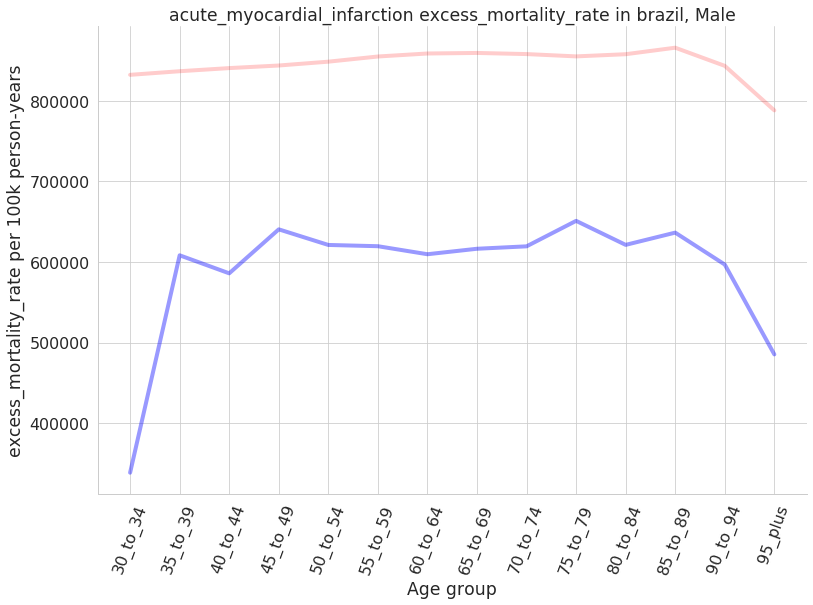

<Figure size 914.4x619.2 with 0 Axes>

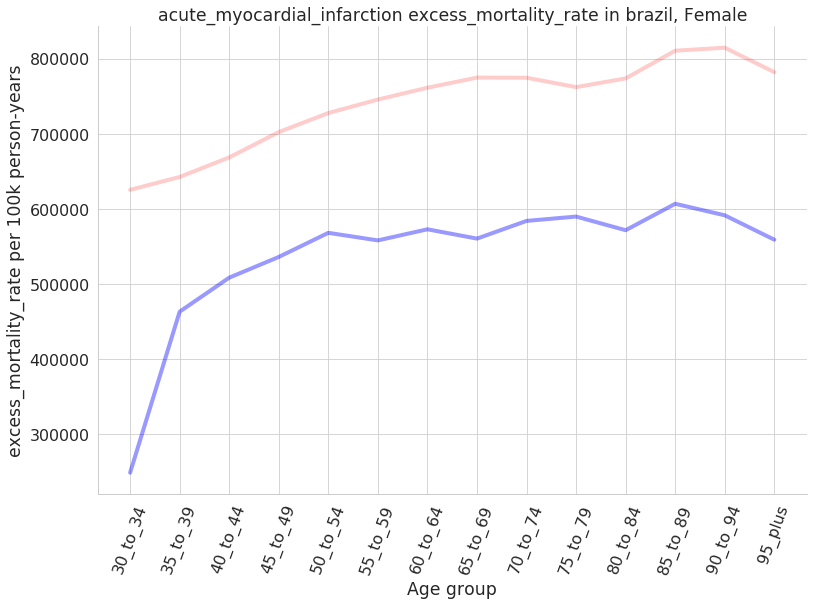

<Figure size 914.4x619.2 with 0 Axes>

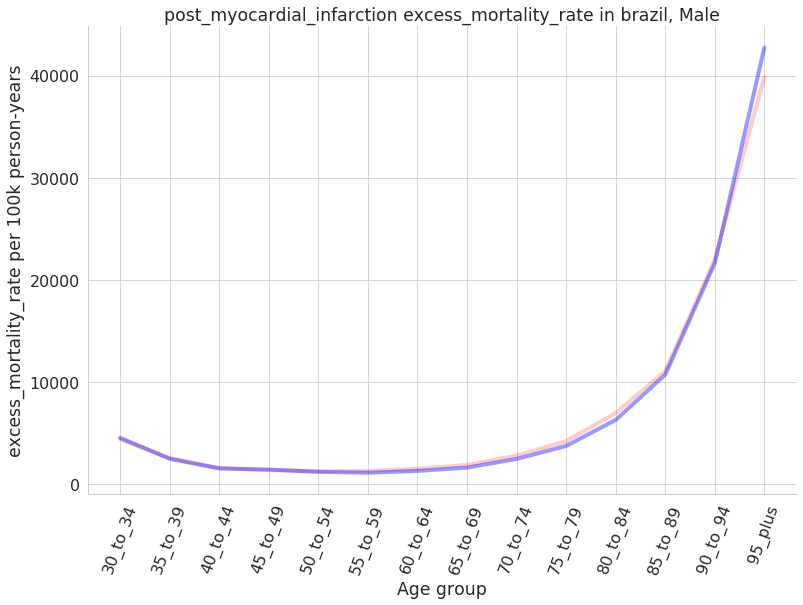

<Figure size 914.4x619.2 with 0 Axes>

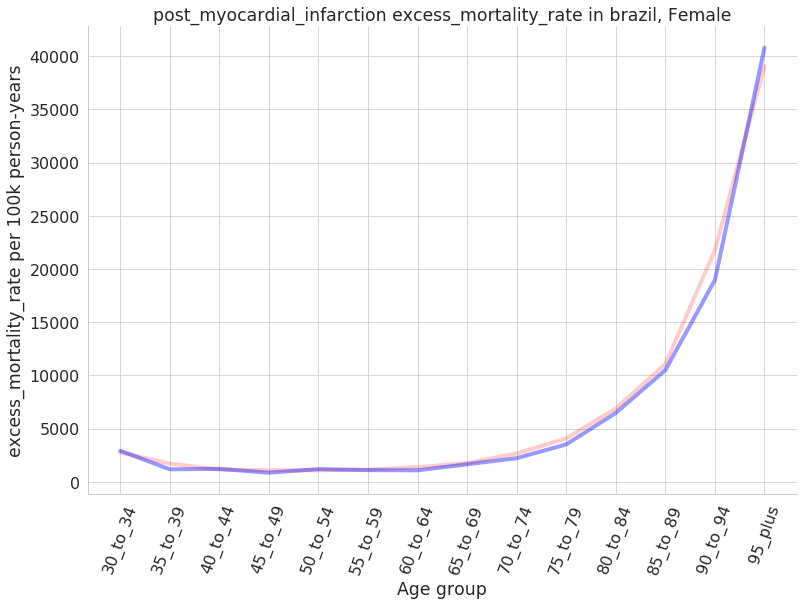

AttributeError: 'NoneType' object has no attribute 'finalize'

<Figure size 914.4x619.2 with 0 Axes>

In [39]:
plot_results_compare_artifact_model(artifact_emr, locations, emr)

### Compare Zenon Model 4 vs. GBD 2017 estimates

In [117]:
def plot_results(rates,locations,gbd):
    cause_names = ['chronic_kidney_disease','diabetes_mellitus','ischemic_heart_disease', 'ischemic_stroke']
    for cause in cause_names:
        with PdfPages(str(save_path)+f'/{cause}_m4.2.pdf') as pdf:        
            for sex in ['Male', 'Female']:
                for measure in ['deaths','ylls', 'ylds', 'prevalence', 'incidence']:
                    for location in locations:
                        data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.measure == measure) & (rates.location == location) & (rates.year == '2020')]
                        data_m = data_r.groupby(['age_group']).value.mean().reset_index()
                        data_g = gbd[(gbd.cause == cause) & (gbd.sex == sex) & (gbd.measure == measure) & (gbd.location == location)]

                        g = sns.catplot(x='age_group', y='value',
                                        height=10, aspect=1.2, alpha=0.4,
                                        data=data_r)
                        sns.scatterplot(x='age_group', y='value', 
                                        s=400, marker='P',
                                        ax=g.ax, legend=False, data=data_m)
                        sns.lineplot(x='age_group', y='val',
                                     color='red', linewidth=4, legend=False, 
                                     ax=g.ax, data=data_g)

                        g.ax.fill_between(data_g.age_group, data_g.upper, data_g.lower, alpha=0.3, facecolor='red')

                        g.ax.set_title(f'{cause} {measure} in {location}, {sex}')
                        g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=70)
                        g.ax.set_xlabel('Age group')
                        g.ax.set_ylabel(f'{measure} per 100k person-years')

                        pdf.savefig(g.fig, orientation = 'landscape', bbox_inches='tight')

                        plt.show()
                        plt.clf() 

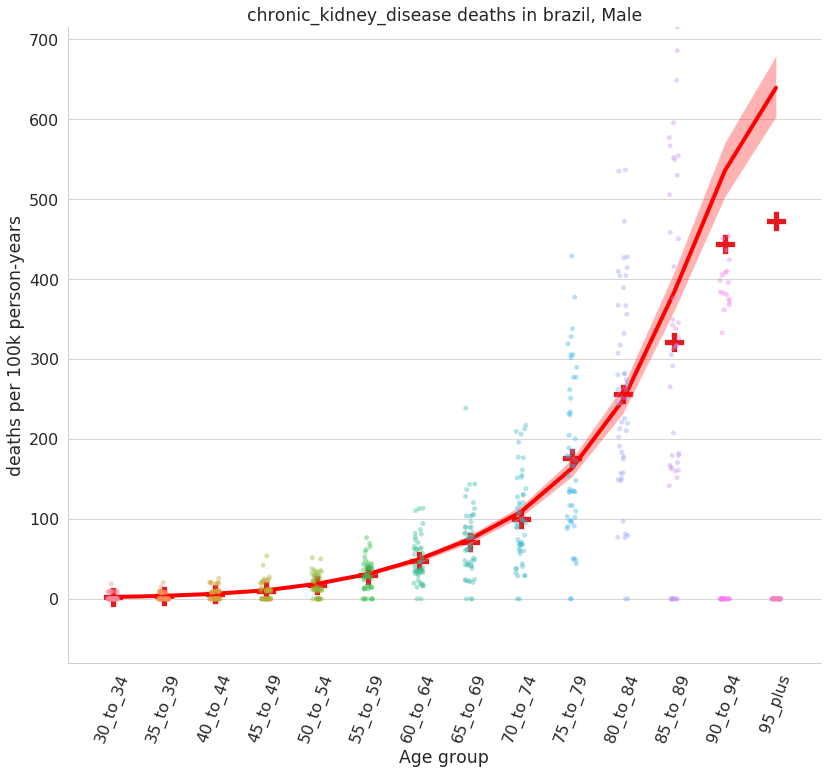

<Figure size 914.4x619.2 with 0 Axes>

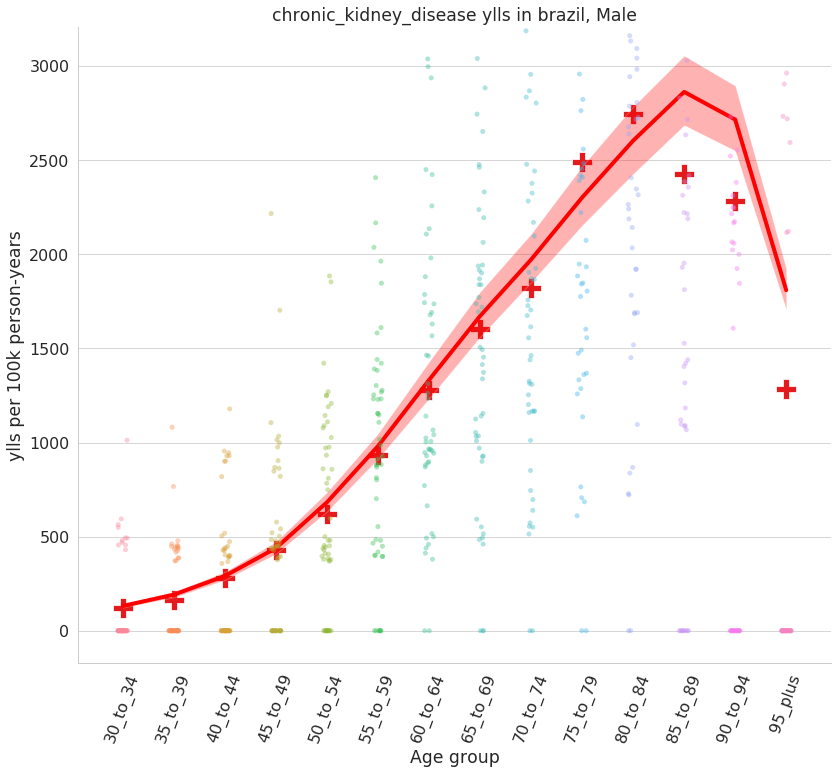

<Figure size 914.4x619.2 with 0 Axes>

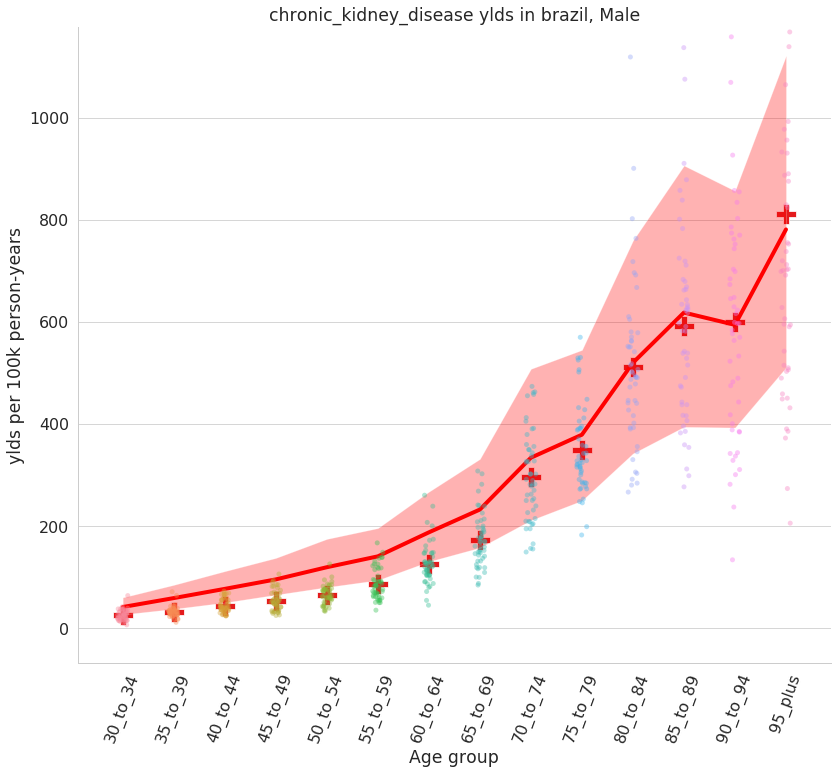

<Figure size 914.4x619.2 with 0 Axes>

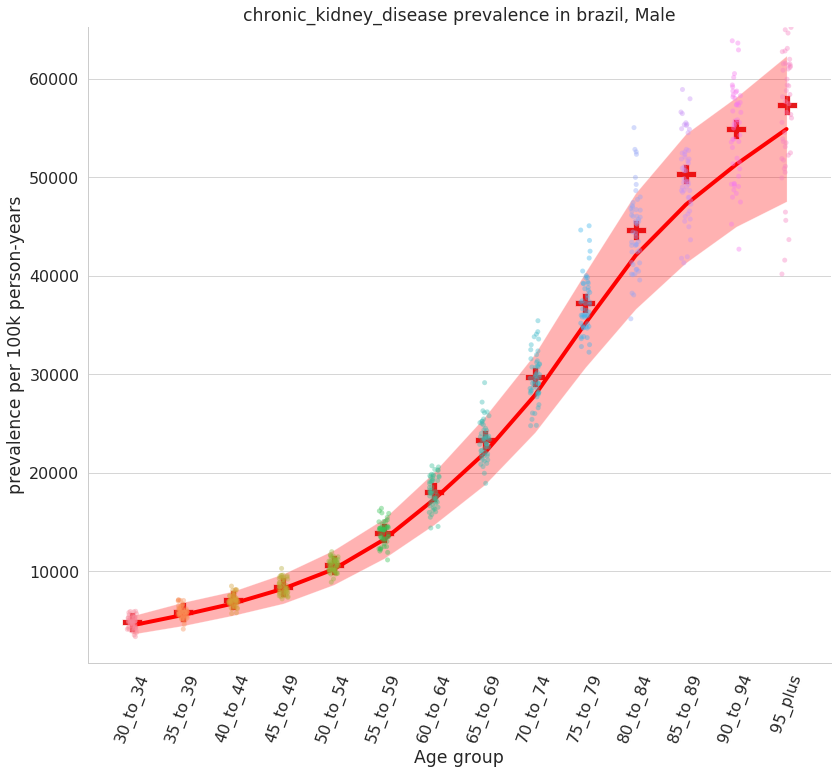

<Figure size 914.4x619.2 with 0 Axes>

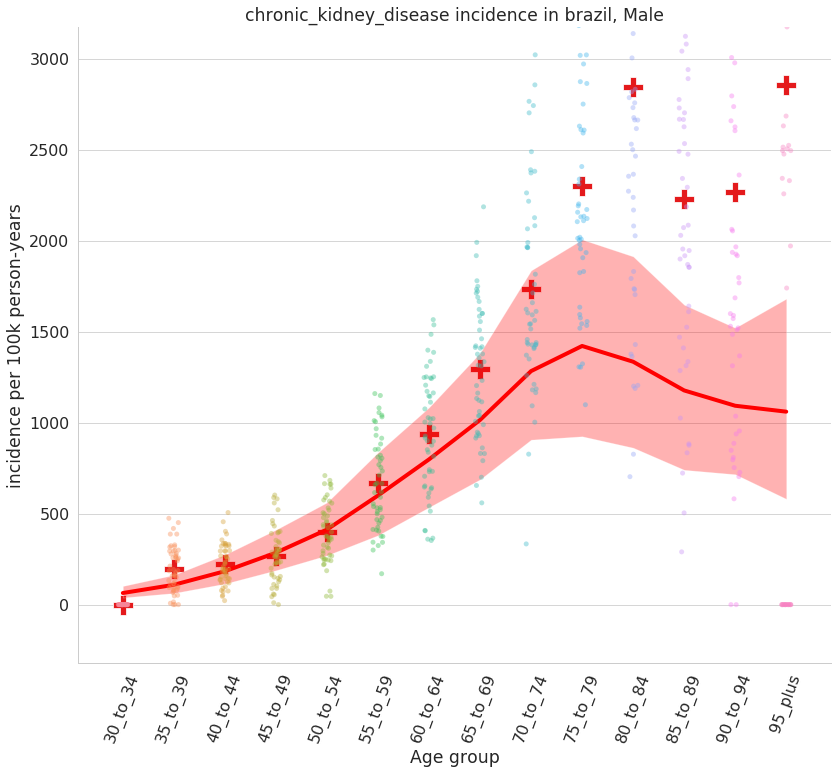

<Figure size 914.4x619.2 with 0 Axes>

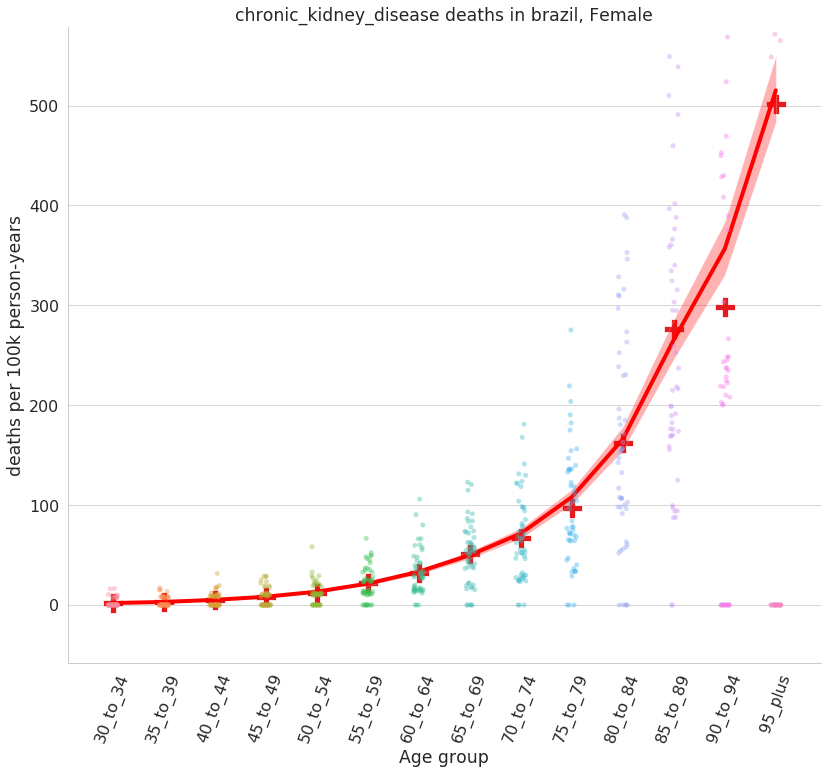

<Figure size 914.4x619.2 with 0 Axes>

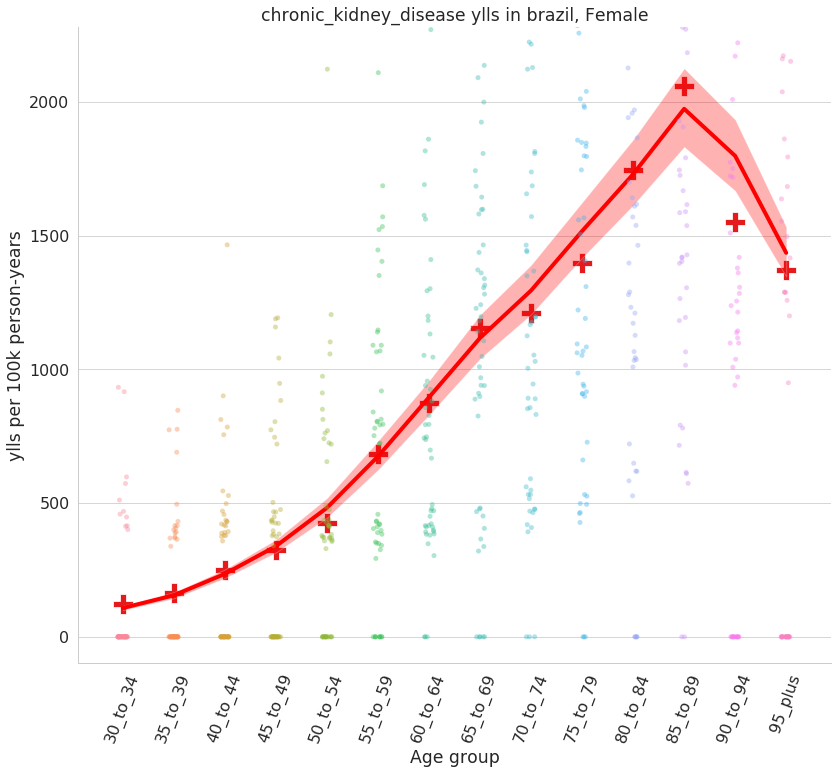

<Figure size 914.4x619.2 with 0 Axes>

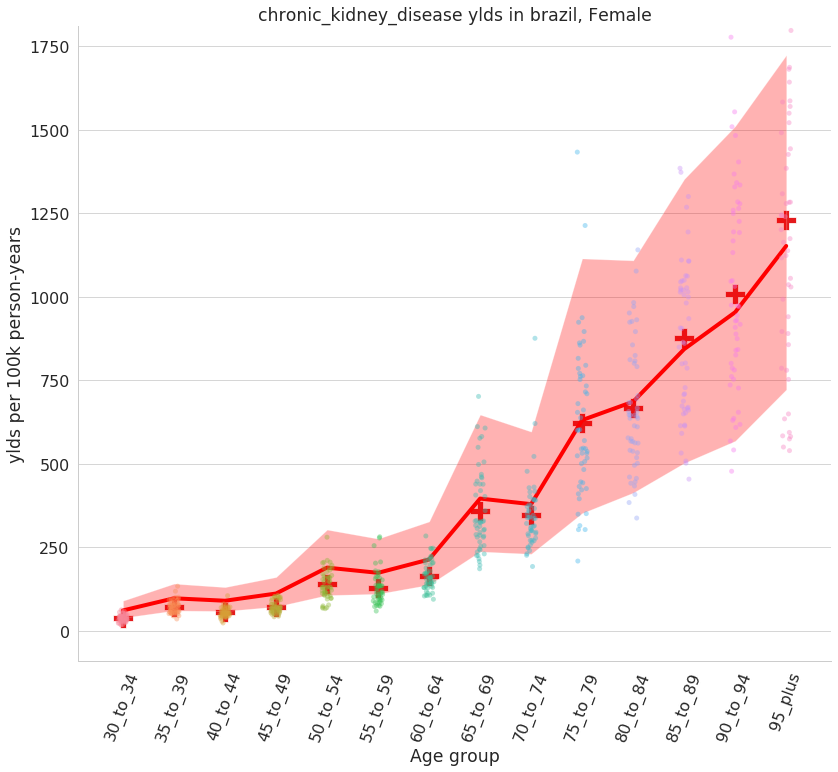

<Figure size 914.4x619.2 with 0 Axes>

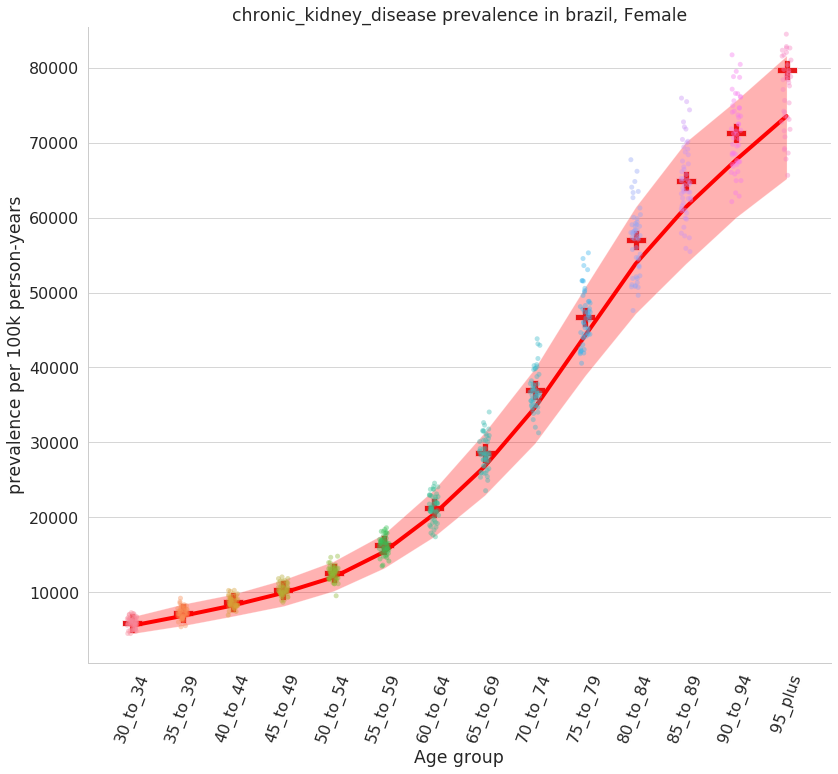

<Figure size 914.4x619.2 with 0 Axes>

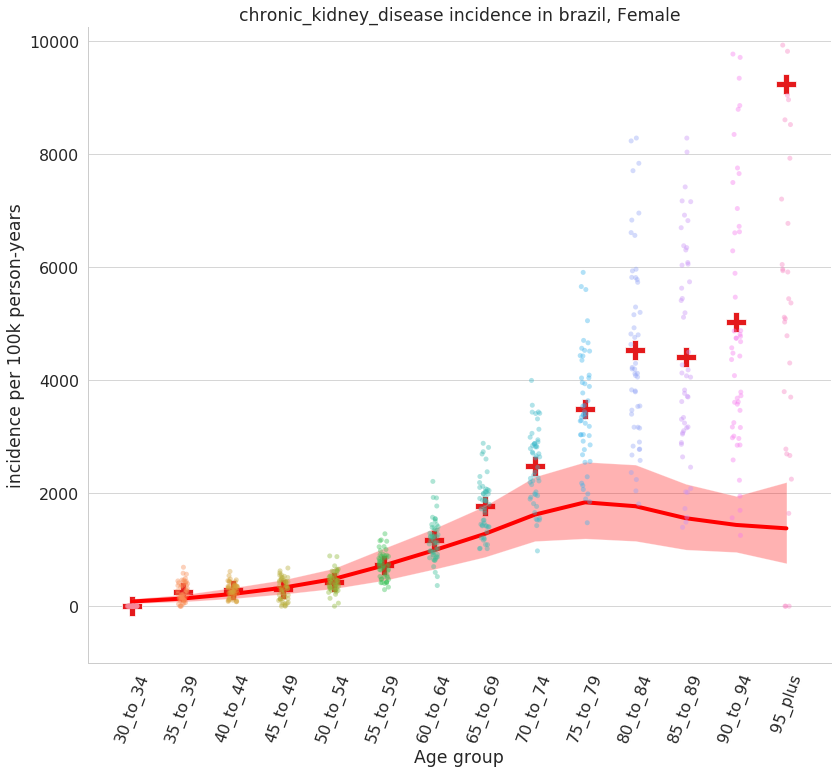

<Figure size 914.4x619.2 with 0 Axes>

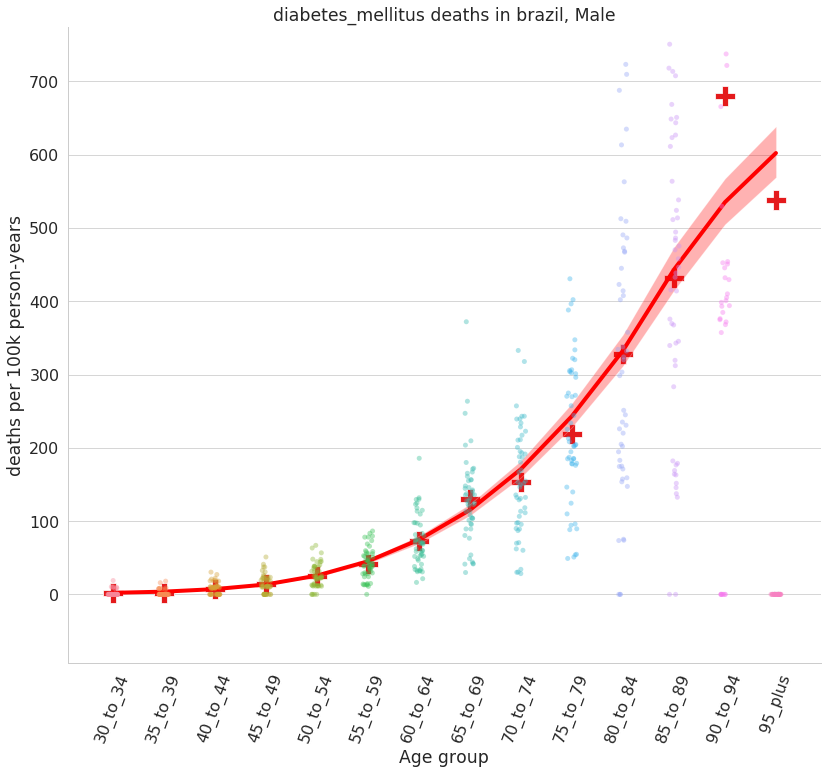

<Figure size 914.4x619.2 with 0 Axes>

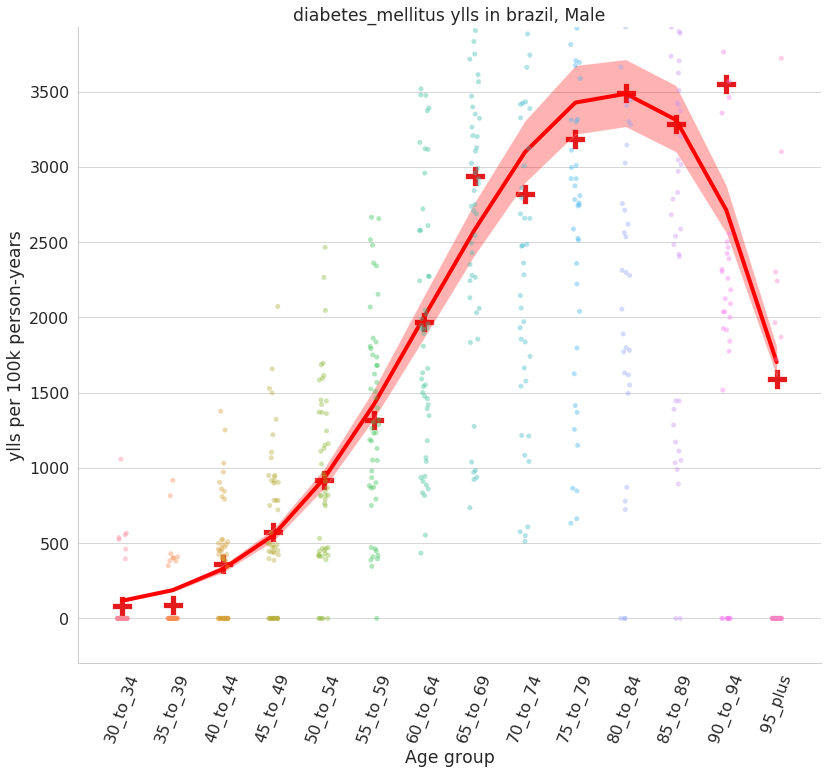

<Figure size 914.4x619.2 with 0 Axes>

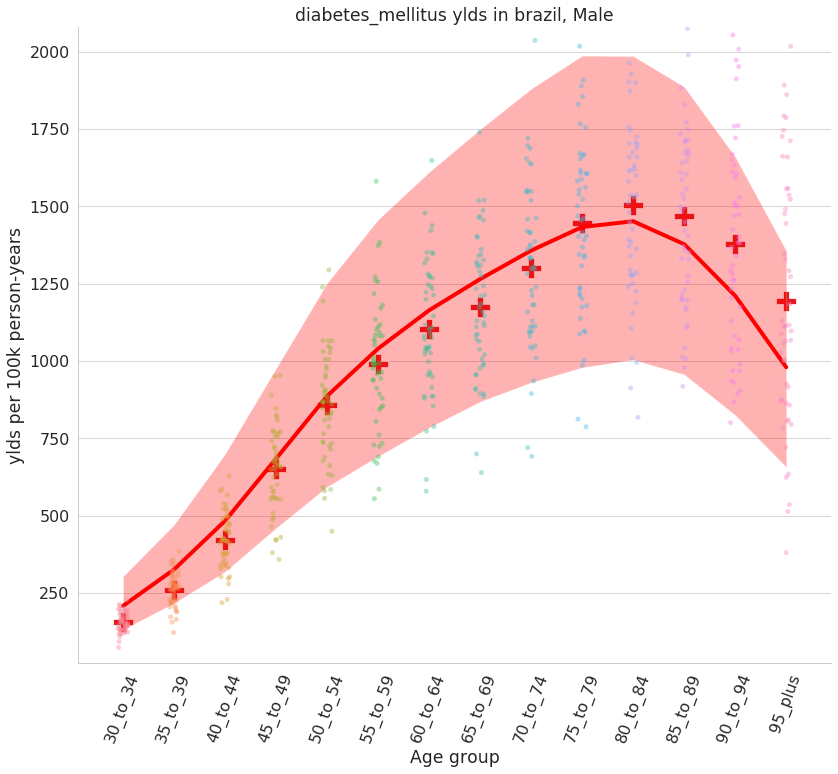

<Figure size 914.4x619.2 with 0 Axes>

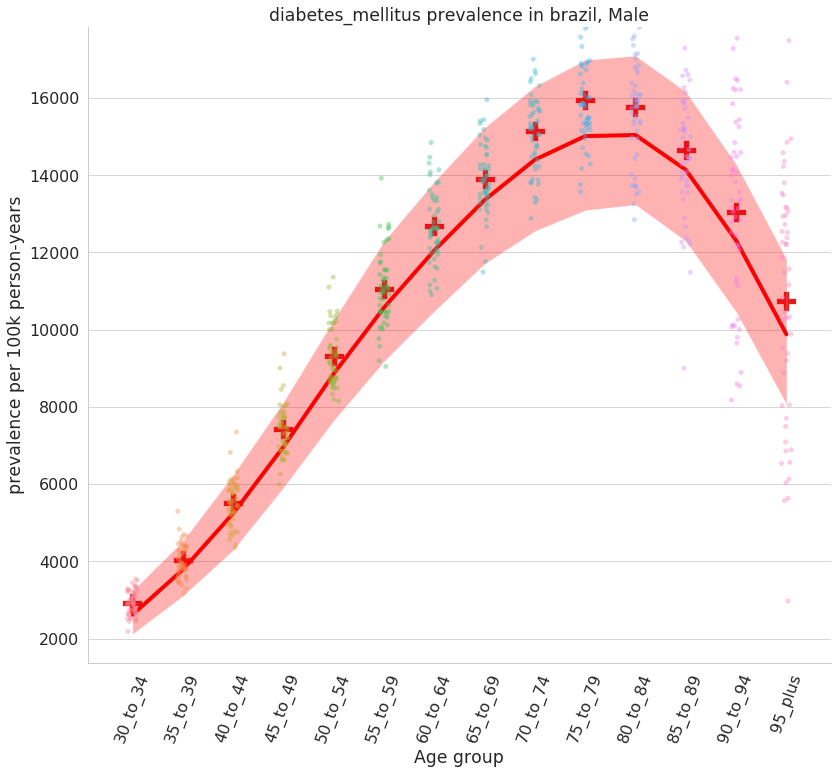

<Figure size 914.4x619.2 with 0 Axes>

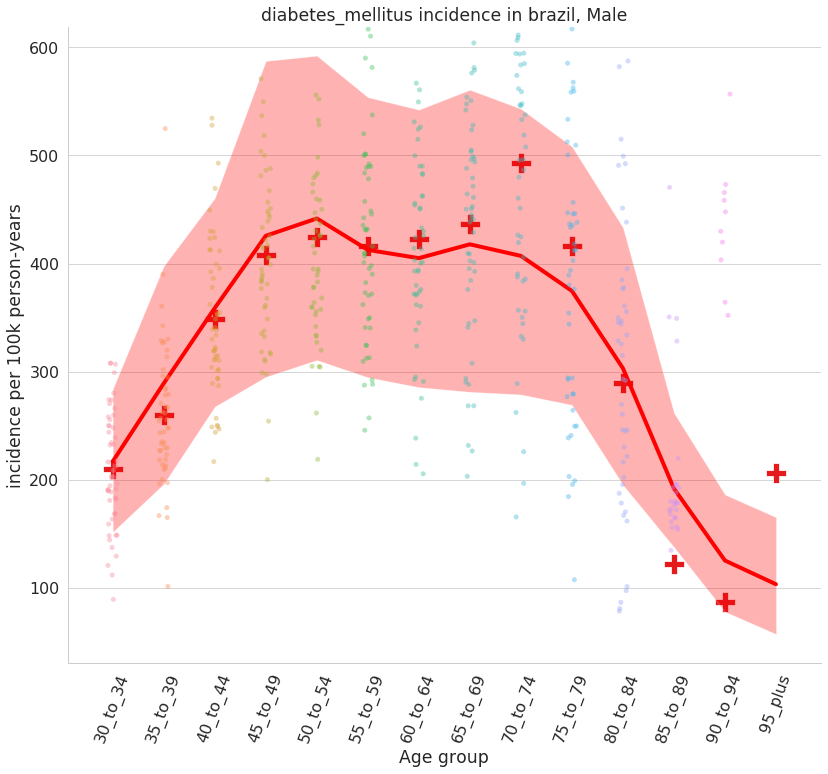

<Figure size 914.4x619.2 with 0 Axes>

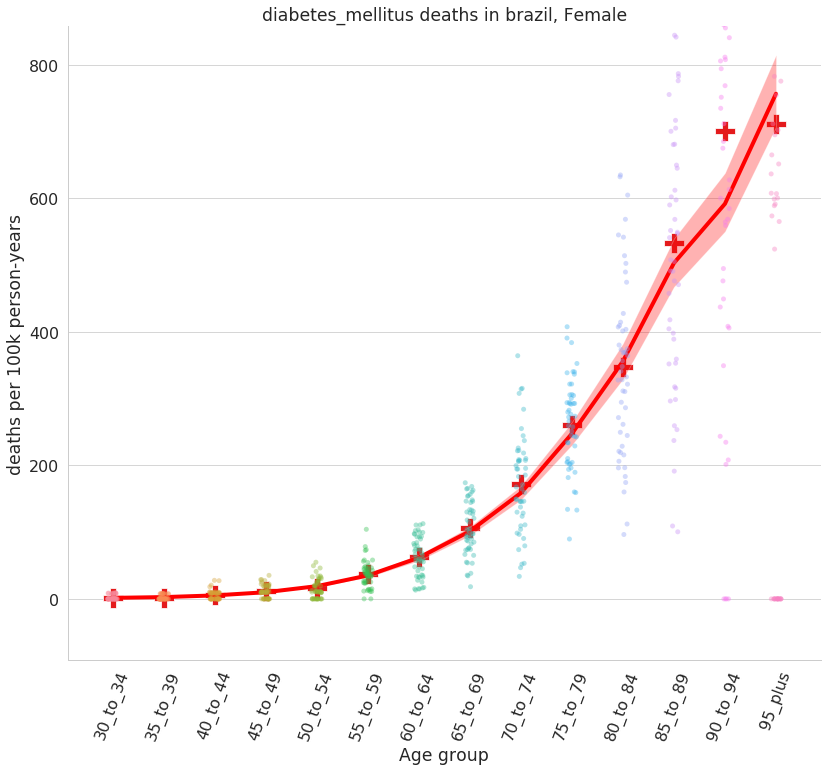

<Figure size 914.4x619.2 with 0 Axes>

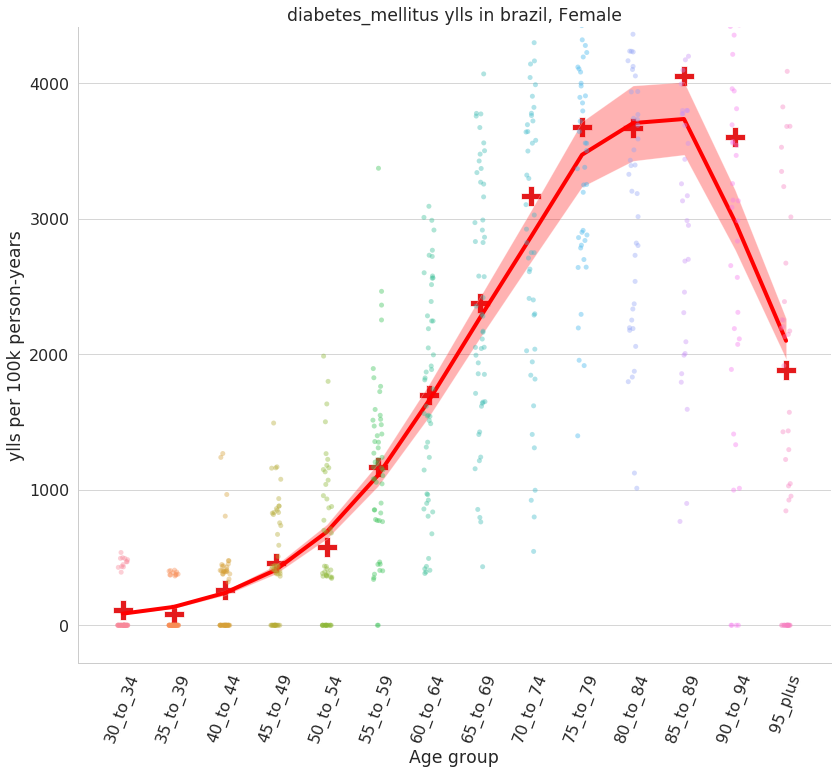

<Figure size 914.4x619.2 with 0 Axes>

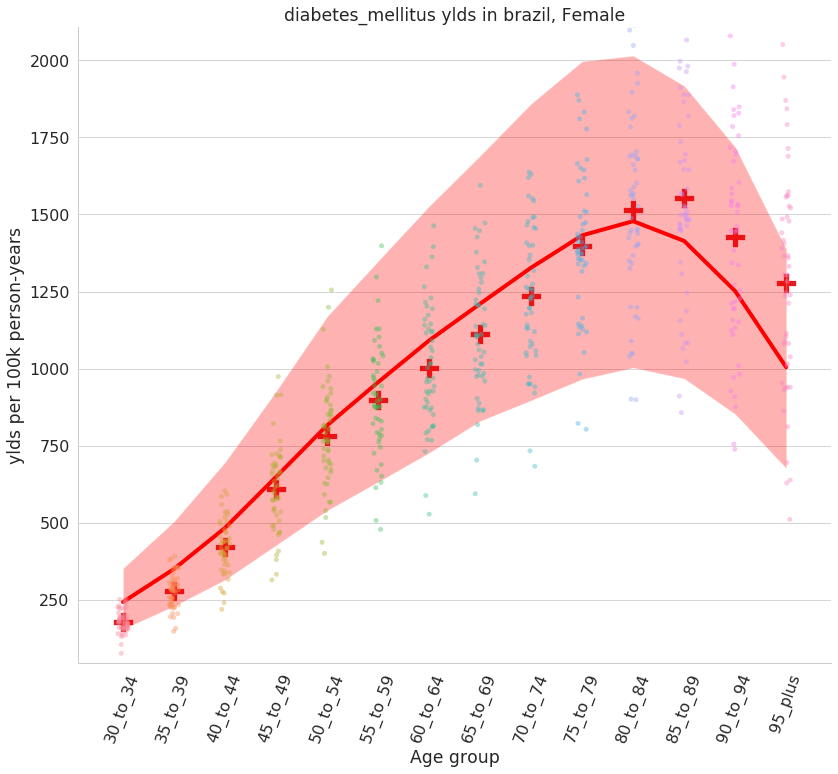

<Figure size 914.4x619.2 with 0 Axes>

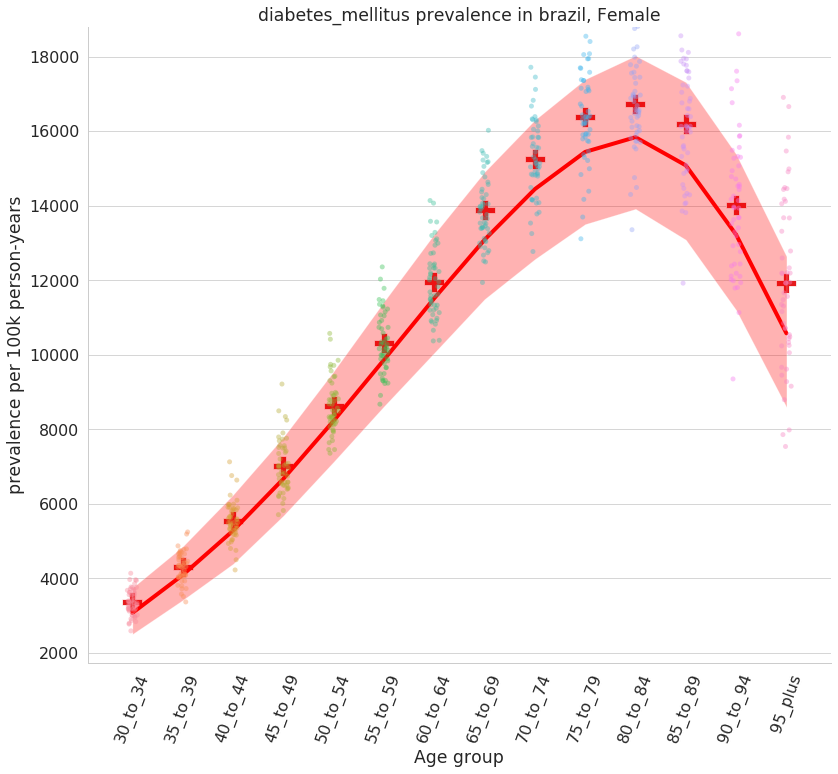

<Figure size 914.4x619.2 with 0 Axes>

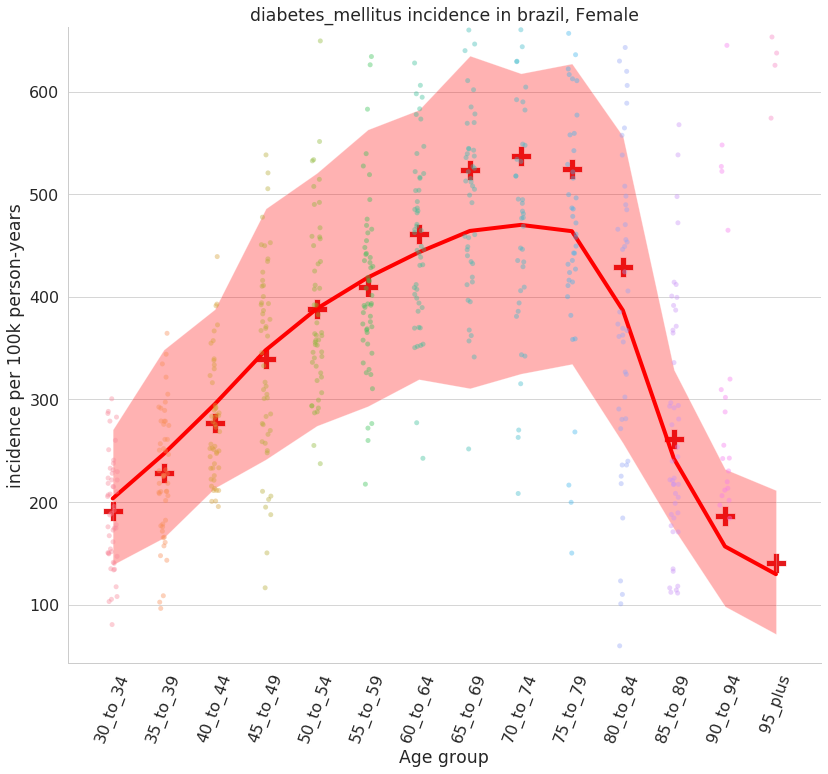

<Figure size 914.4x619.2 with 0 Axes>

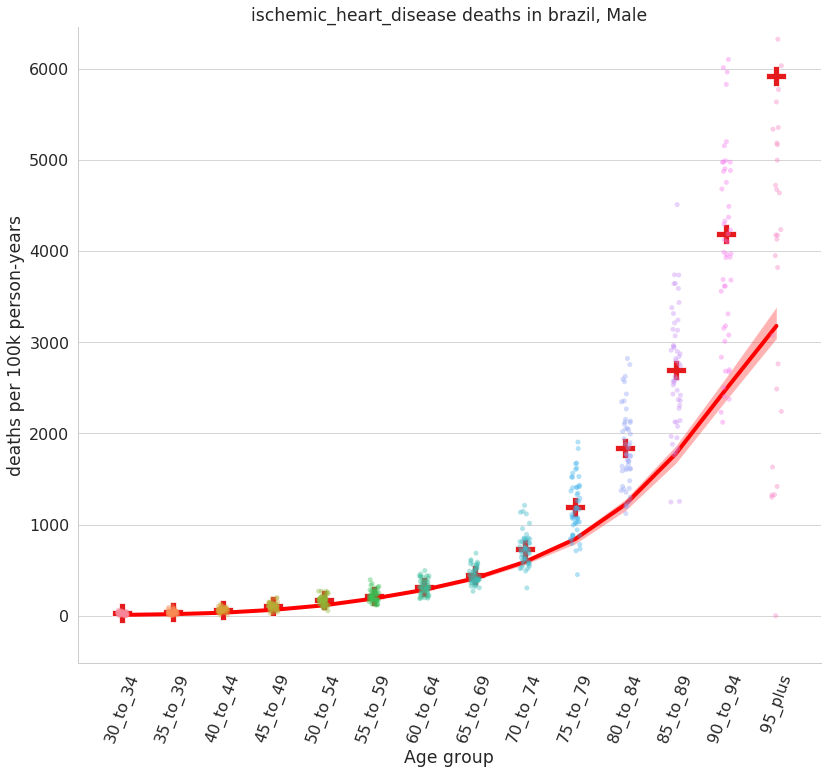

<Figure size 914.4x619.2 with 0 Axes>

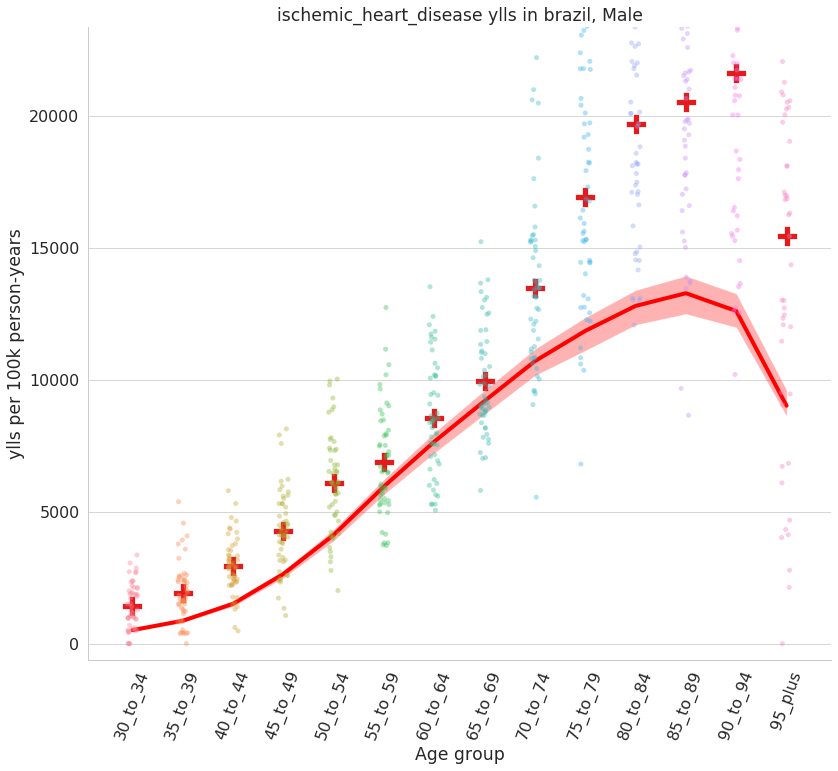

<Figure size 914.4x619.2 with 0 Axes>

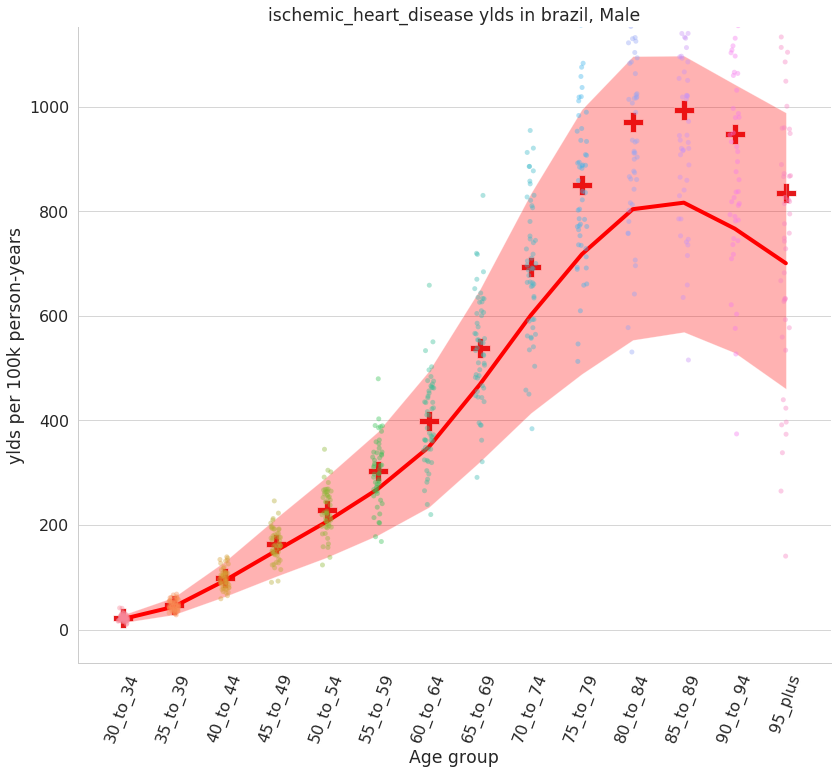

<Figure size 914.4x619.2 with 0 Axes>

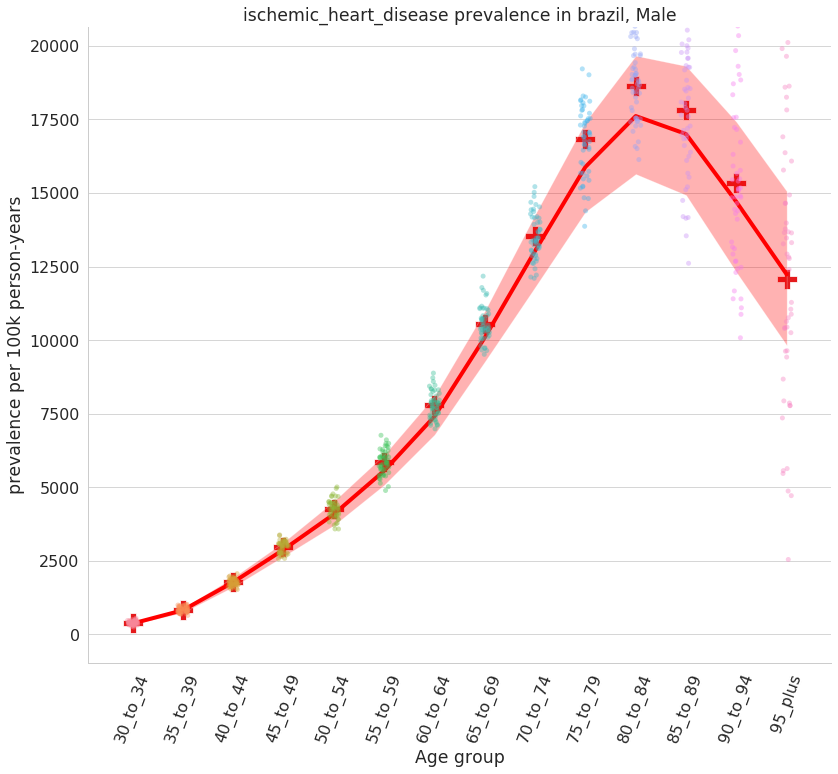

<Figure size 914.4x619.2 with 0 Axes>

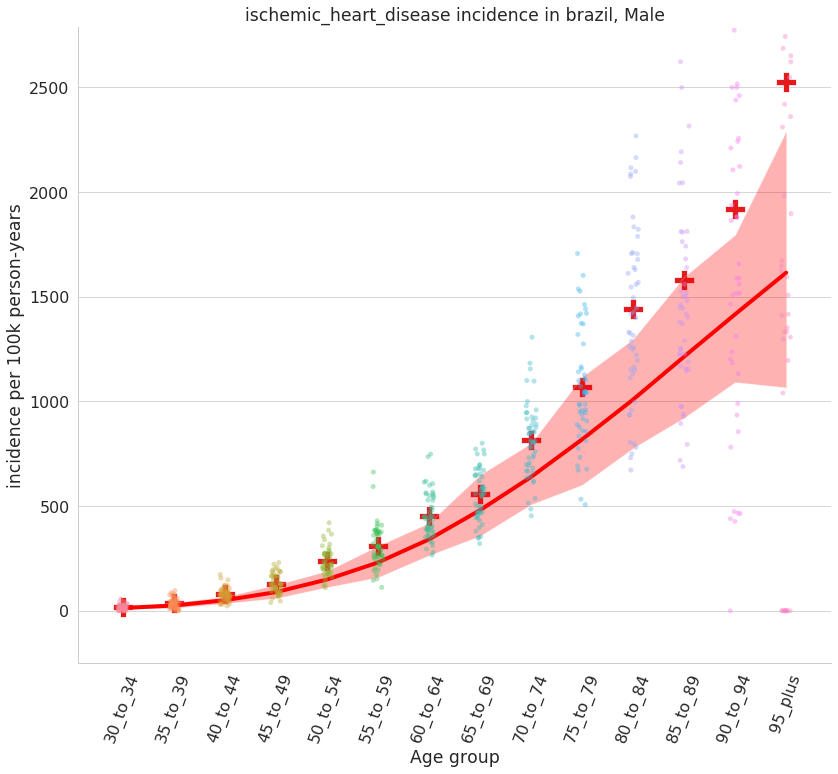

<Figure size 914.4x619.2 with 0 Axes>

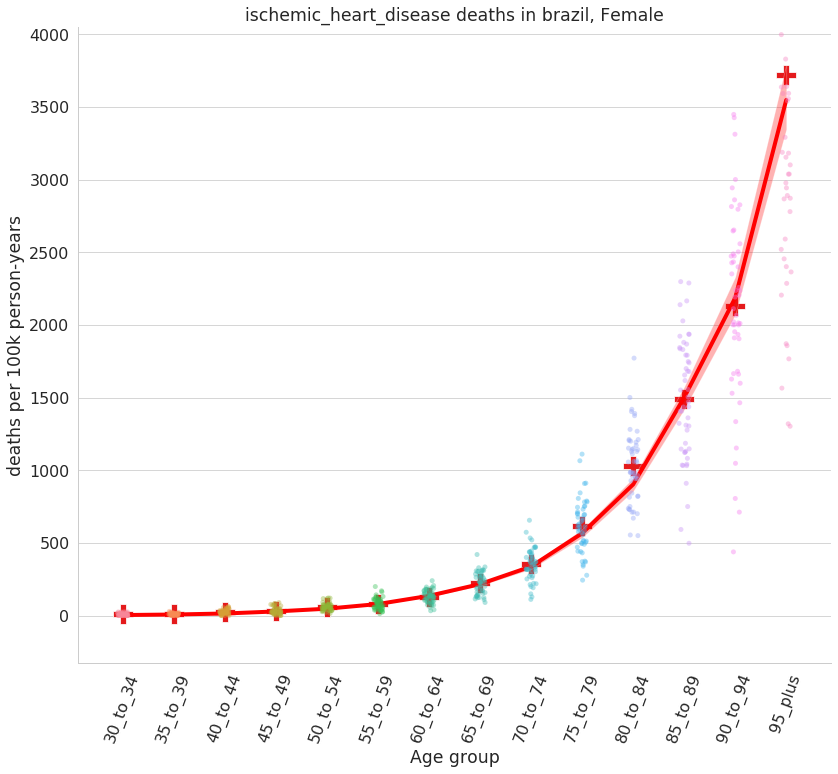

<Figure size 914.4x619.2 with 0 Axes>

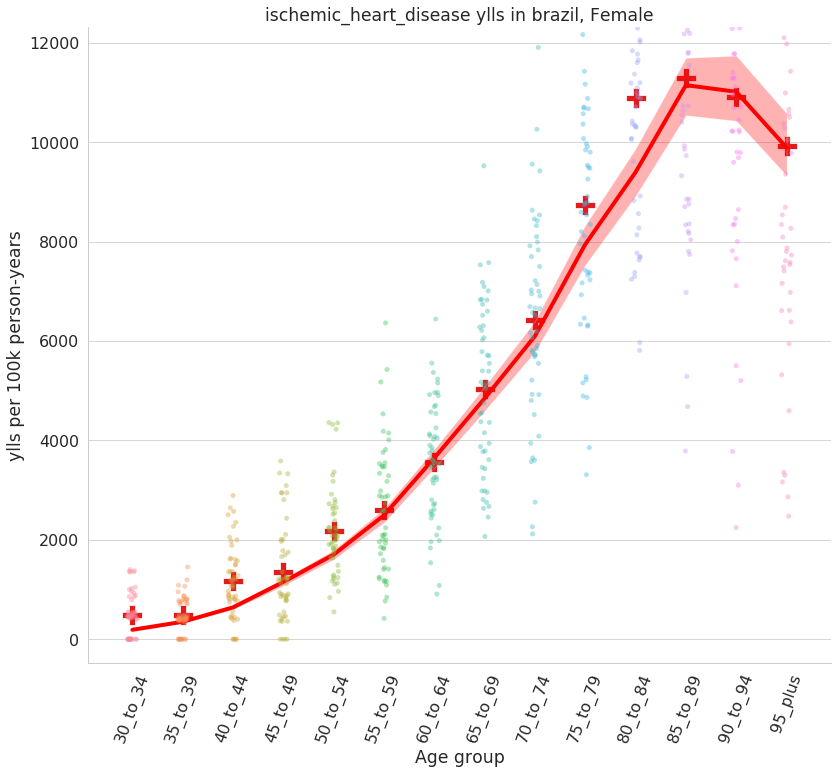

<Figure size 914.4x619.2 with 0 Axes>

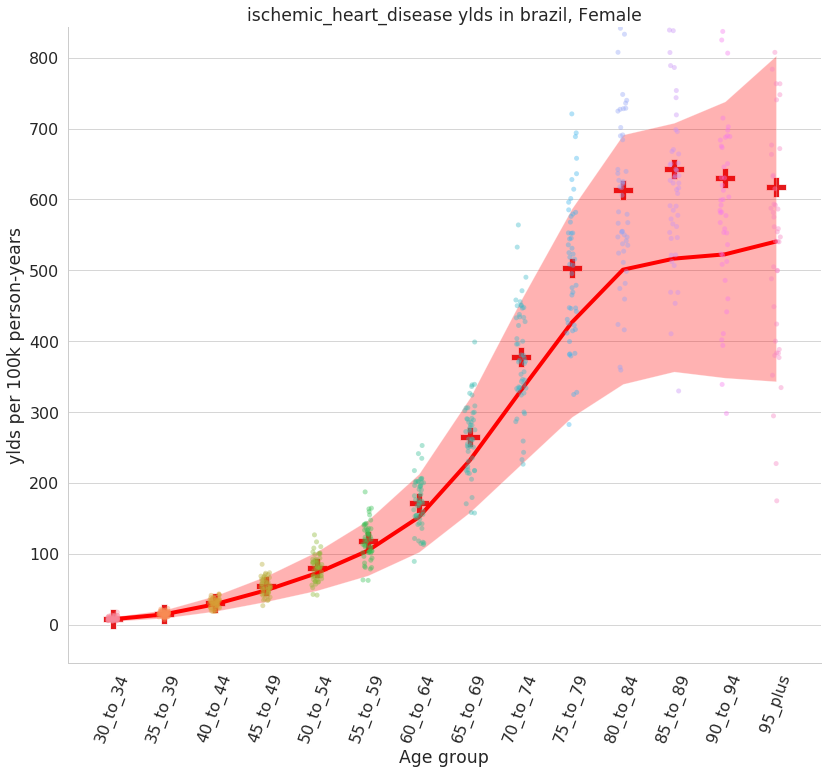

<Figure size 914.4x619.2 with 0 Axes>

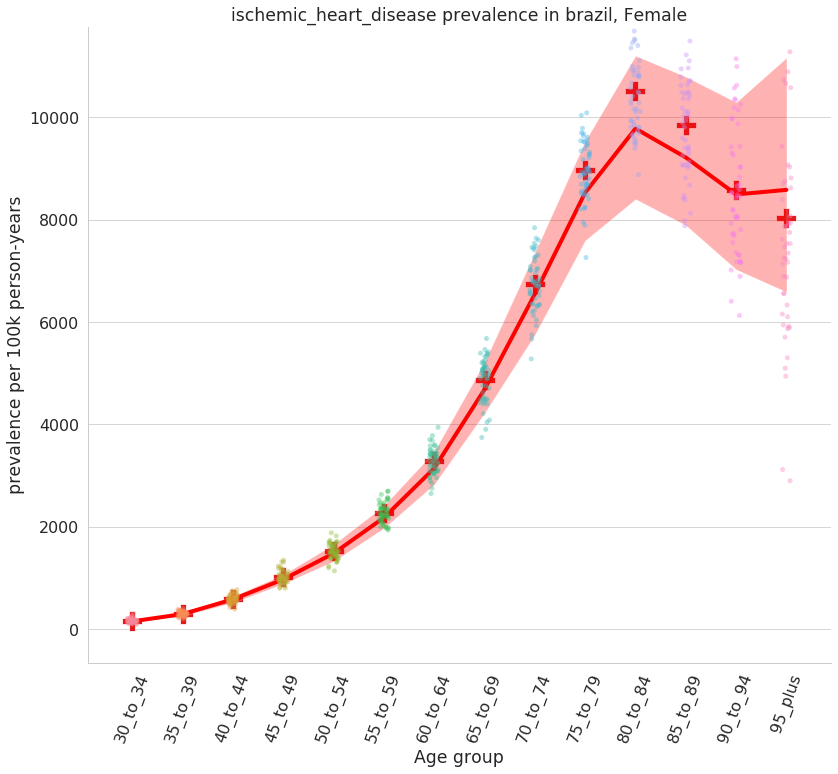

<Figure size 914.4x619.2 with 0 Axes>

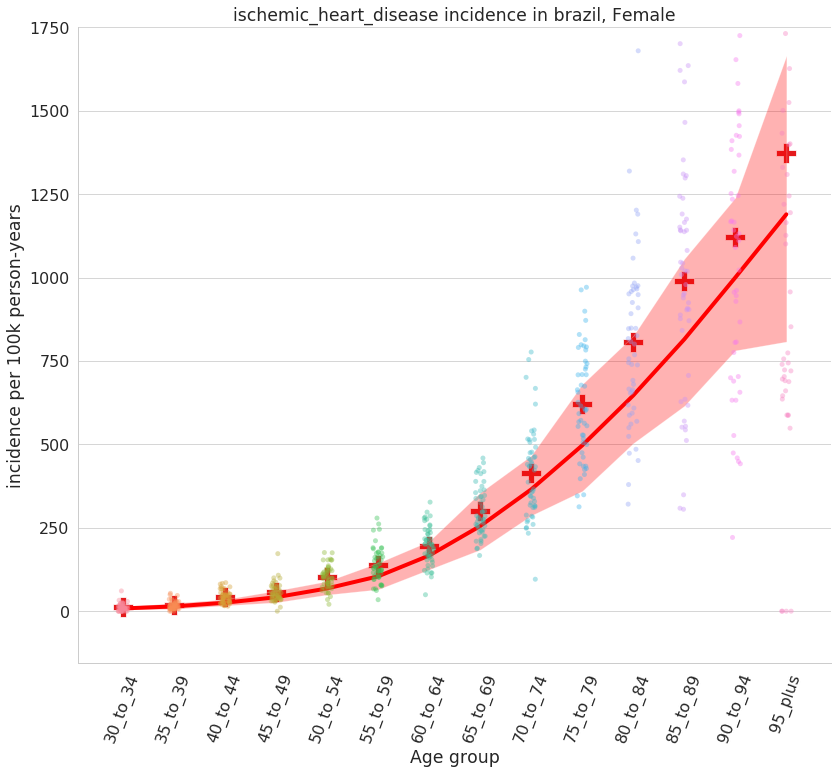

<Figure size 914.4x619.2 with 0 Axes>

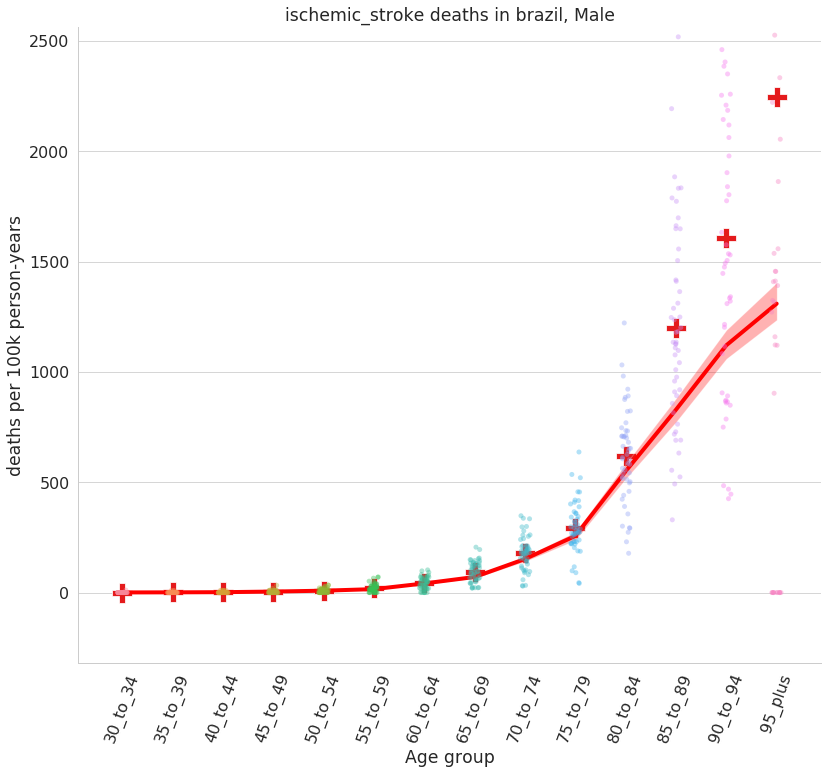

<Figure size 914.4x619.2 with 0 Axes>

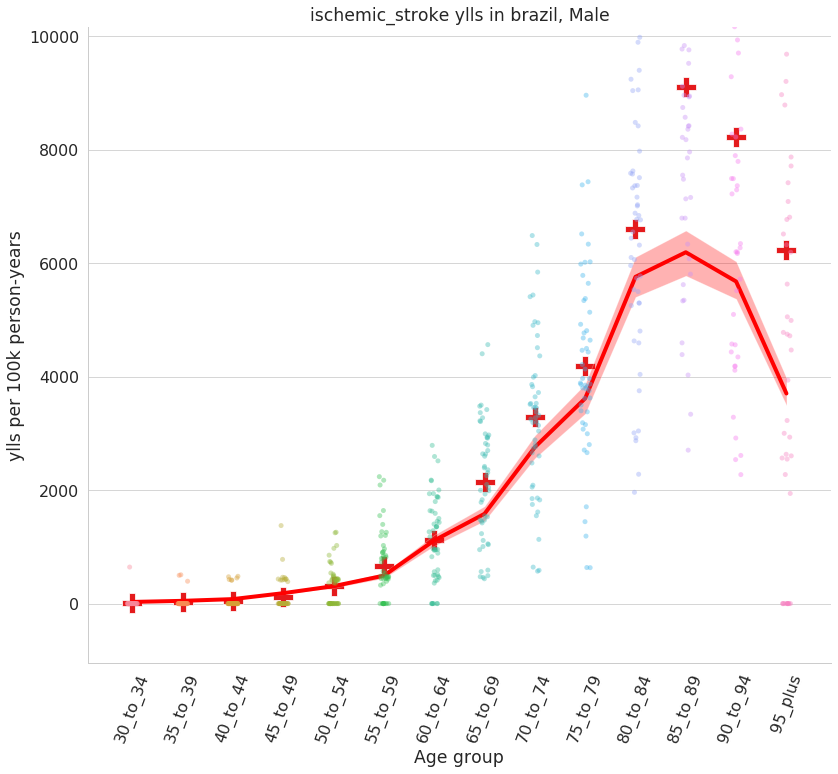

<Figure size 914.4x619.2 with 0 Axes>

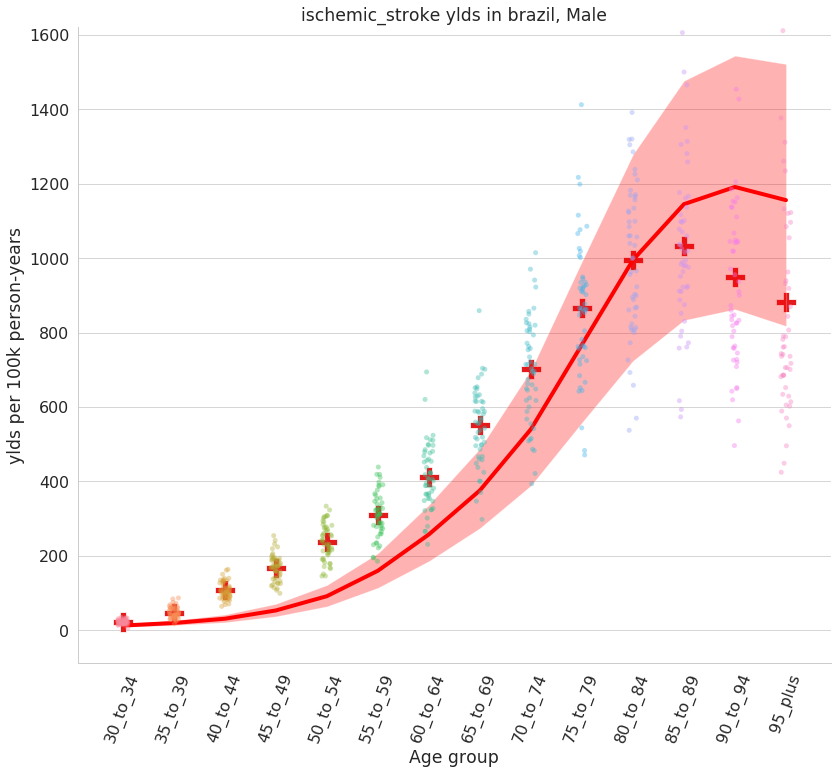

<Figure size 914.4x619.2 with 0 Axes>

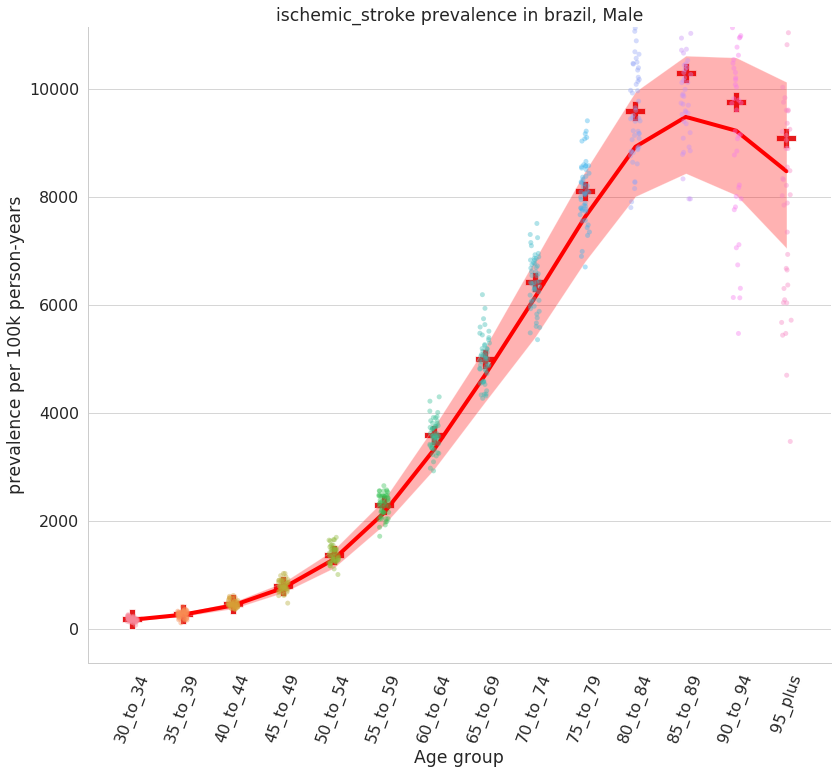

<Figure size 914.4x619.2 with 0 Axes>

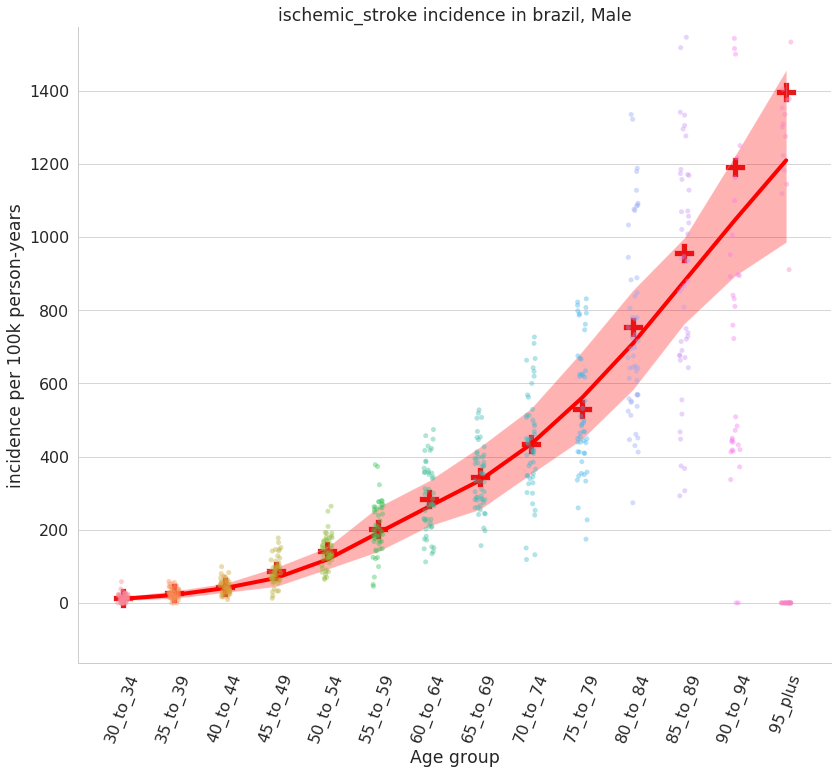

<Figure size 914.4x619.2 with 0 Axes>

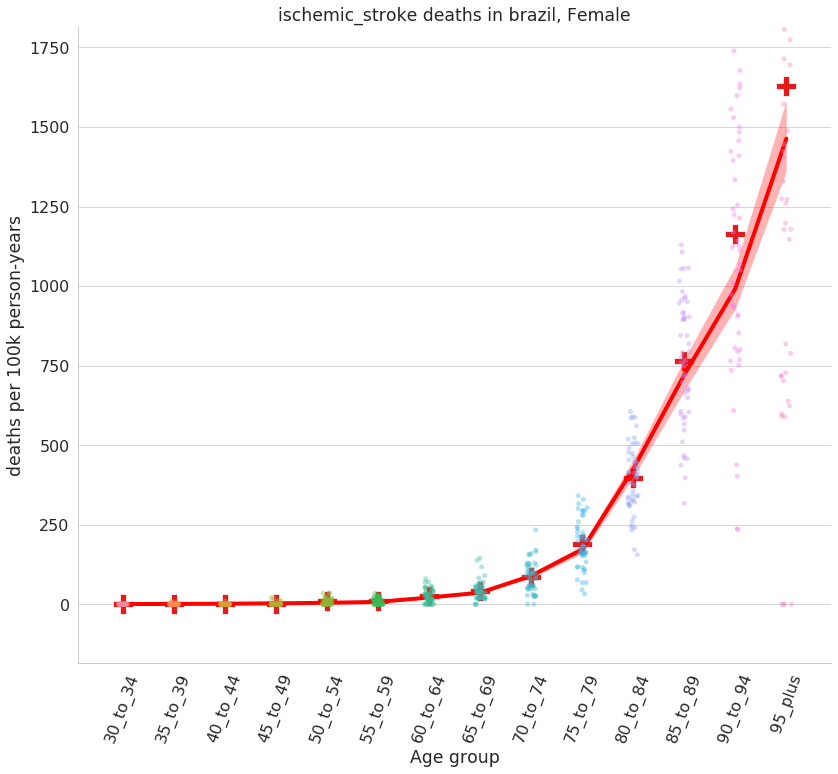

<Figure size 914.4x619.2 with 0 Axes>

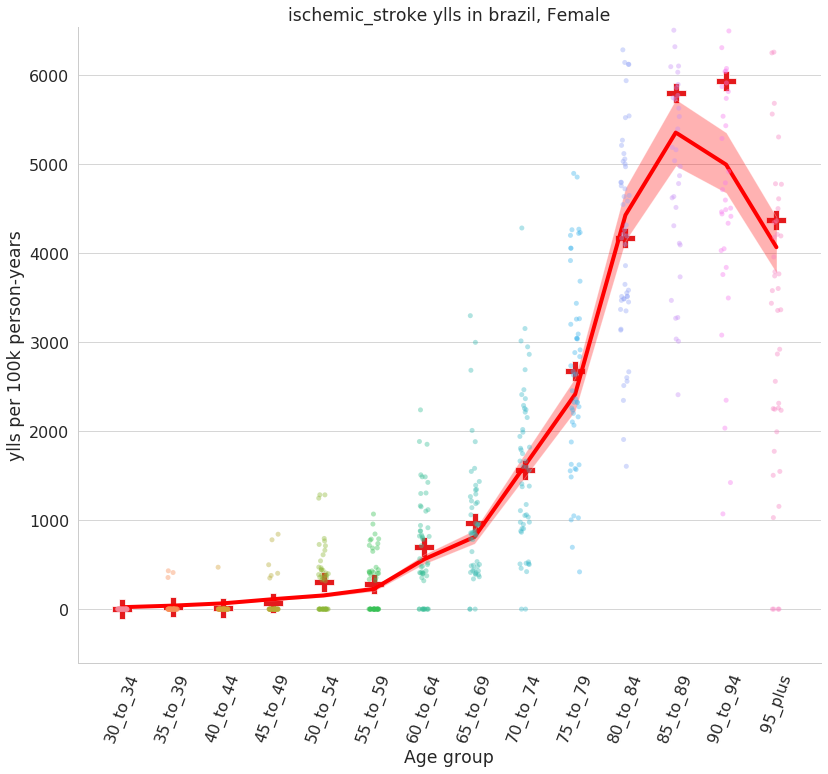

<Figure size 914.4x619.2 with 0 Axes>

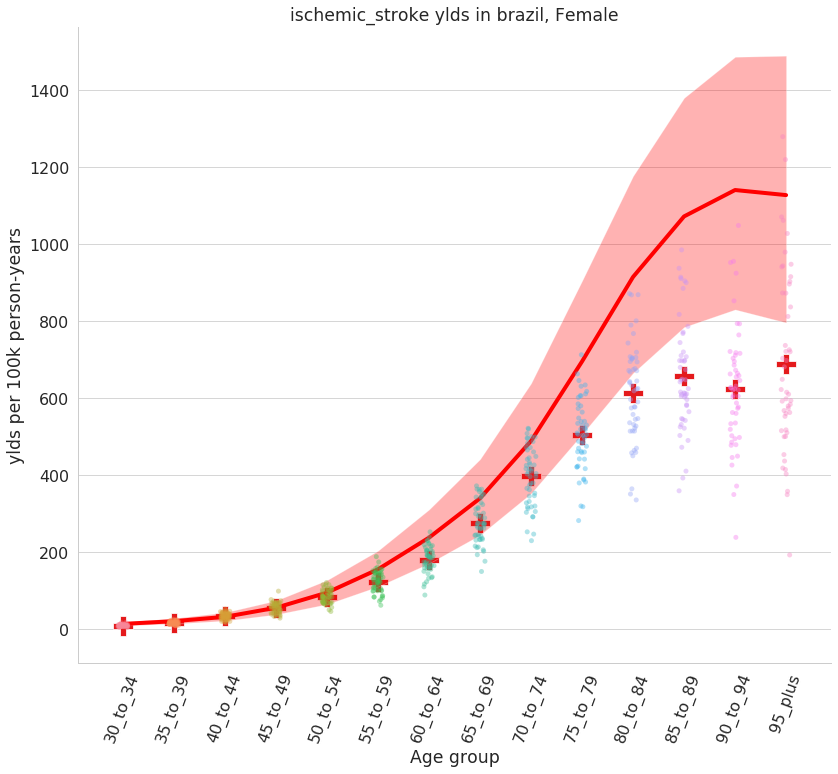

<Figure size 914.4x619.2 with 0 Axes>

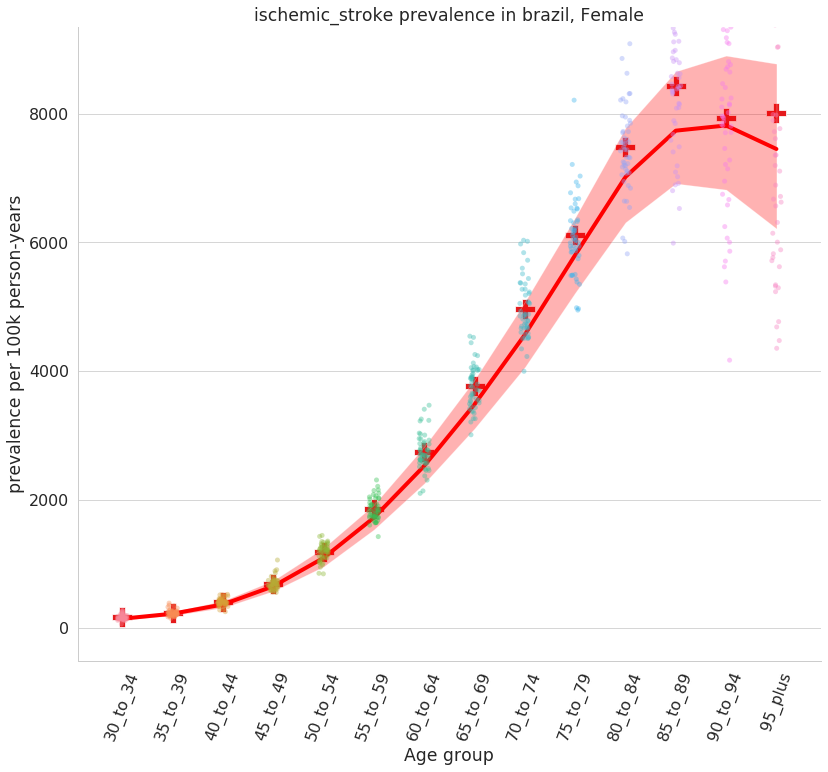

<Figure size 914.4x619.2 with 0 Axes>

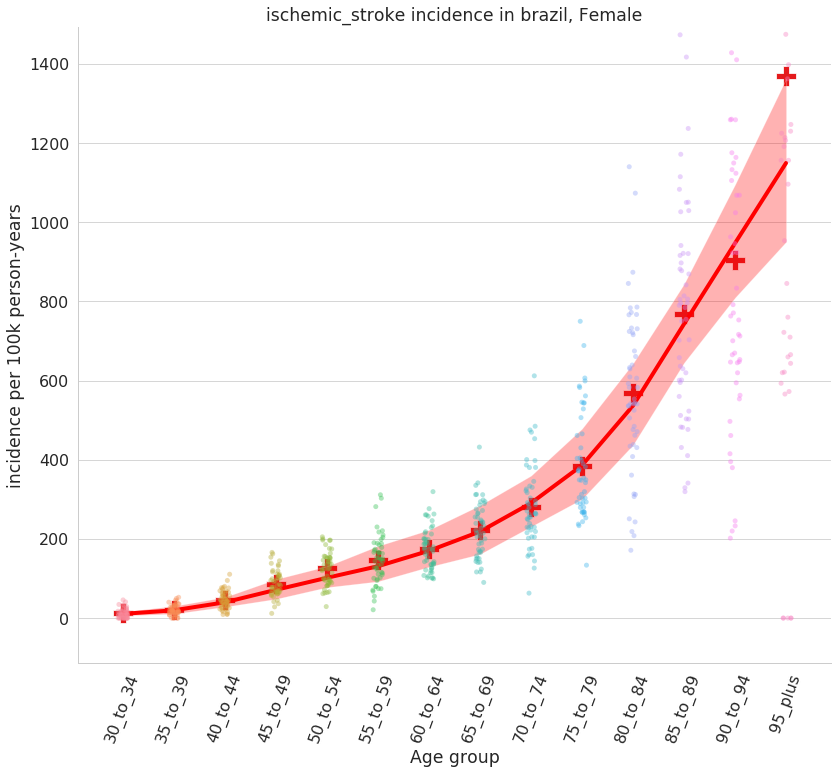

<Figure size 914.4x619.2 with 0 Axes>

In [118]:
plot_results(rates,locations,gbd)

In [120]:
def plot_results_cause_measure_loc(rates,locations,gbd):
    cause_names = ['chronic_kidney_disease','diabetes_mellitus','ischemic_heart_disease', 'ischemic_stroke']
    for cause in cause_names:
                for measure in ['deaths','ylls', 'ylds', 'prevalence', 'incidence']:
                    for location in locations:
                        with PdfPages(str(save_path)+f'/model_4/{cause}__{measure}_{location}_m4.2.pdf') as pdf: 
                            for sex in ['Male', 'Female']:
                                data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.measure == measure) & (rates.location == location) & (rates.year == '2020')]
                                data_m = data_r.groupby(['age_group']).value.mean().reset_index()
                                data_g = gbd[(gbd.cause == cause) & (gbd.sex == sex) & (gbd.measure == measure) & (gbd.location == location)]

                                g = sns.catplot(x='age_group', y='value',
                                                height=10, aspect=1.2, alpha=0.4,
                                                data=data_r)
                                sns.scatterplot(x='age_group', y='value', 
                                                s=400, marker='P',
                                                ax=g.ax, legend=False, data=data_m)
                                sns.lineplot(x='age_group', y='val',
                                             color='red', linewidth=4, legend=False, 
                                             ax=g.ax, data=data_g)

                                g.ax.fill_between(data_g.age_group, data_g.upper, data_g.lower, alpha=0.3, facecolor='red')

                                g.ax.set_title(f'{cause} {measure} in {location}, {sex}')
                                g.ax.set_xticklabels(g.ax.get_xticklabels(), rotation=70)
                                g.ax.set_xlabel('Age group')
                                g.ax.set_ylabel(f'{measure} per 100k person-years')

                                pdf.savefig(g.fig, orientation = 'landscape', bbox_inches='tight')

                                plt.show()
                                plt.clf() 

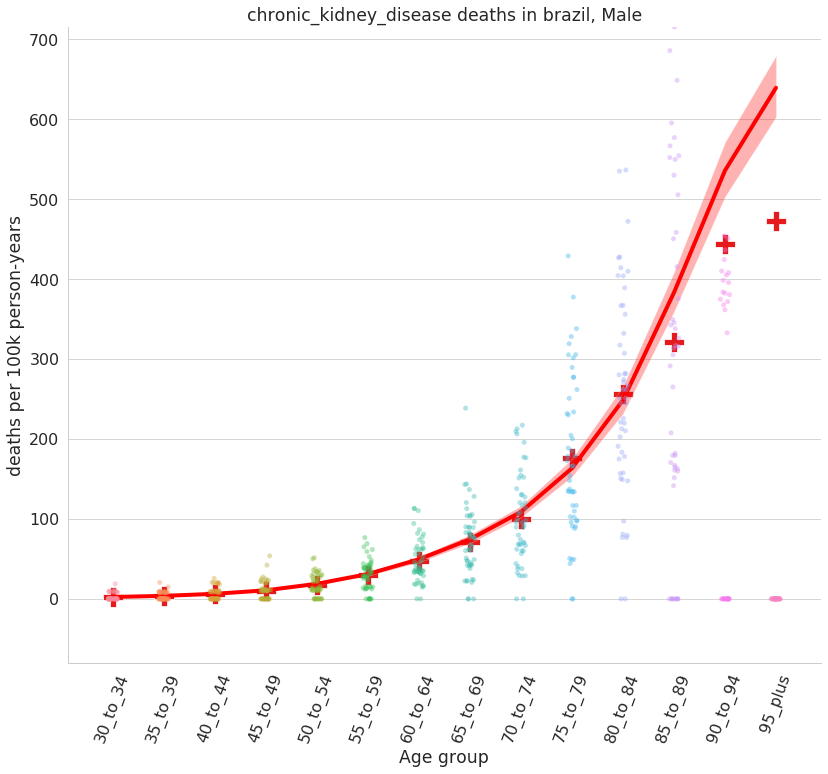

<Figure size 914.4x619.2 with 0 Axes>

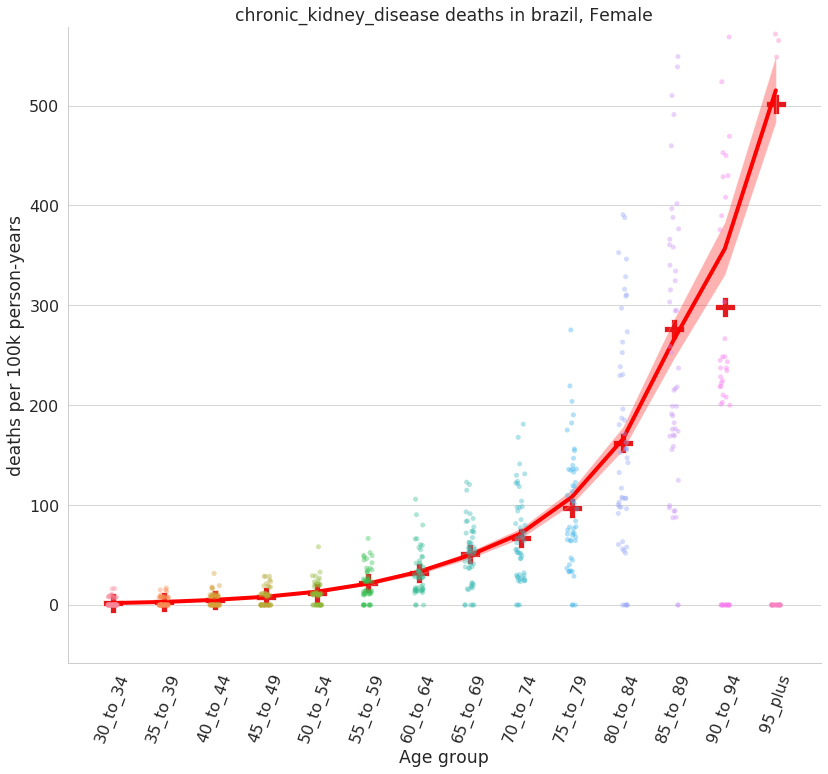

<Figure size 914.4x619.2 with 0 Axes>

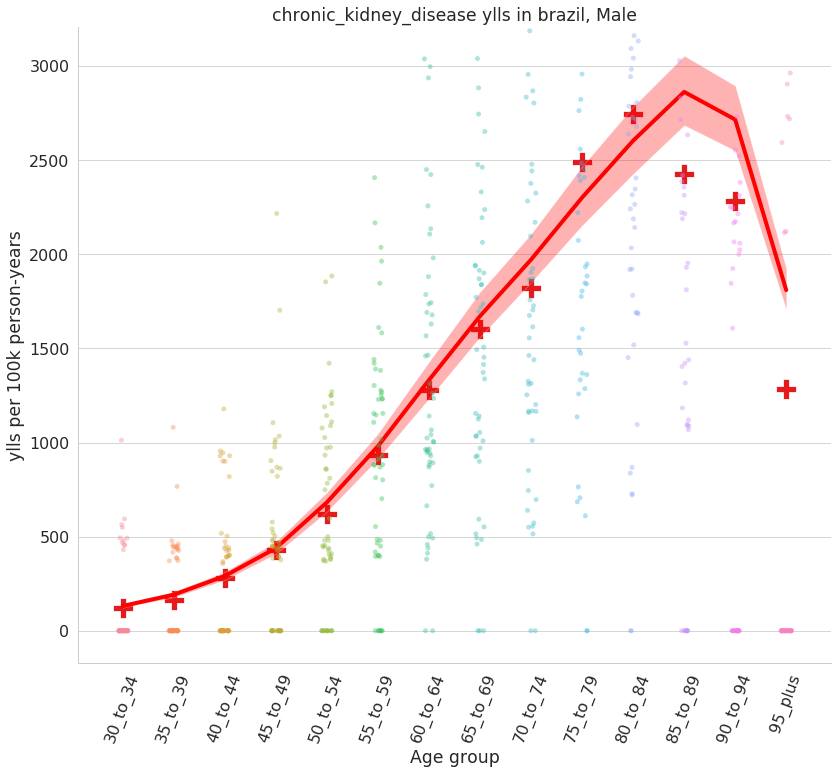

<Figure size 914.4x619.2 with 0 Axes>

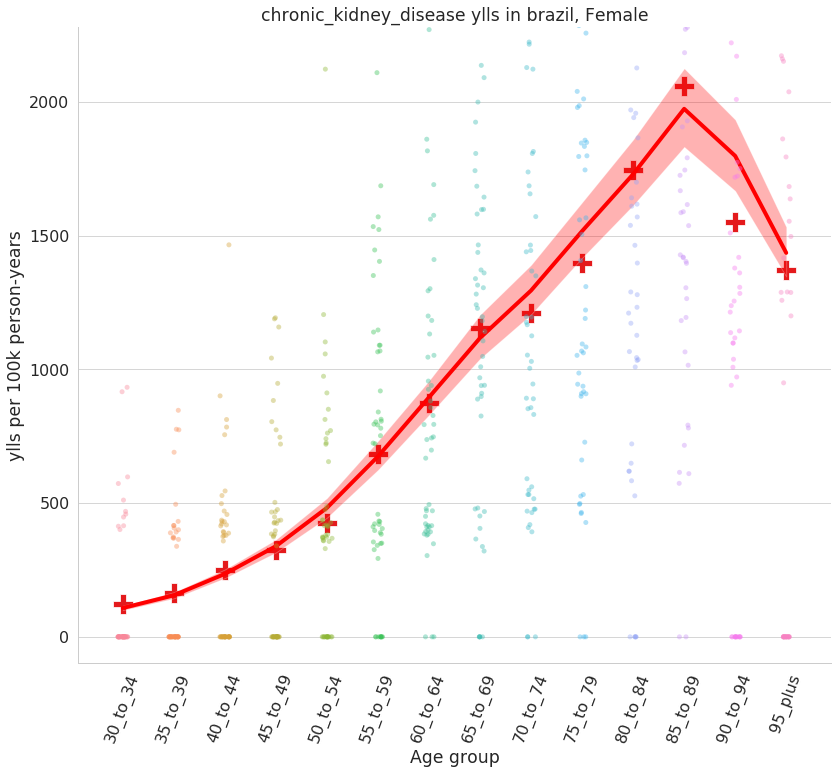

<Figure size 914.4x619.2 with 0 Axes>

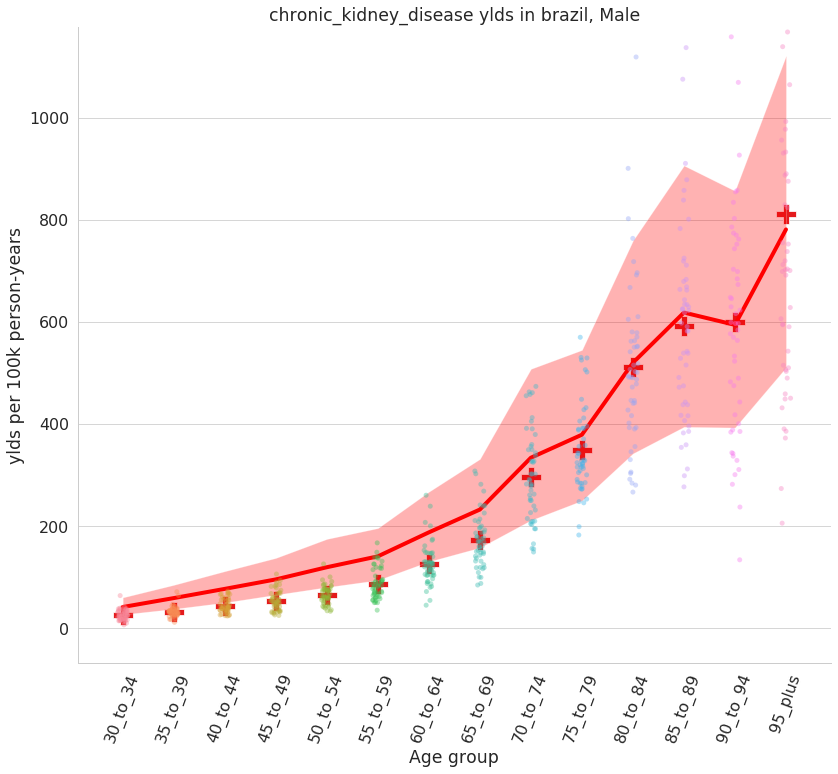

<Figure size 914.4x619.2 with 0 Axes>

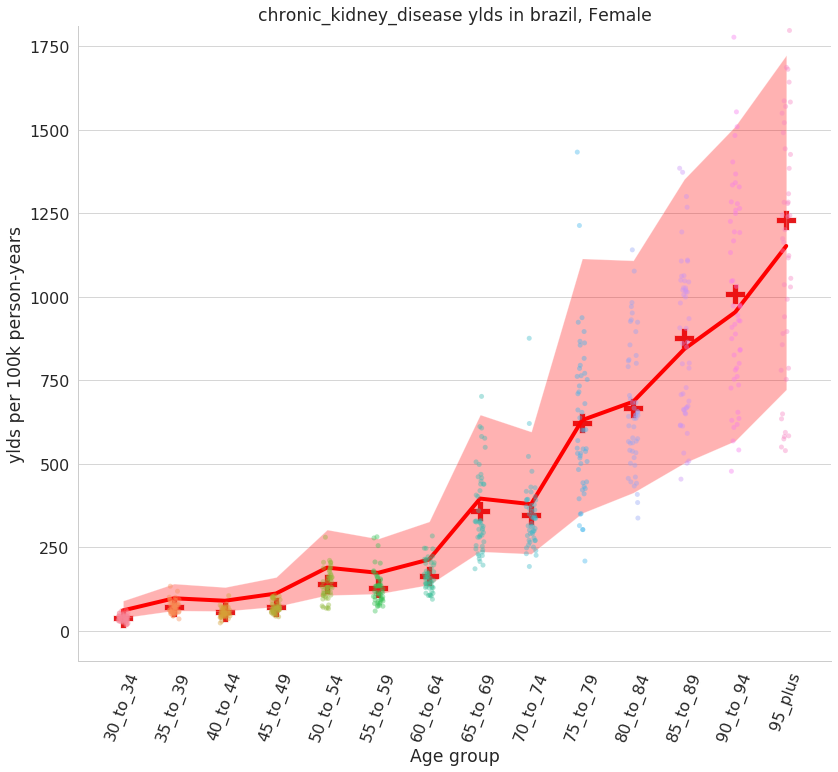

<Figure size 914.4x619.2 with 0 Axes>

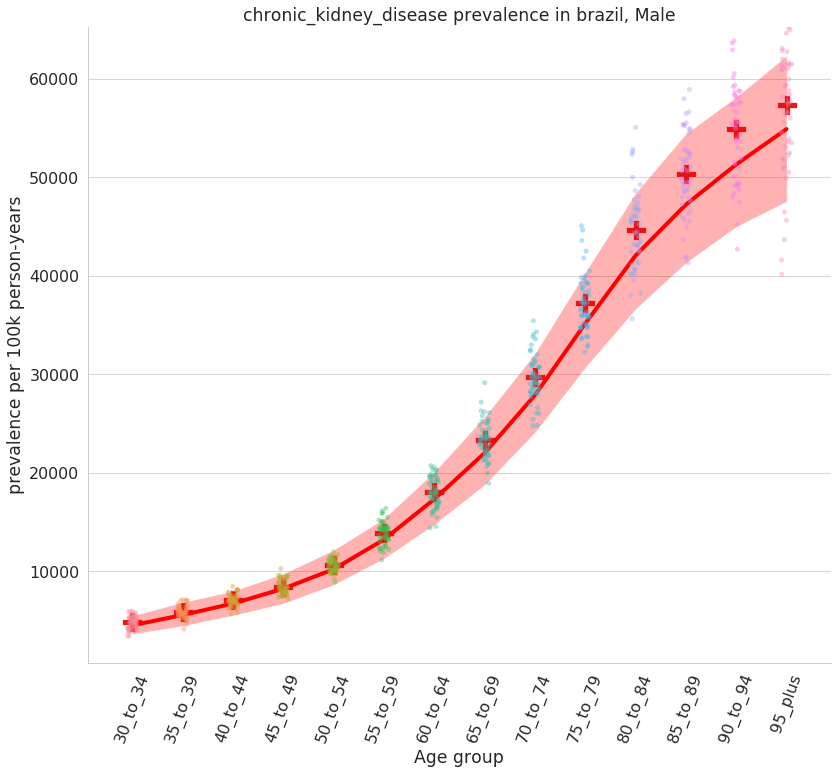

<Figure size 914.4x619.2 with 0 Axes>

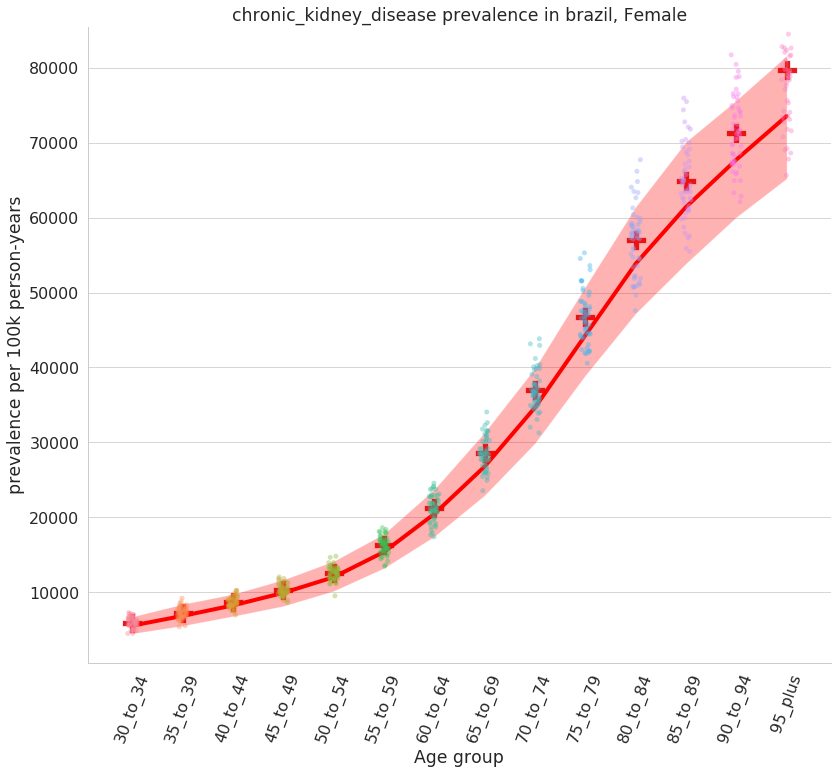

<Figure size 914.4x619.2 with 0 Axes>

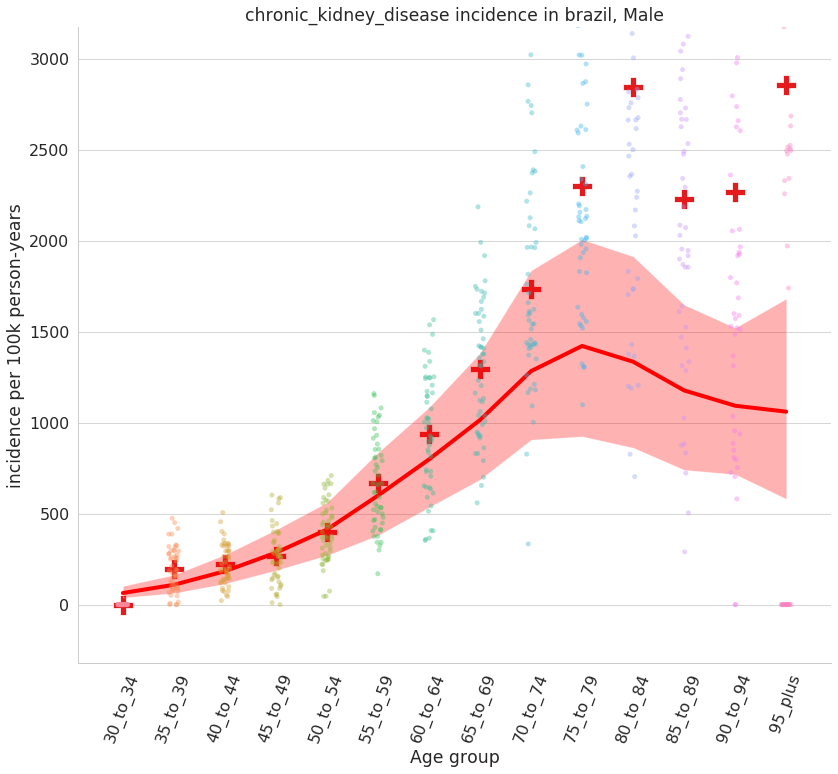

<Figure size 914.4x619.2 with 0 Axes>

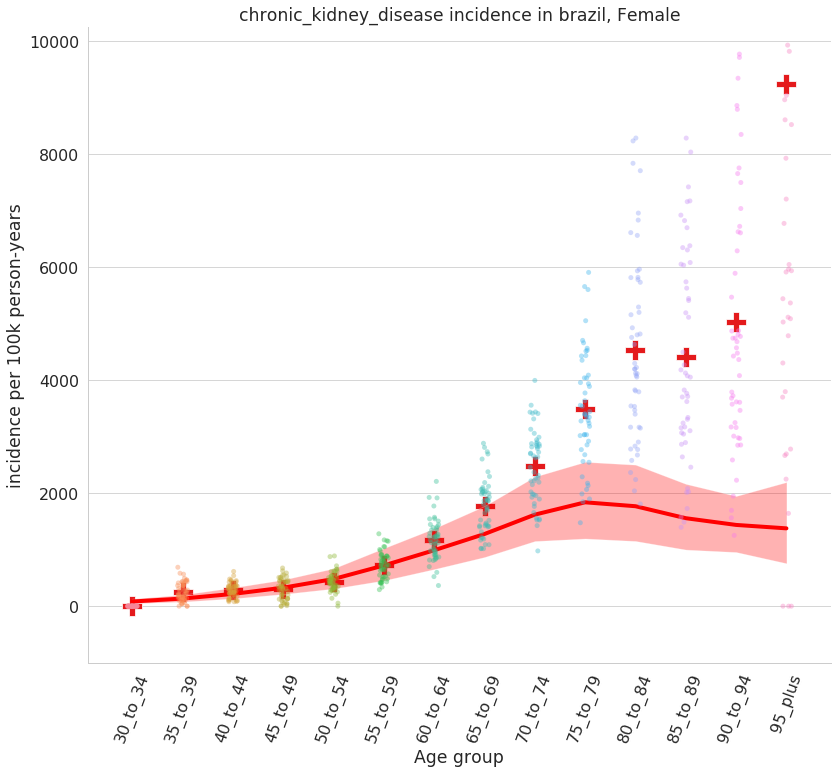

<Figure size 914.4x619.2 with 0 Axes>

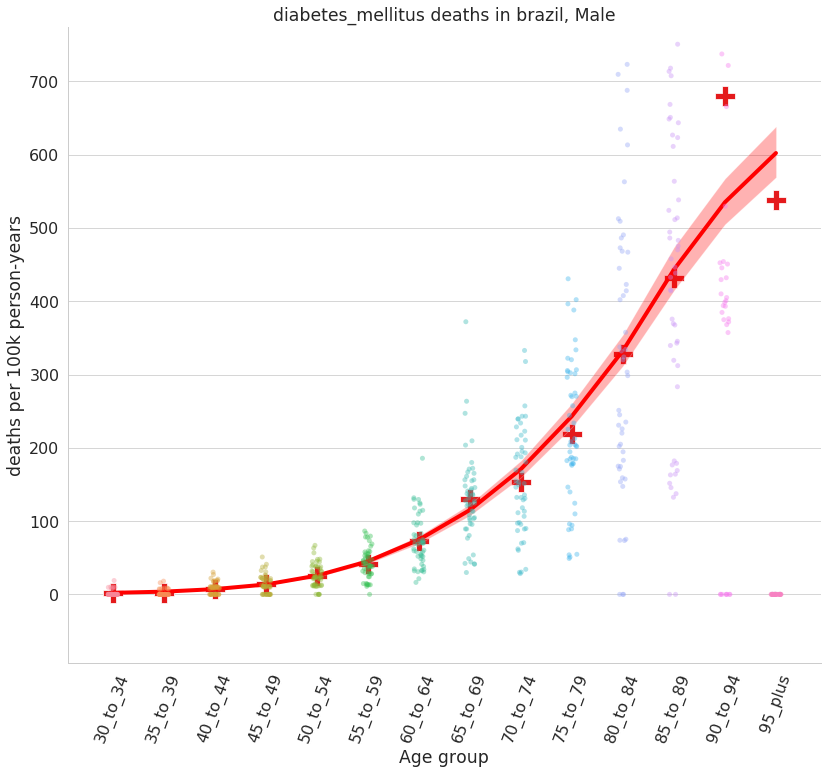

<Figure size 914.4x619.2 with 0 Axes>

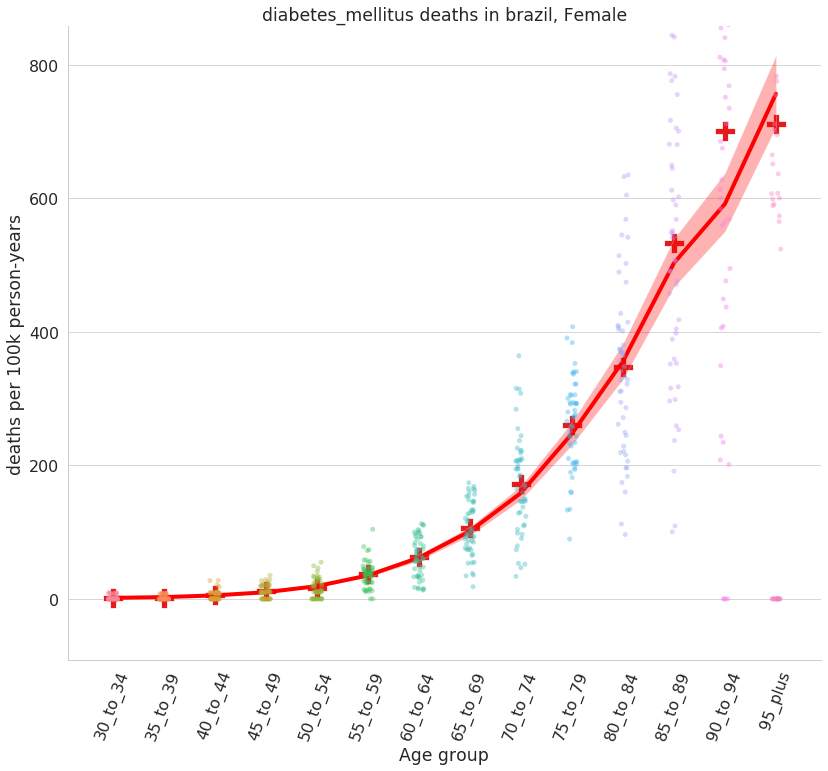

<Figure size 914.4x619.2 with 0 Axes>

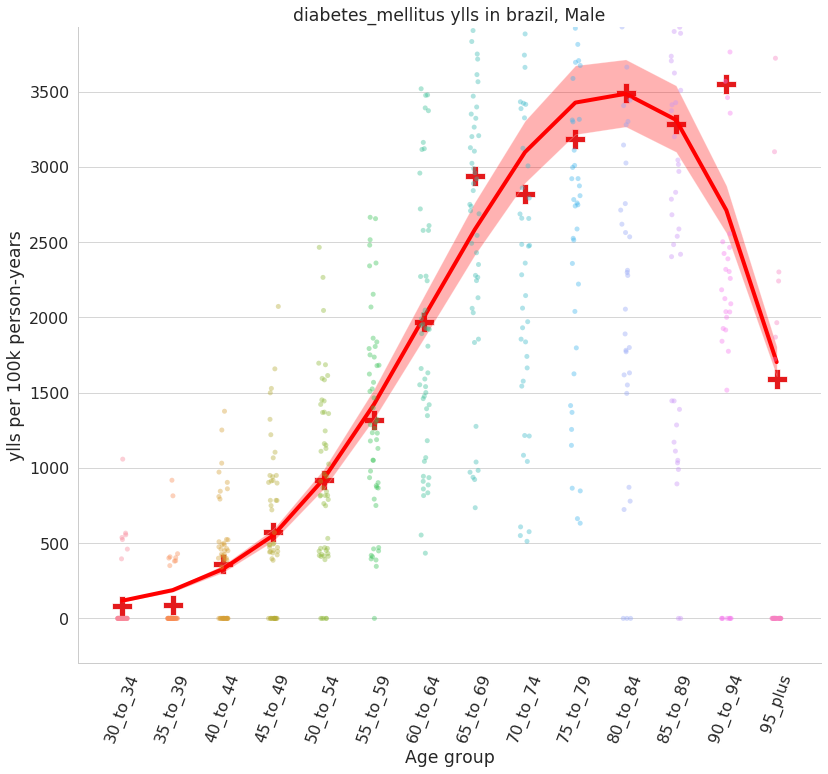

<Figure size 914.4x619.2 with 0 Axes>

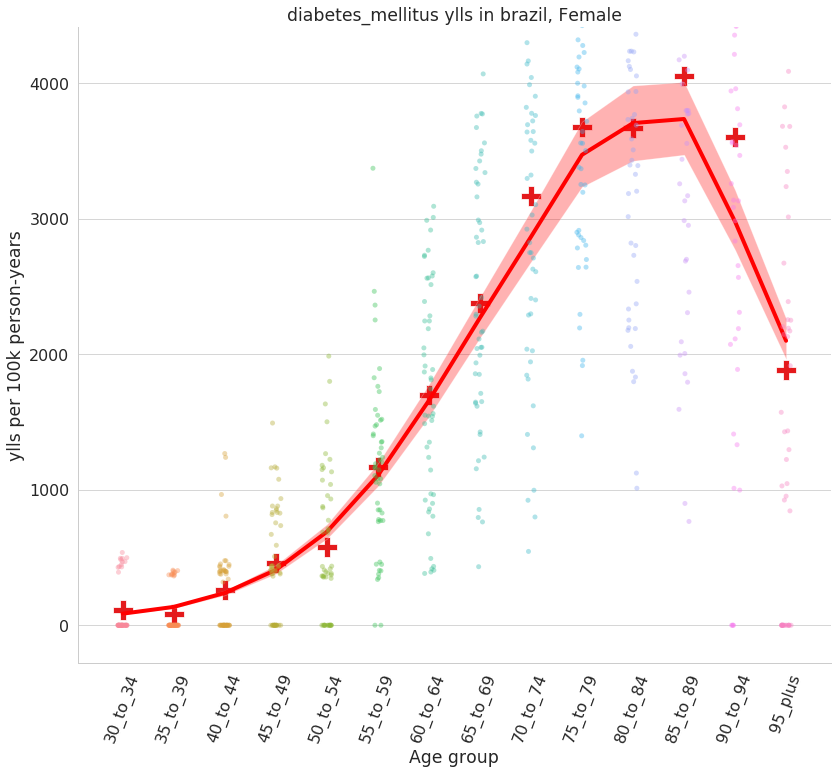

<Figure size 914.4x619.2 with 0 Axes>

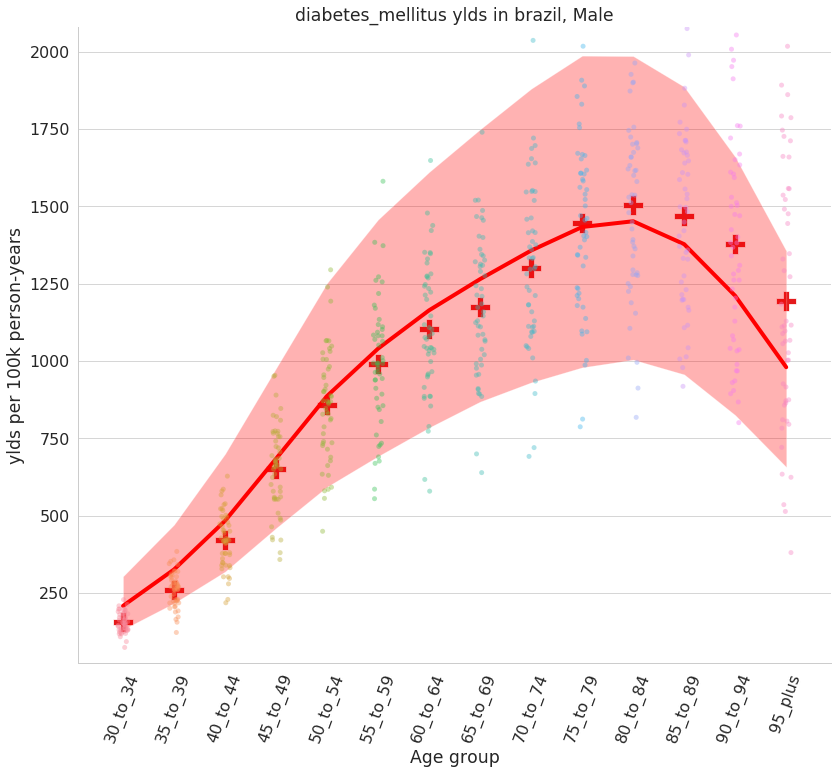

<Figure size 914.4x619.2 with 0 Axes>

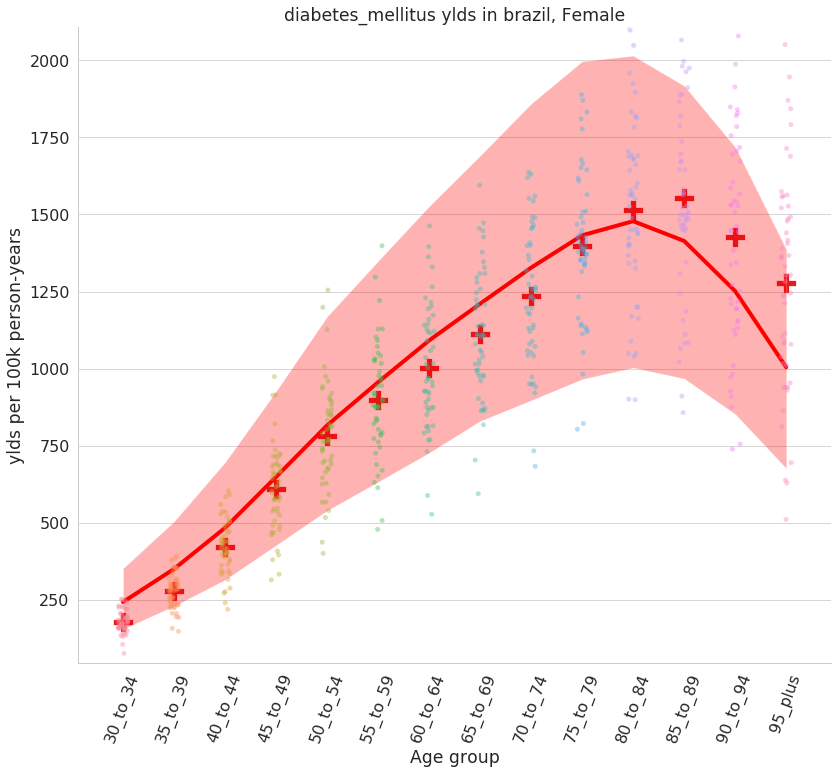

<Figure size 914.4x619.2 with 0 Axes>

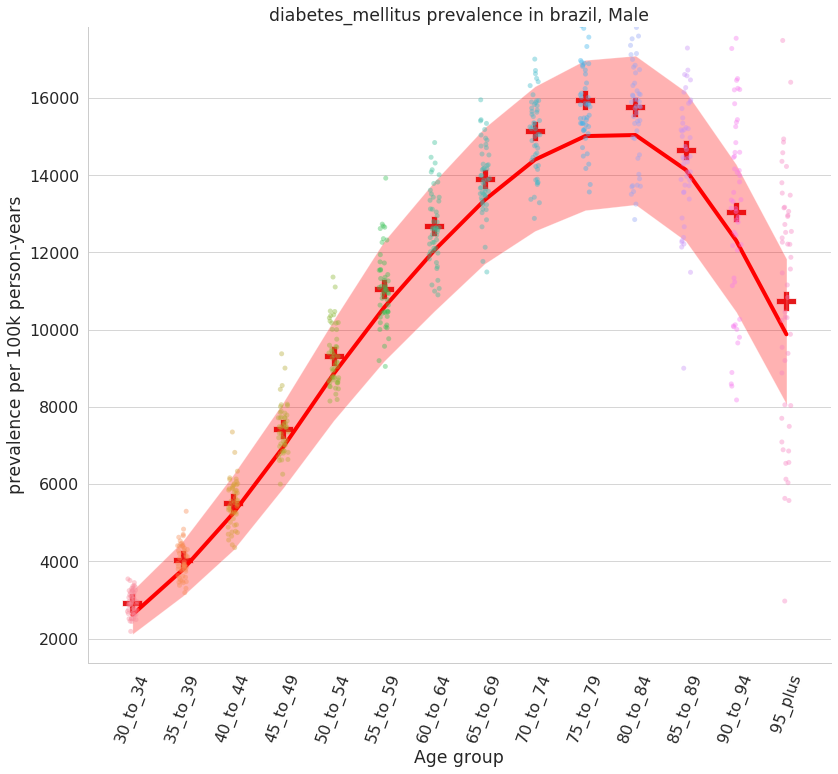

<Figure size 914.4x619.2 with 0 Axes>

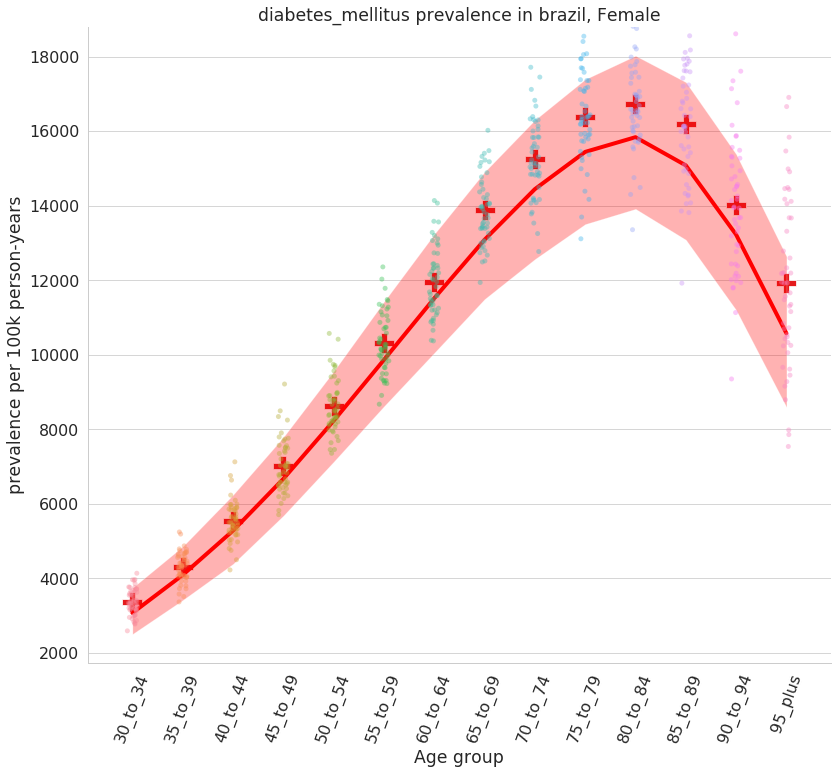

<Figure size 914.4x619.2 with 0 Axes>

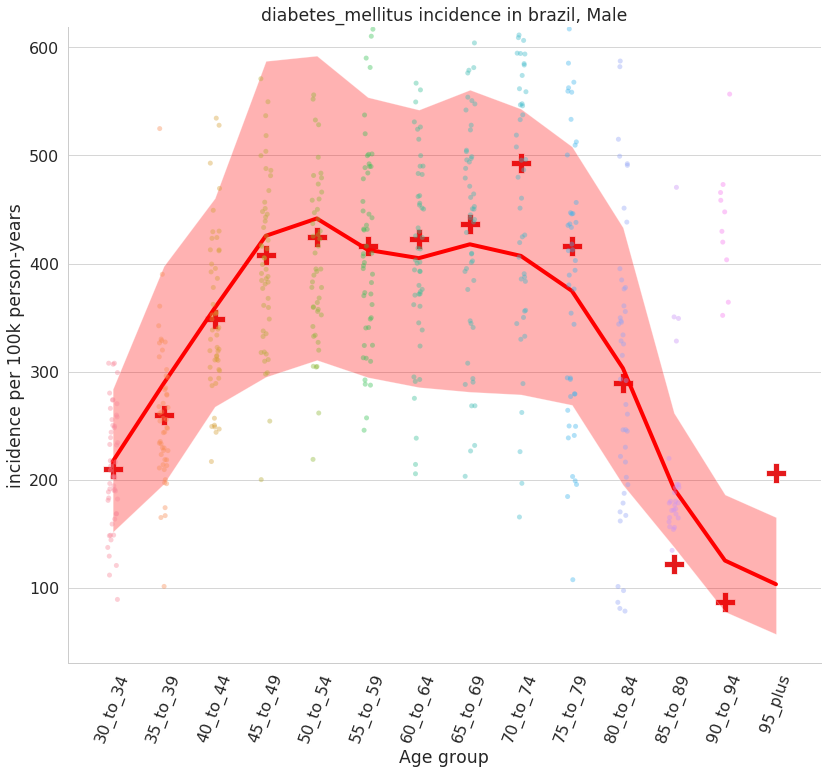

<Figure size 914.4x619.2 with 0 Axes>

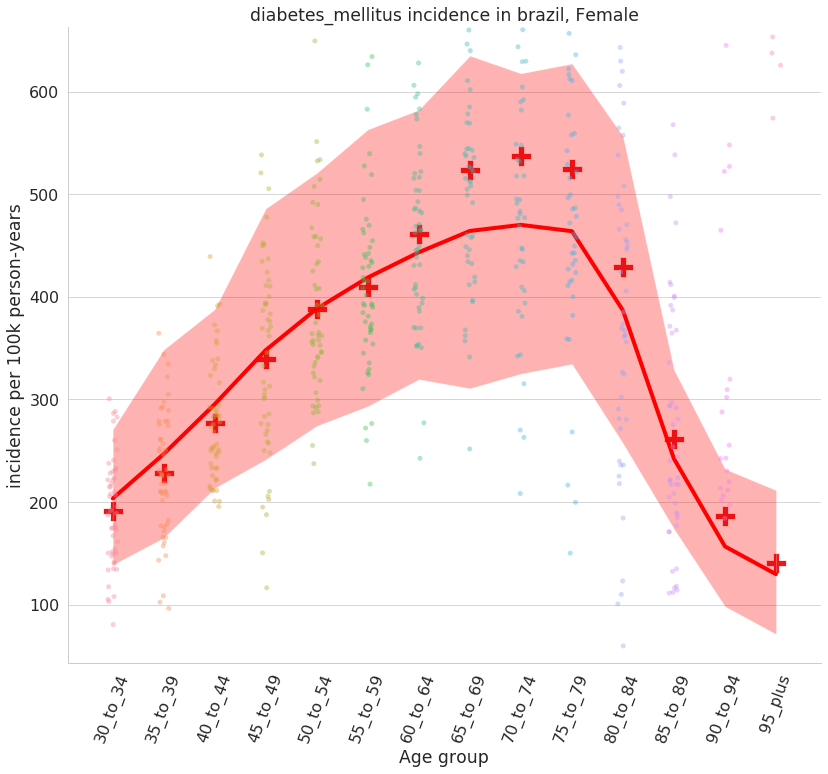

<Figure size 914.4x619.2 with 0 Axes>

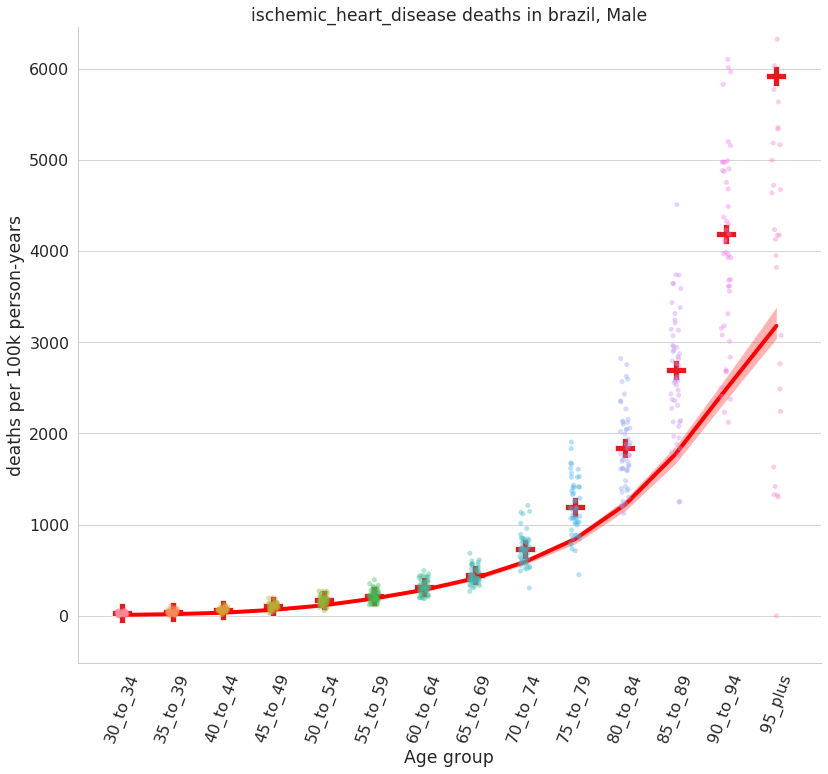

<Figure size 914.4x619.2 with 0 Axes>

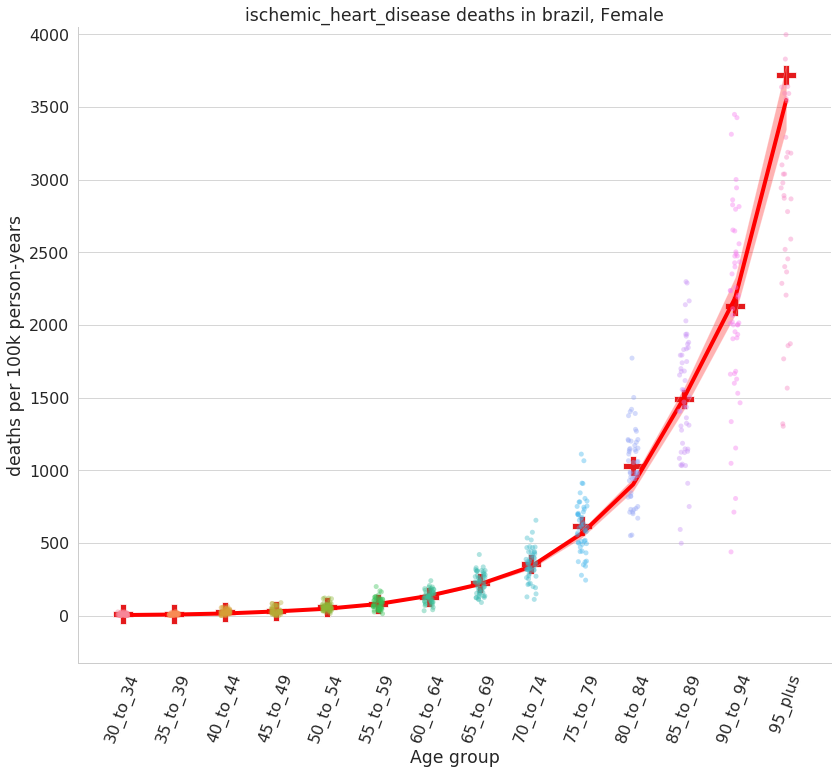

<Figure size 914.4x619.2 with 0 Axes>

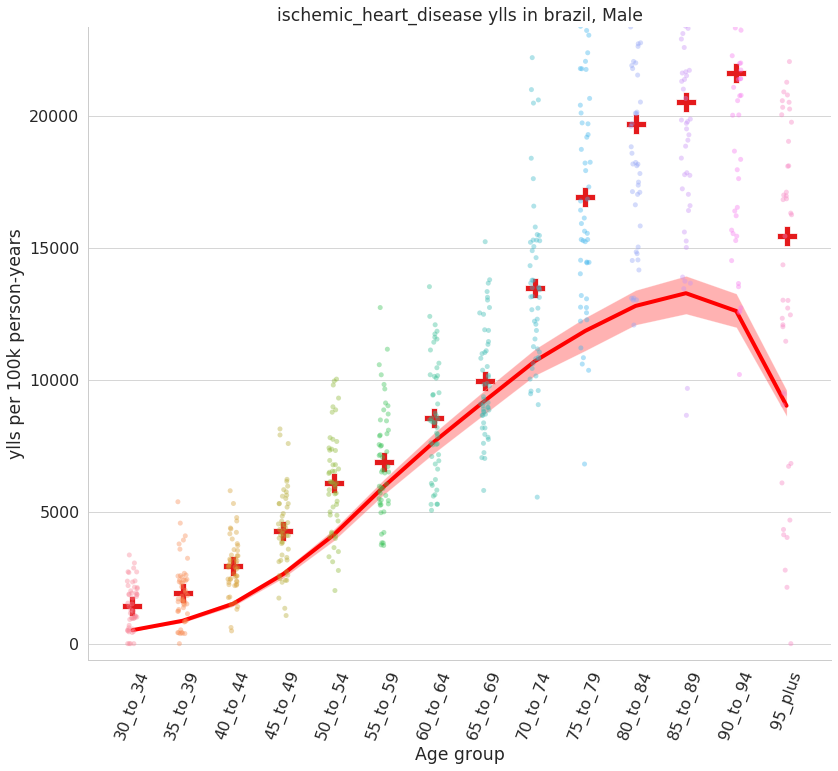

<Figure size 914.4x619.2 with 0 Axes>

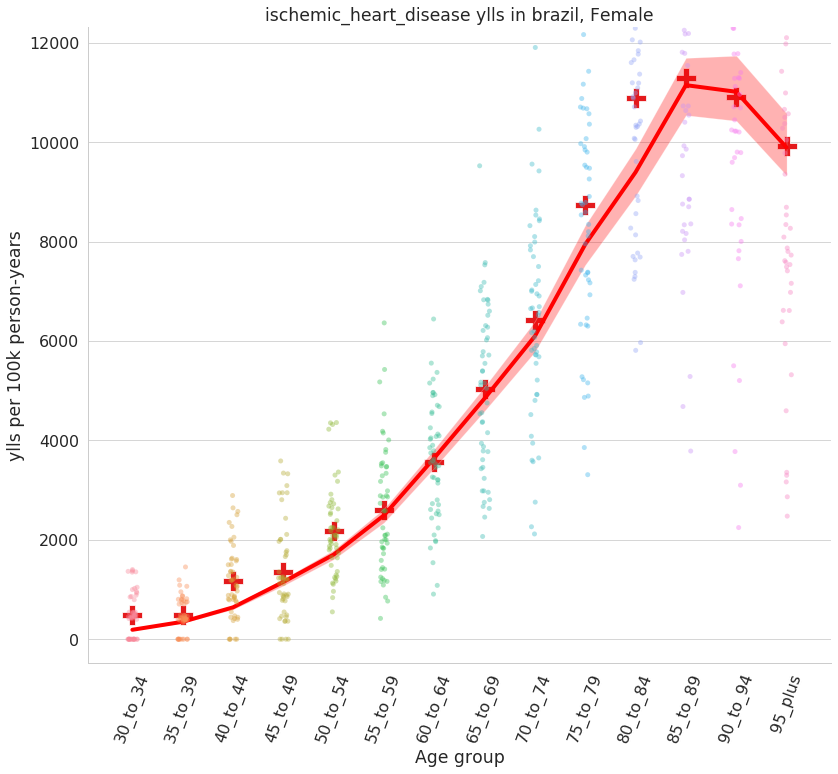

<Figure size 914.4x619.2 with 0 Axes>

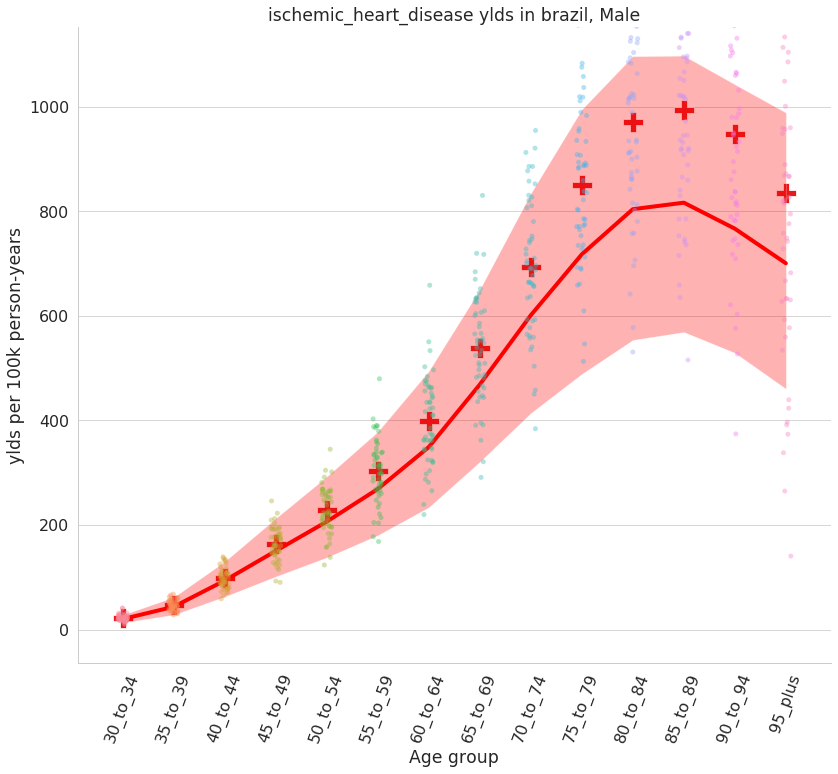

<Figure size 914.4x619.2 with 0 Axes>

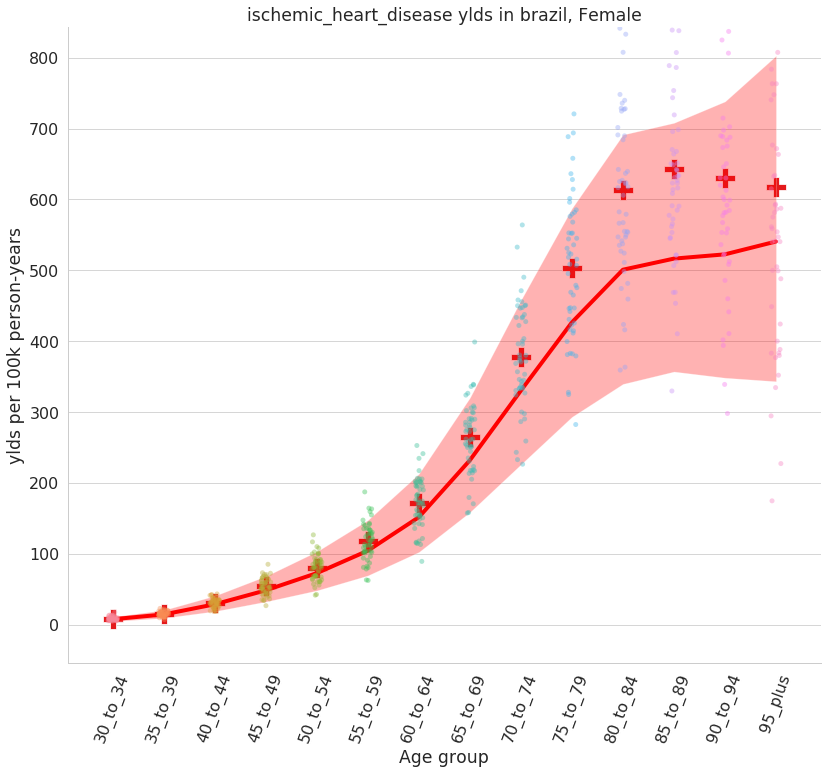

<Figure size 914.4x619.2 with 0 Axes>

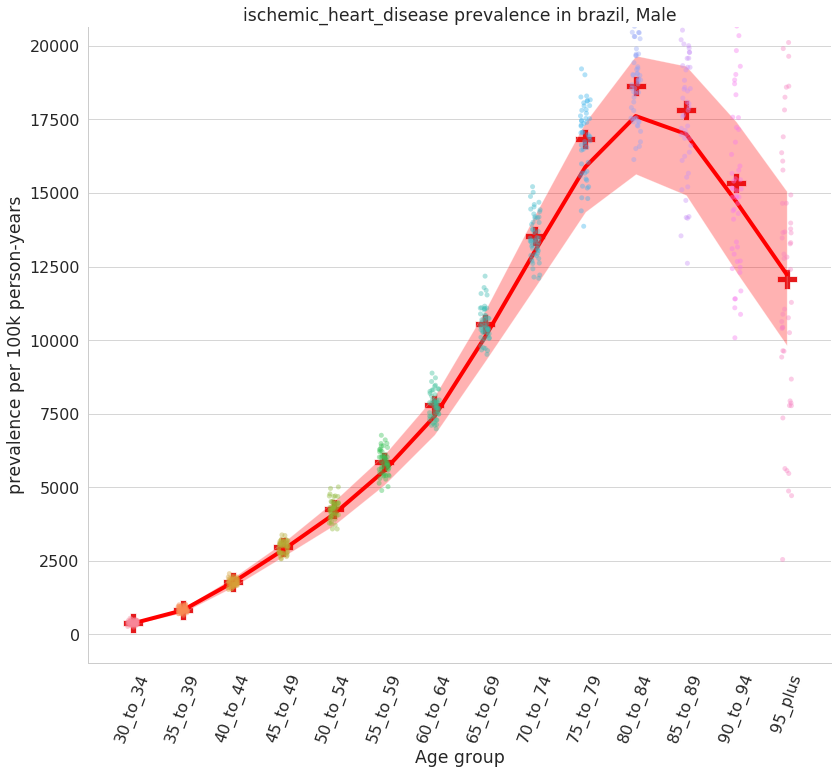

<Figure size 914.4x619.2 with 0 Axes>

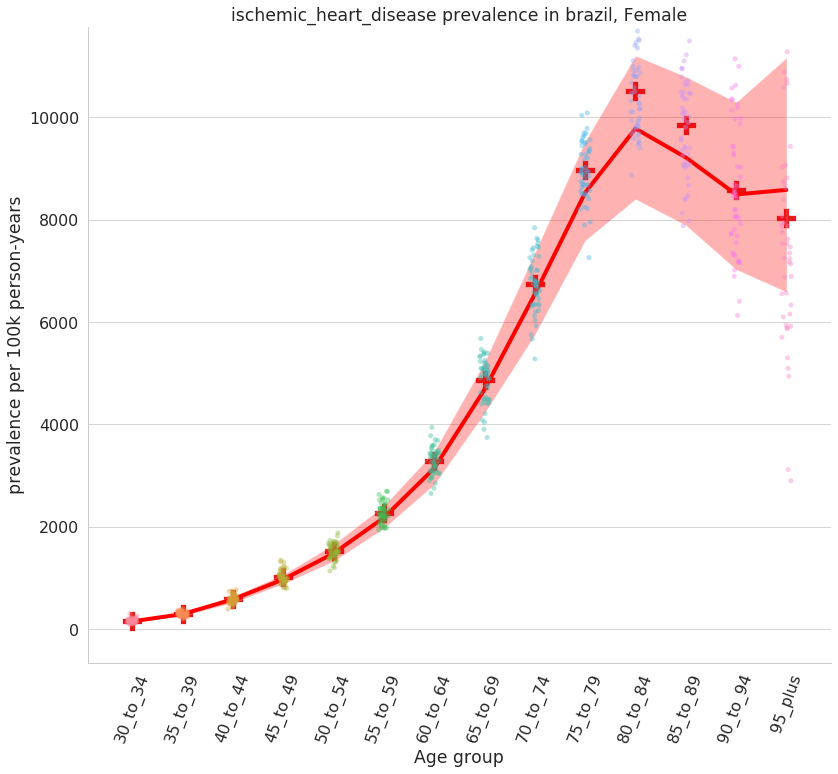

<Figure size 914.4x619.2 with 0 Axes>

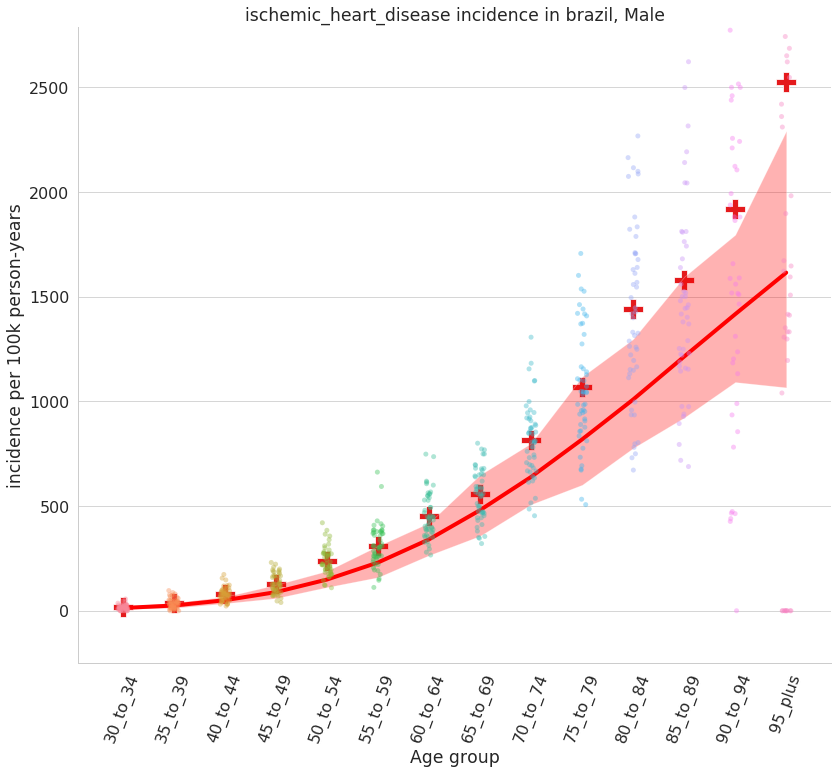

<Figure size 914.4x619.2 with 0 Axes>

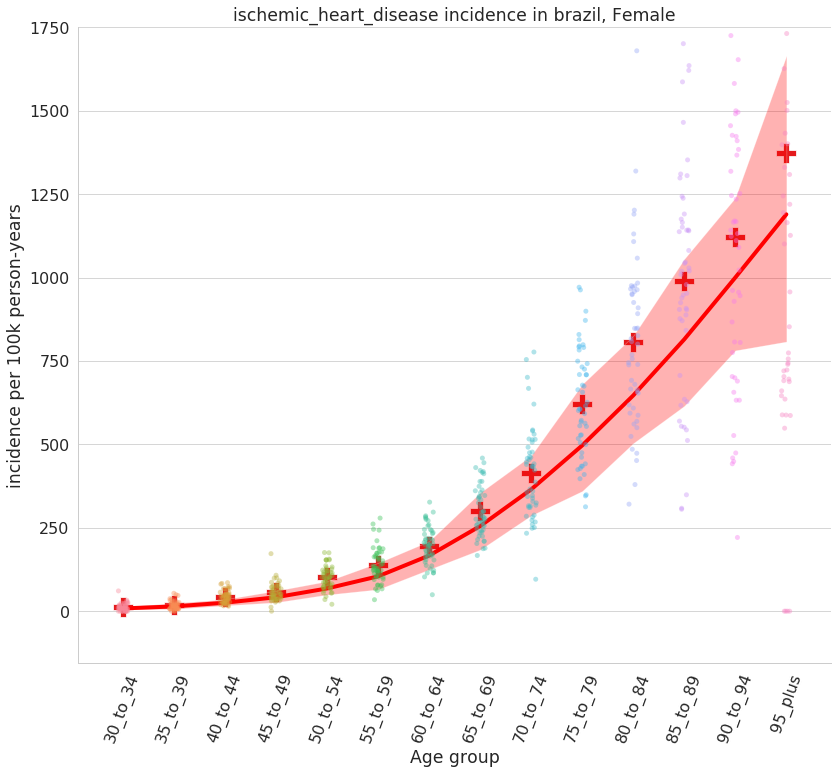

<Figure size 914.4x619.2 with 0 Axes>

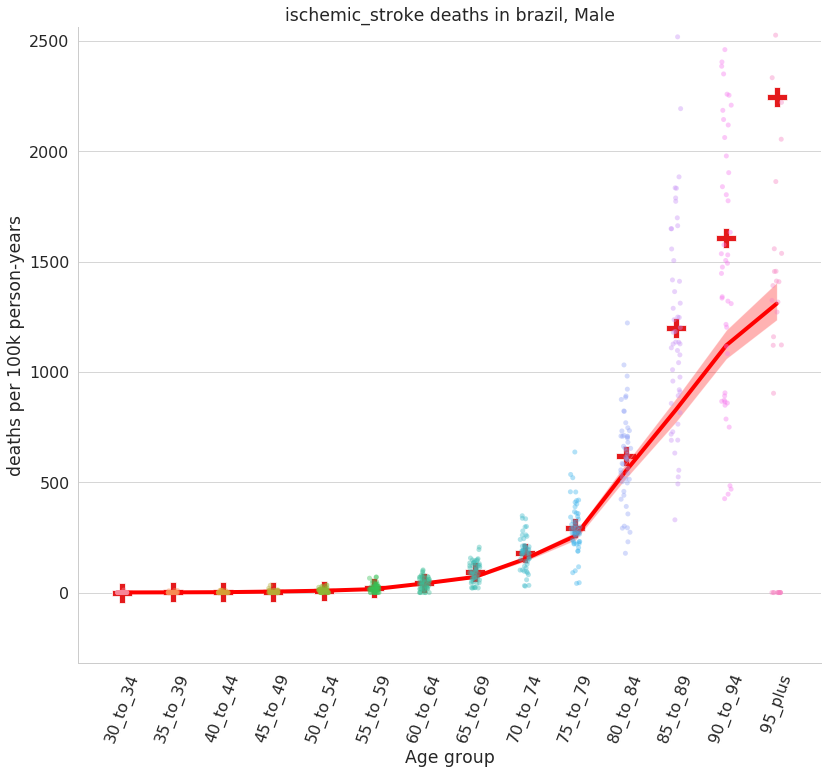

<Figure size 914.4x619.2 with 0 Axes>

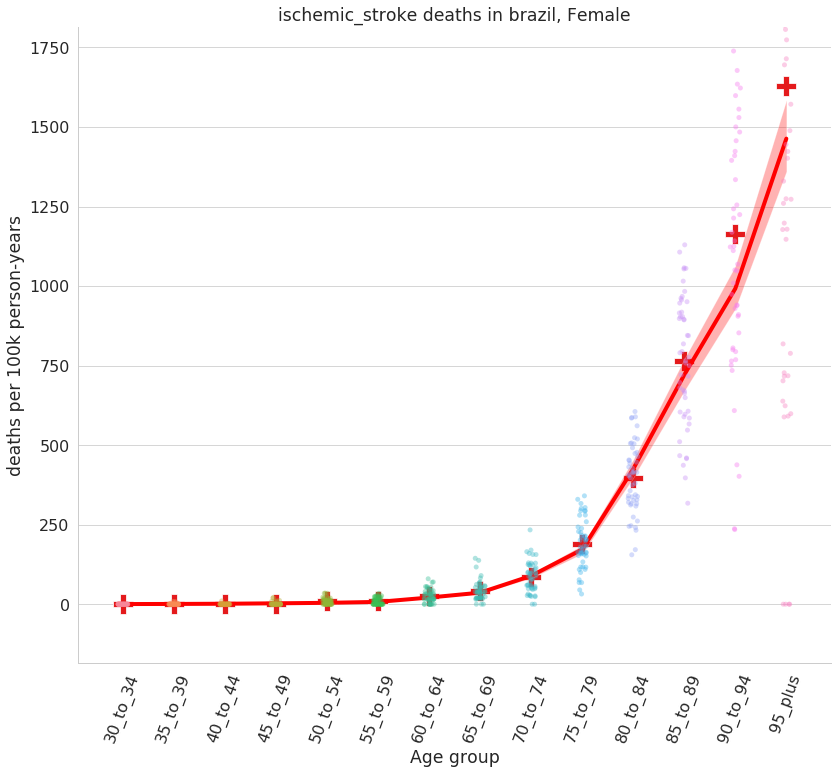

<Figure size 914.4x619.2 with 0 Axes>

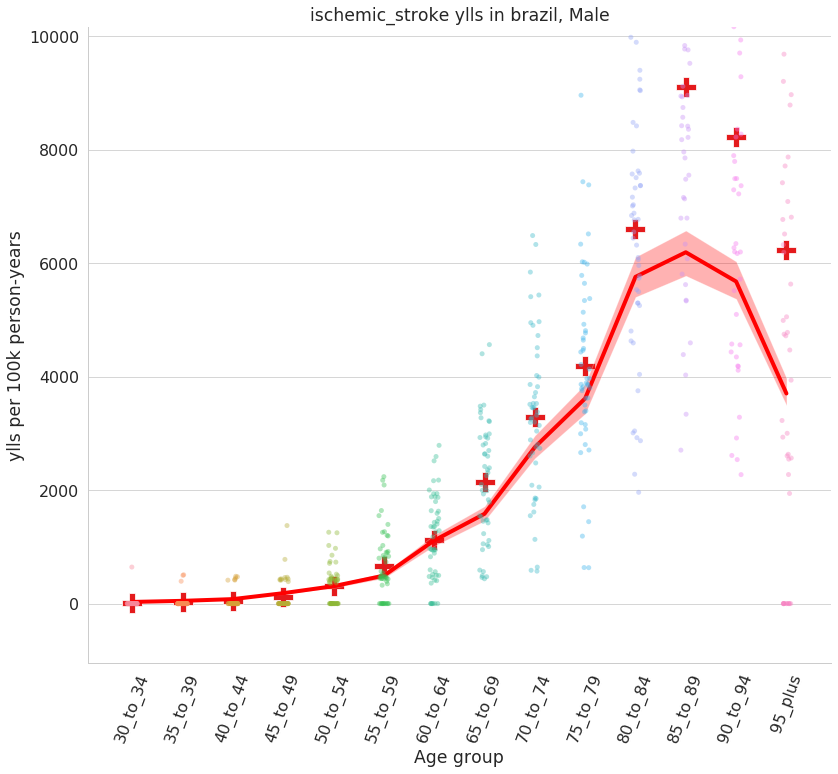

<Figure size 914.4x619.2 with 0 Axes>

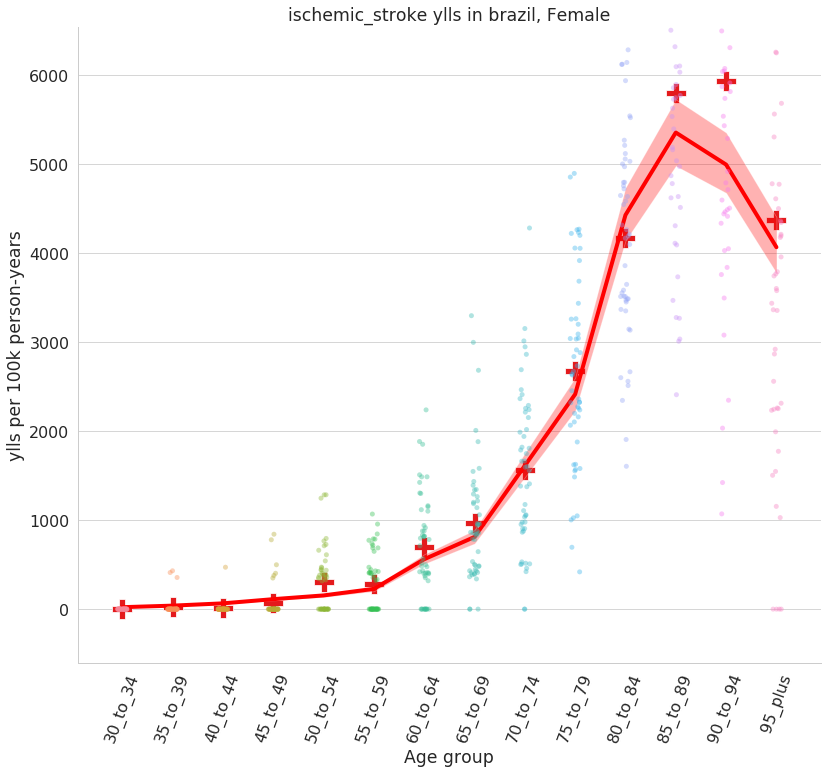

<Figure size 914.4x619.2 with 0 Axes>

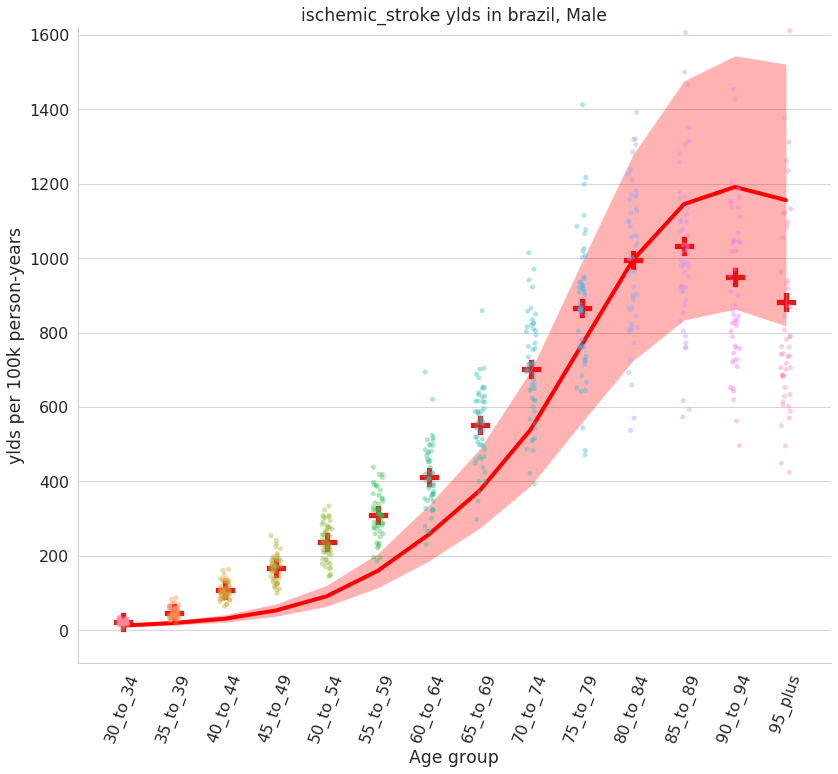

<Figure size 914.4x619.2 with 0 Axes>

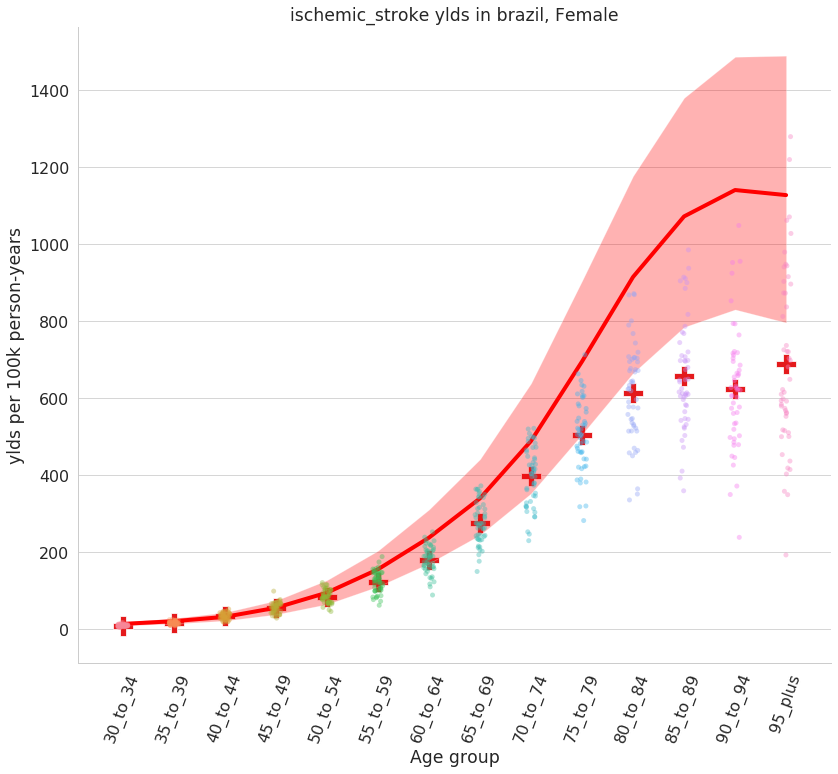

<Figure size 914.4x619.2 with 0 Axes>

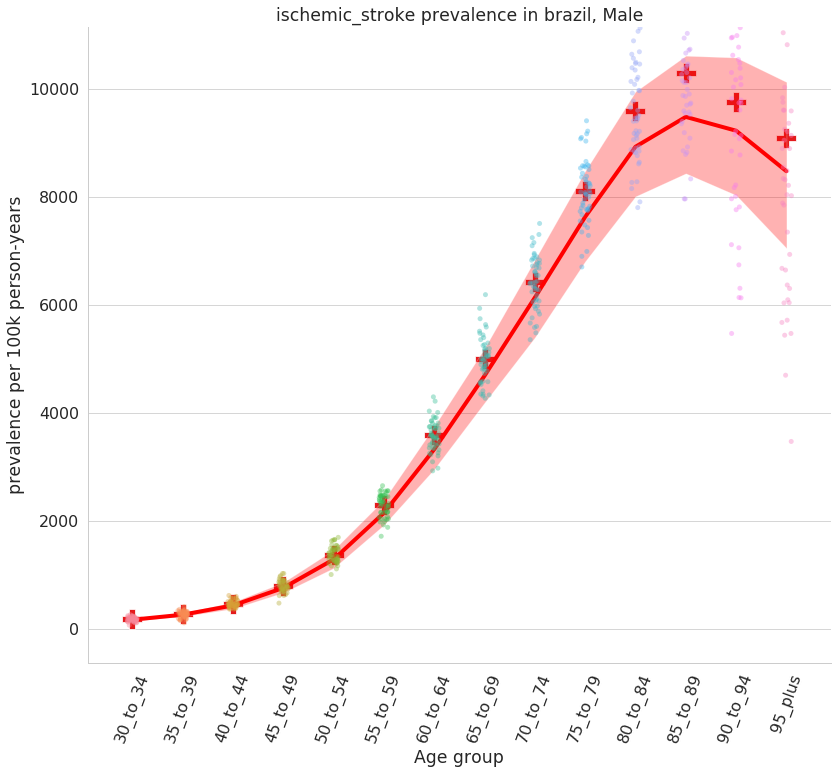

<Figure size 914.4x619.2 with 0 Axes>

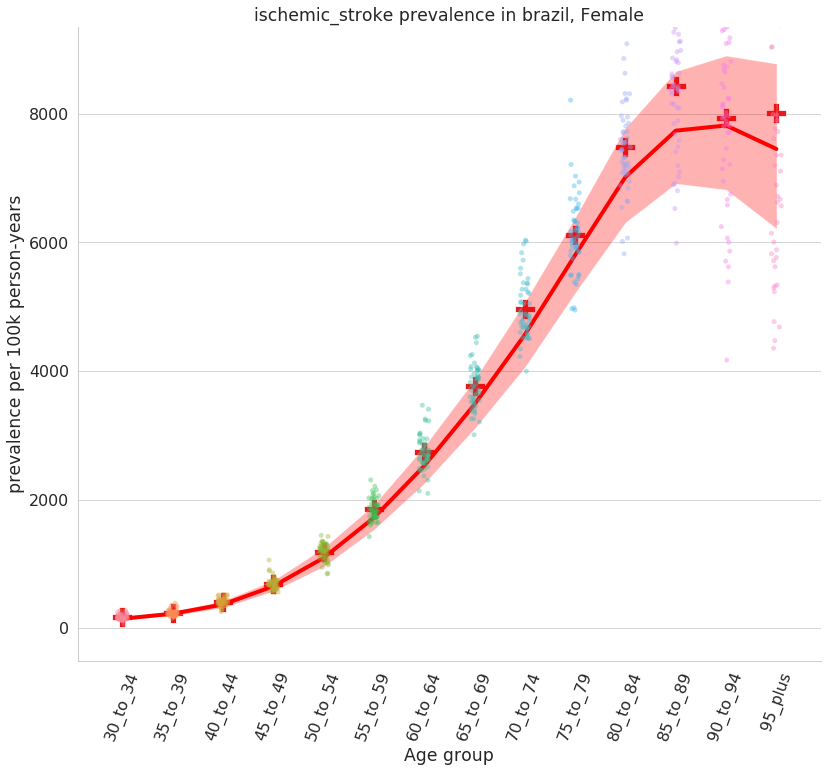

<Figure size 914.4x619.2 with 0 Axes>

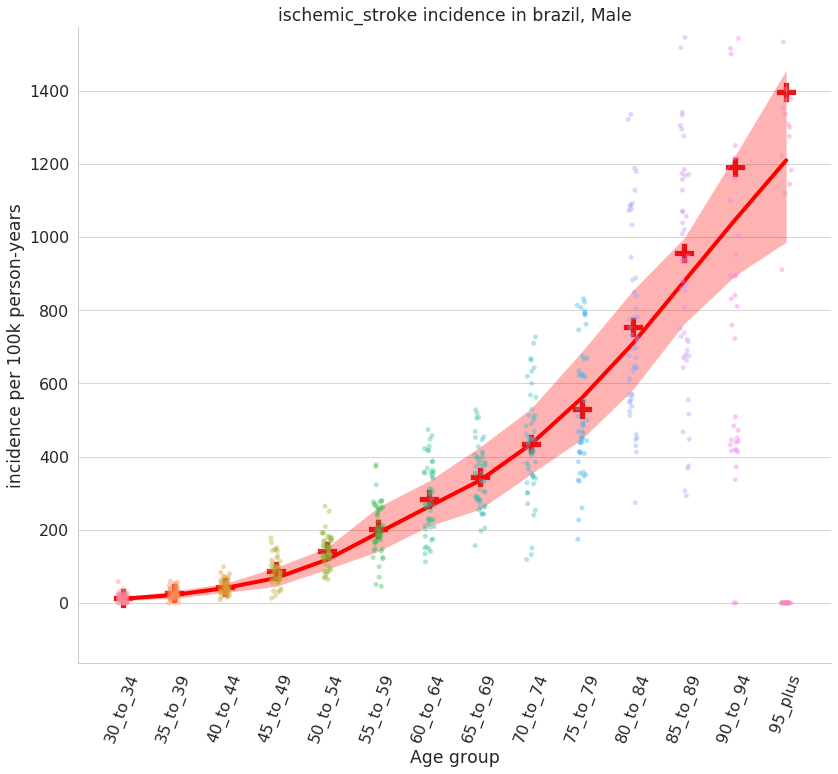

<Figure size 914.4x619.2 with 0 Axes>

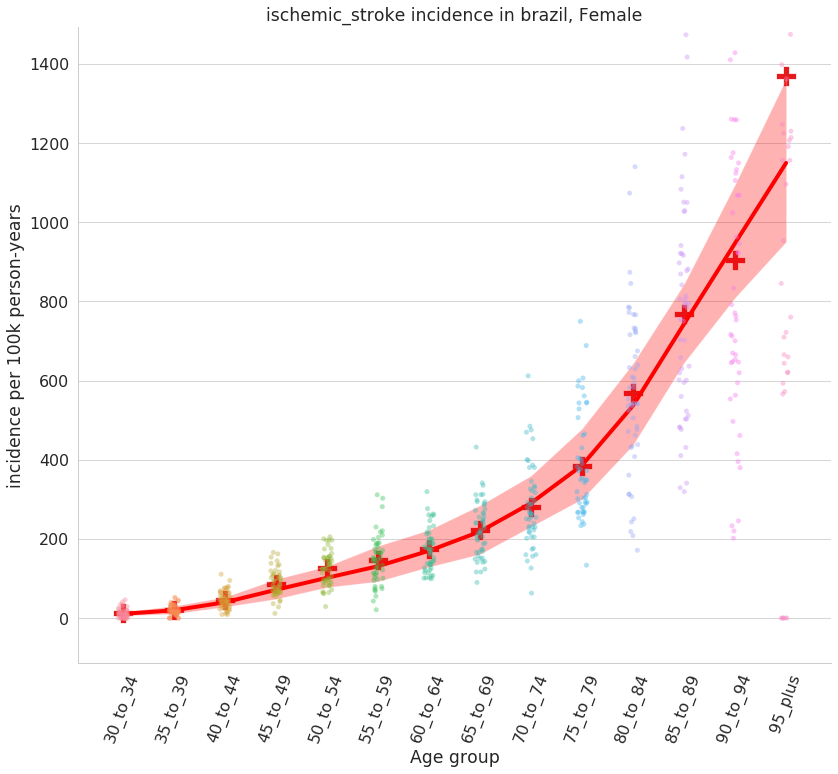

<Figure size 914.4x619.2 with 0 Axes>

In [121]:
plot_results_cause_measure_loc(rates,locations,gbd)

## Plot GBD 2017 estimates compared to Zenon data artifact

In [200]:
def plot_artifact_gbd(gbd, artifact_csmr):
    cause_names = ['ischemic_heart_disease']
    for cause in cause_names:
        with PdfPages(str(save_path)+f'/{cause}_gbd_artifact_compare_m3.2.pdf') as pdf:        
            for sex in ['Male', 'Female']:
                for measure in ['deaths']:
                    for location in locations:
                        with PdfPages(str(save_path)+f'/{cause}_{location}_gbd_artifact_compare_m3.2.pdf') as pdf:        

                            data_g = gbd[(gbd.cause == cause) & (gbd.sex == sex) & (gbd.measure == measure) & (gbd.location == location)]
                            data_art = artifact_csmr[(artifact_csmr.cause == cause) & (artifact_csmr.sex == sex) & (artifact_csmr.measure == measure) & (artifact_csmr.location == location)]

                            fig,ax = plt.subplots(1,1)

                            g = sns.lineplot(x='age_group', y='value',
                                            color='blue', linewidth=4, ax=ax,
                                            data=data_art)
                            sns.lineplot(x='age_group', y='val',
                                         color='red', linewidth=4, alpha=0.4, legend=False, ax=ax, 
                                          data=data_g)

                            g.fill_between(data_g.age_group, data_g.upper, data_g.lower, alpha=0.3, facecolor='red')

                            g.set_title(f'{cause} {measure} in {location}, {sex}')
                            plt.xticks(rotation=70)
                            g.set_xlabel('Age group')
                            g.set_ylabel(f'{measure} per 100k person-years')

                            pdf.savefig(fig, orientation = 'landscape', bbox_inches='tight')

                            plt.show()
                            plt.clf() 

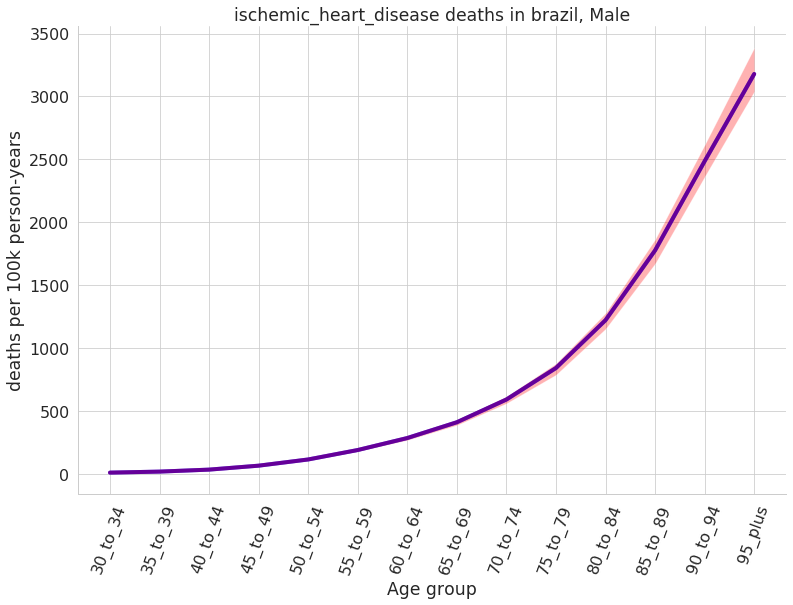

<Figure size 914.4x619.2 with 0 Axes>

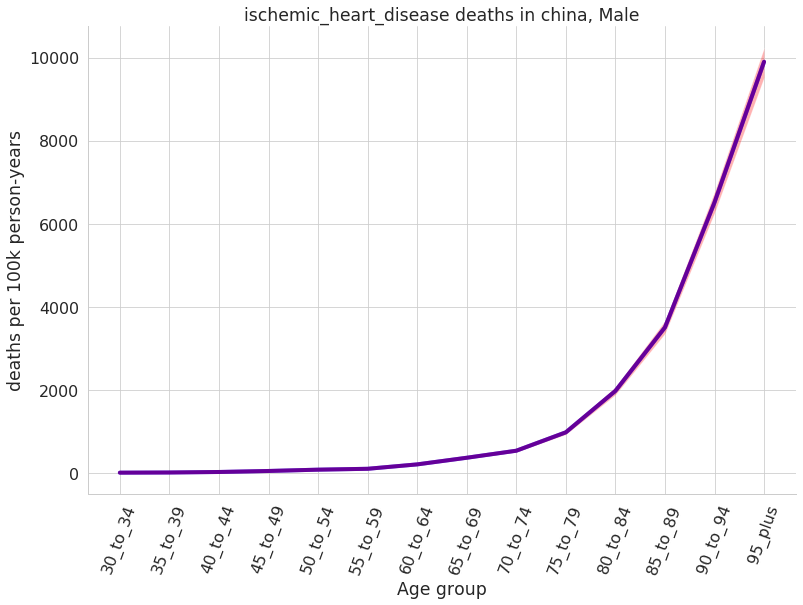

<Figure size 914.4x619.2 with 0 Axes>

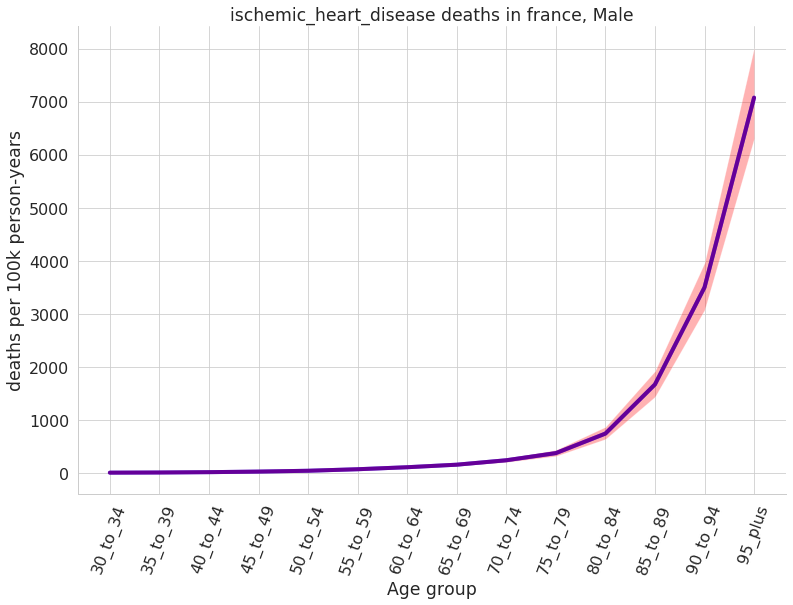

<Figure size 914.4x619.2 with 0 Axes>

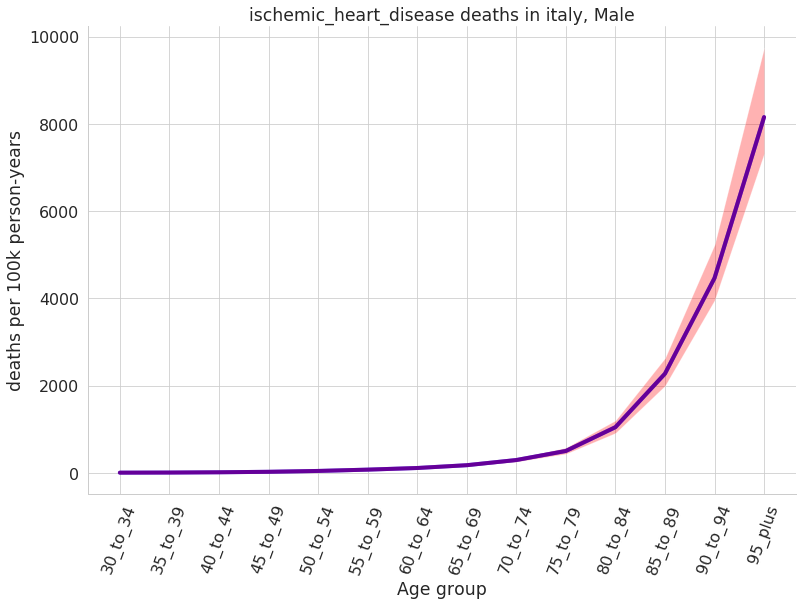

<Figure size 914.4x619.2 with 0 Axes>

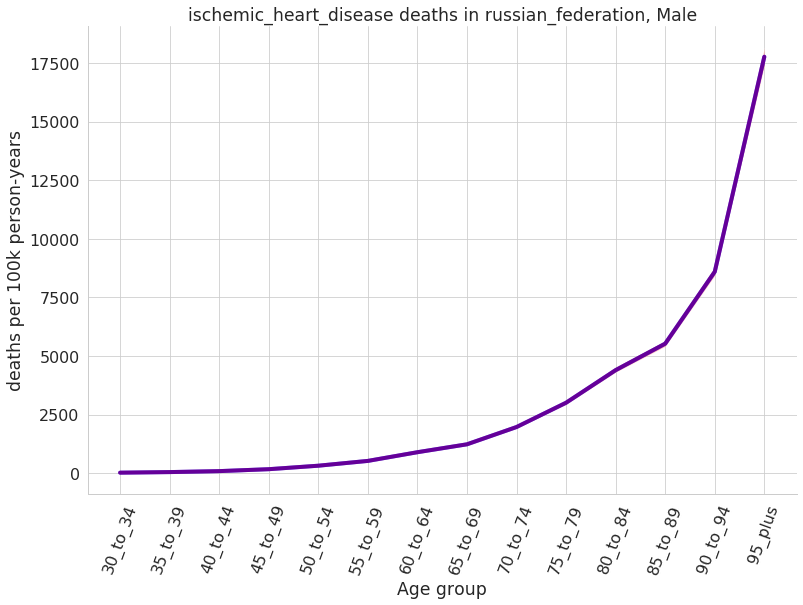

<Figure size 914.4x619.2 with 0 Axes>

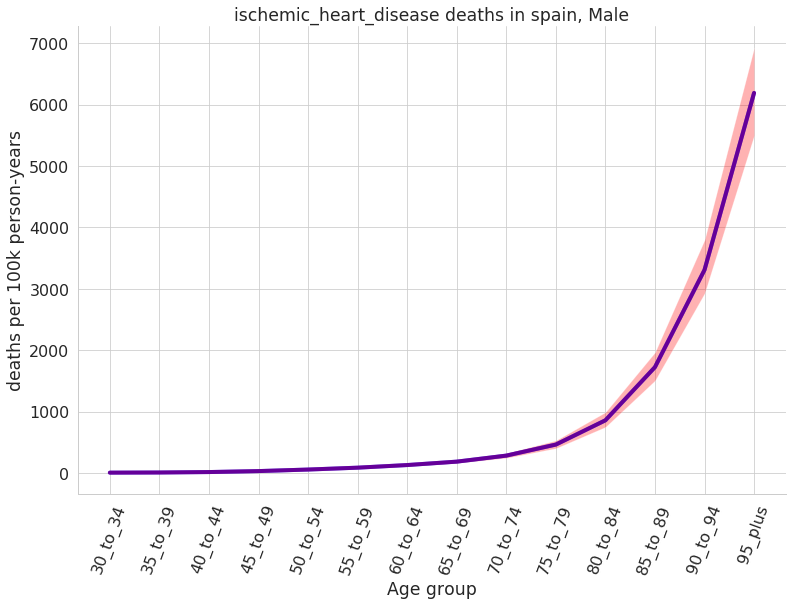

<Figure size 914.4x619.2 with 0 Axes>

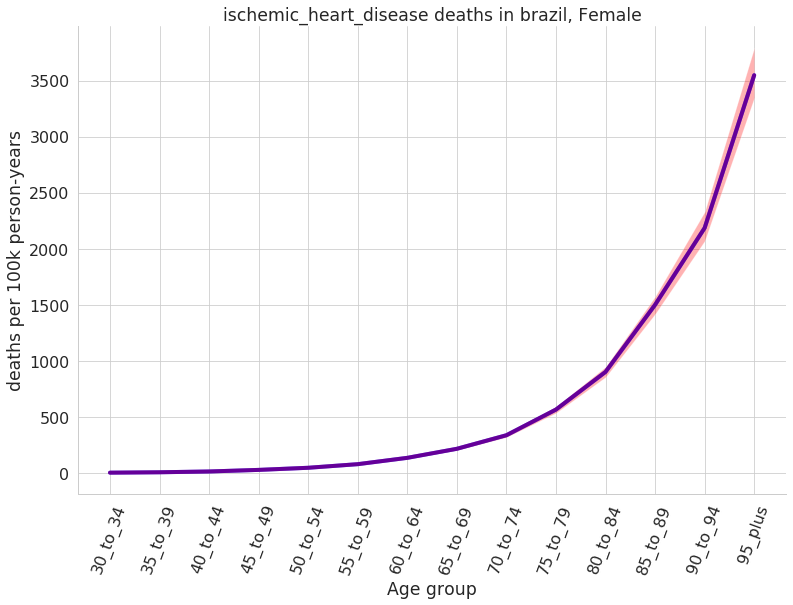

<Figure size 914.4x619.2 with 0 Axes>

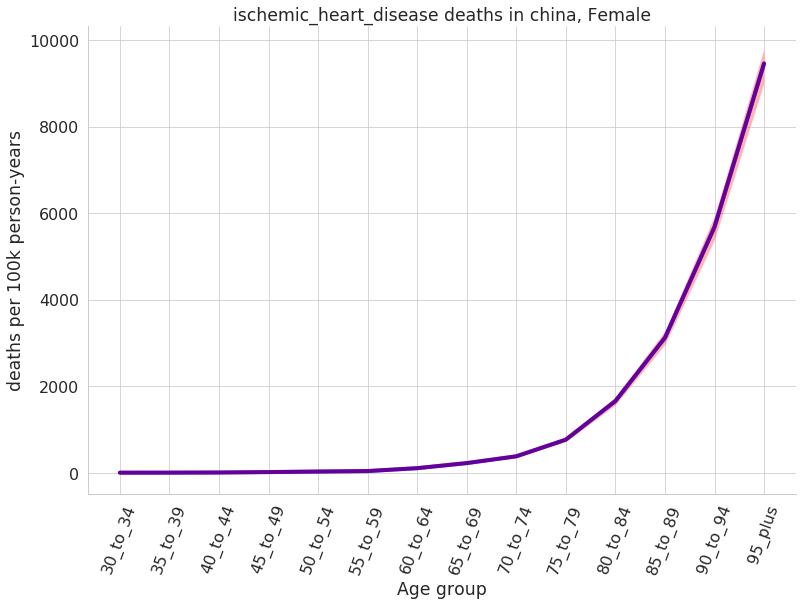

<Figure size 914.4x619.2 with 0 Axes>

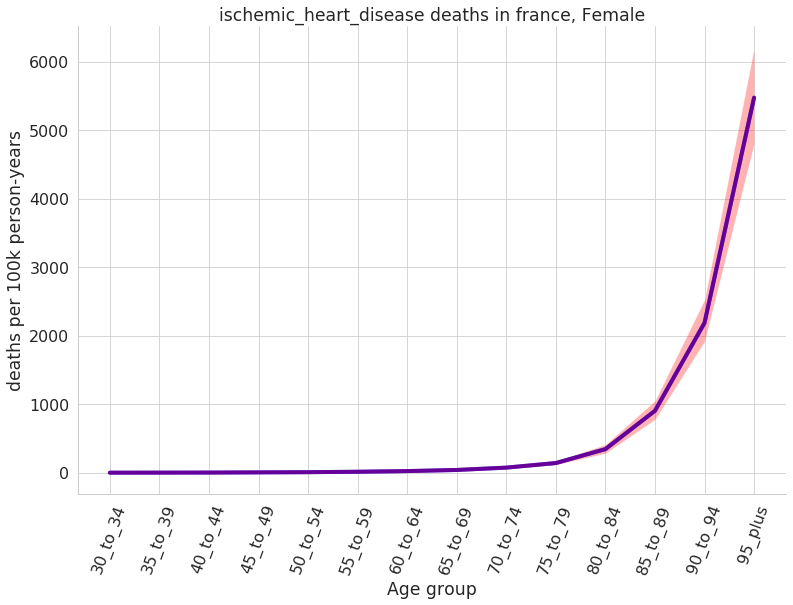

<Figure size 914.4x619.2 with 0 Axes>

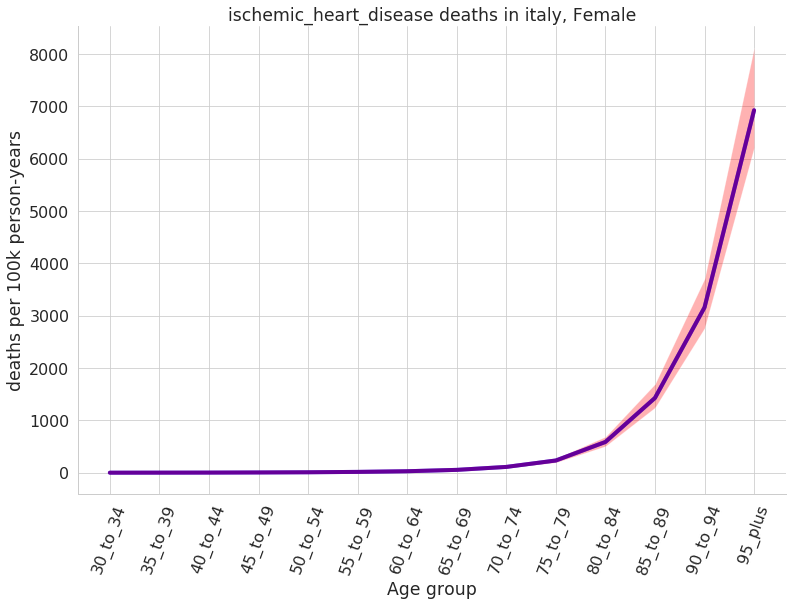

<Figure size 914.4x619.2 with 0 Axes>

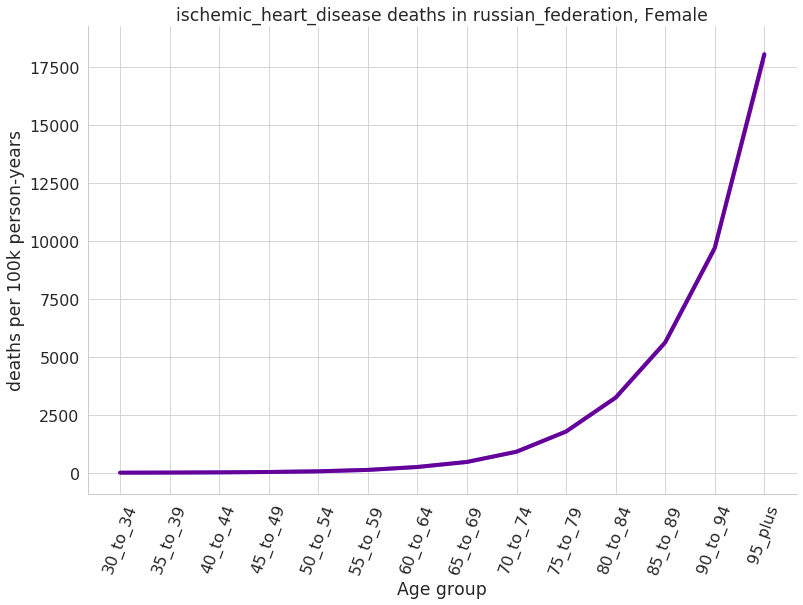

<Figure size 914.4x619.2 with 0 Axes>

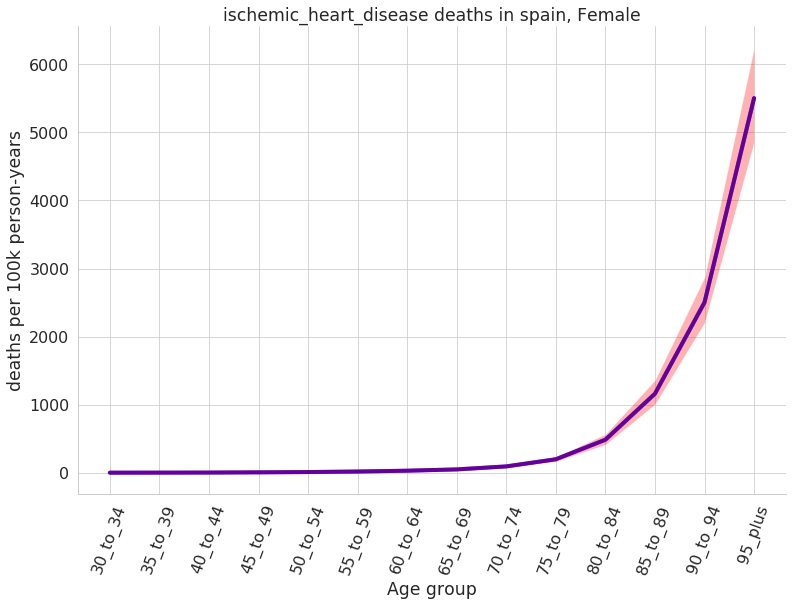

<Figure size 914.4x619.2 with 0 Axes>

In [201]:
plot_artifact_gbd(gbd, artifact_csmr)

### Zenon Model 4 CVD Risk Score Distributions

In [106]:
#model rerun
path_template = Path('/ihme/costeffectiveness/results/vivarium_csu_zenon/v4.1_cvd_risk')

def get_deaths(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/deaths.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location', 'cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_pops(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/population.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    return outcomes

def get_ylls(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/ylls.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location','cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_ylds(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/ylds.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location','cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_person_time(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        outcome = pd.read_hdf(str(path_template / f'{country_loc}/count_data/person_time.hdf'))
        outcome['location'] = f'{country}'
        outcomes = outcomes.append(outcome)
    outcomes = outcomes.groupby(['age_group','sex','year','input_draw', 'location','cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_state(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/state_person_time.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
    outcomes['cause'] = outcomes.cause.map(mapping_dict_data['cause'])
    outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw', 'location','cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_state_no_mapping(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/state_person_time.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
#     outcomes = outcomes.groupby(['age_group','sex','year','cause','input_draw','measure', 'location','cvd_risk_category']).value.sum().reset_index()
    return outcomes

def get_transition(locations):
    outcomes = pd.DataFrame([])
    for country in locations:
        country_loc = mapping_dict_data['model_4_results'][country]
        df = pd.read_hdf(str(path_template / f'{country_loc}/count_data/transition_count.hdf'))
        df['location'] = f'{country}'
        outcomes = outcomes.append(df)
    return outcomes

def collapse_frame(df, column):
    return(df.groupby([x for x in df.columns if x not in ['value',column]])['value'].sum().reset_index())

def get_incidence(locations, risk_strat = True, final_cause_strat = False):
    transitions = get_transition(locations)
    transitions = transitions[transitions.measure.str.startswith('susceptible')]
    transitions['susceptible'] = transitions.measure.str.extract('((?<=to_).*?(?=_to))',expand = False)
    transitions['cause'] = transitions.measure.str.extract('((?<=to_).*?(?=_event_count))',expand = False)
    transitions['cause'] = transitions.cause.str.extract('((?<=_to_).*)', expand = False)
    transitions = transitions.drop('measure', axis = 1)
    state = get_state_no_mapping(locations)
    state = state[state.cause.str.contains('susceptible')]
    state['susceptible'] = state.cause.str.replace('susceptible_to_', '')
    state = state.drop(['cause', 'measure'], axis = 1)
    if not risk_strat:
        state = collapse_frame(state, 'cvd_risk_category')
        transitions = collapse_frame(transitions, 'cvd_risk_category')
    if not final_cause_strat:
        transitions = collapse_frame(transitions, 'cause')
    transitions = transitions.set_index([x for x in transitions.columns if x != 'value']).value
    state = state.set_index([x for x in state.columns if x != 'value']).value
    incidence = (transitions.div(state) * 100000).reset_index()
    incidence['value'] = incidence['value'].fillna(0)
    incidence['measure'] = 'incidence'
    if 'cause' not in incidence.columns:
        incidence.rename(columns = {'susceptible':'cause'}, inplace = True)
    return incidence

def get_cause_specific_rates(locations):
    ylds = get_ylds(locations)
    ylds['measure'] = 'ylds'
    ylls = get_ylls(locations)
    ylls['measure'] = 'ylls'
    deaths = get_deaths(locations)
    deaths['measure'] = 'deaths'
    state = get_state(locations)
    state['measure'] = 'prevalence'
    measures = pd.concat([ylds, ylls, deaths, state])
    person_time = get_person_time(locations)
    index_columns = ['age_group', 'sex', 'year', 'input_draw','location','cvd_risk_category']
    measures = measures.set_index(index_columns + ['cause', 'measure']).value
    person_time = person_time.set_index(index_columns).value
    rates = measures / person_time * 100_000
    rates = rates.reset_index().append(get_incidence(locations))  
    rates['value'] = rates['value'].fillna(0)
    rates['sex'] = rates.sex.map(mapping_dict_data['sex'])
    return rates

In [107]:
rates = get_cause_specific_rates(locations)

/share/code/santonis/miniconda/envs/validation/lib/python3.6/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


## Plot Zenon model 4 results stratified by CVD risk category

* low_risk
* moderate_risk
* high_risk
* very_high_risk

In [124]:
def plot_results_cvd(rates,locations):
    cause_names = ['chronic_kidney_disease','diabetes_mellitus','ischemic_heart_disease', 'ischemic_stroke']
    for cause in cause_names:
        with PdfPages(str(save_path)+f'/{cause}_cvd_risk_category_m4.2.pdf') as pdf:        
            for sex in ['Male', 'Female']:
                 for measure in ['deaths','ylls', 'ylds', 'prevalence','incidence']:
                    for location in locations:
                        data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.measure == measure) & (rates.location == location) & (rates.year == '2020')]
                        data_m = data_r.groupby(['cvd_risk_category','age_group']).value.mean().reset_index().sort_values(by=['cvd_risk_category'])

                        sns.lineplot(x='age_group', y='value', hue='cvd_risk_category',
                                     linewidth=4, 
                                     data=data_m)

                        plt.title(f'{cause} {measure} in {location}, {sex}')
                        plt.xticks(rotation=70)
                        plt.xlabel('Age group')
                        plt.ylabel(f'{measure} per 100k person-years')

                        pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                        plt.show()
                        plt.clf() 

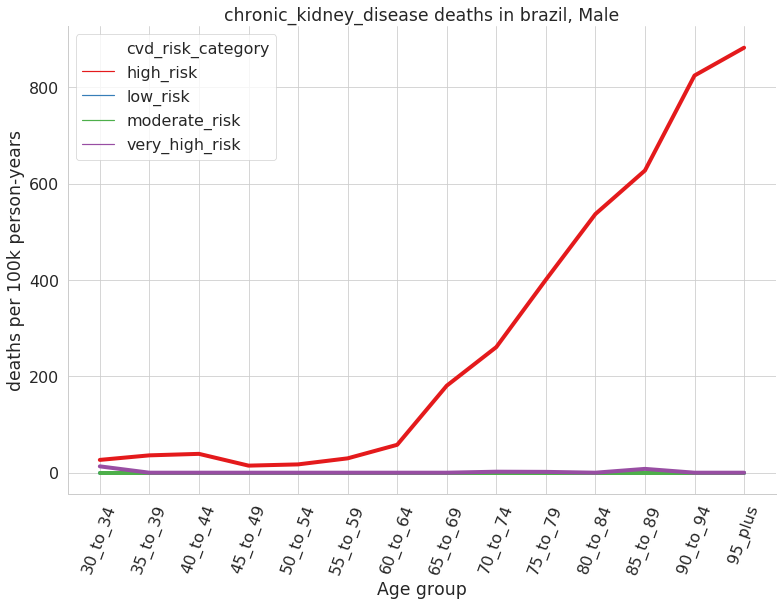

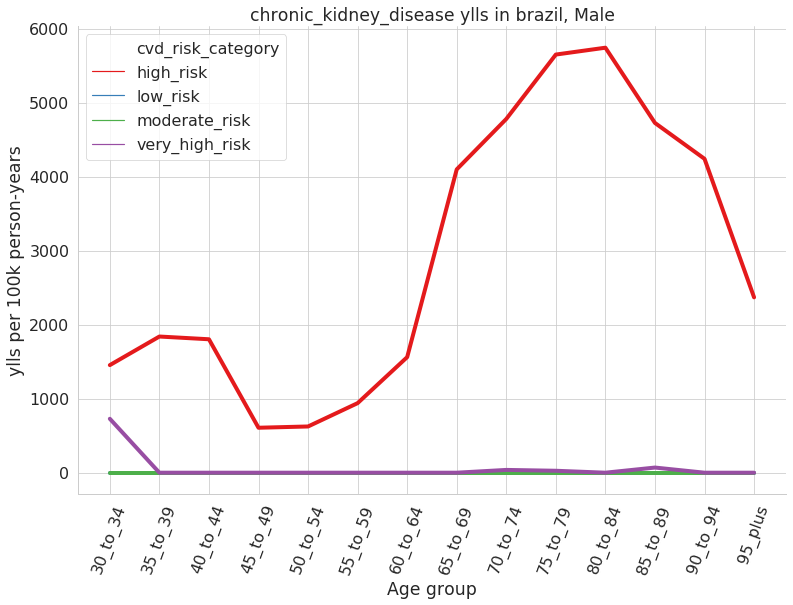

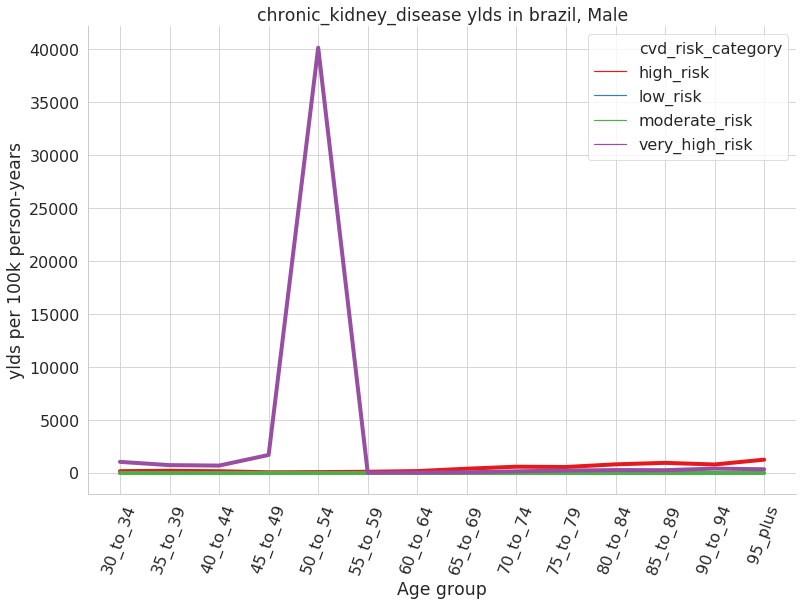

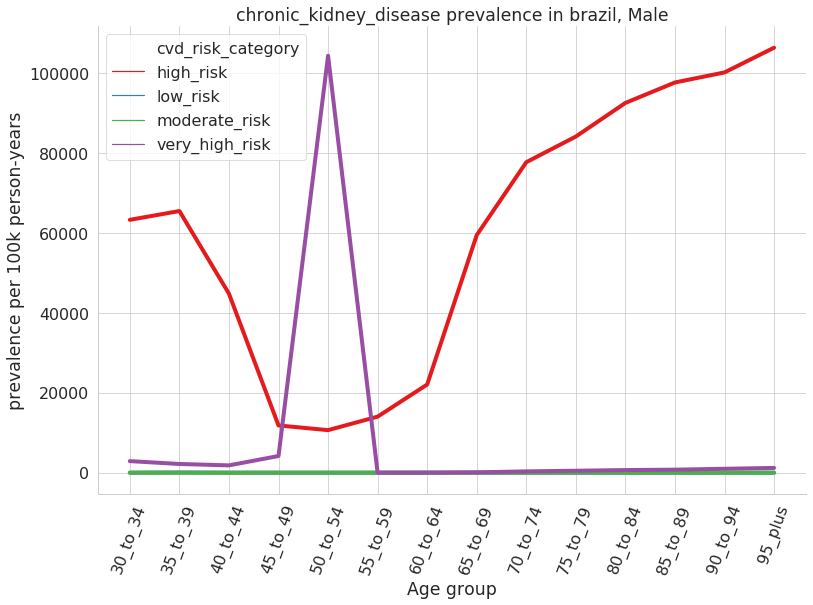

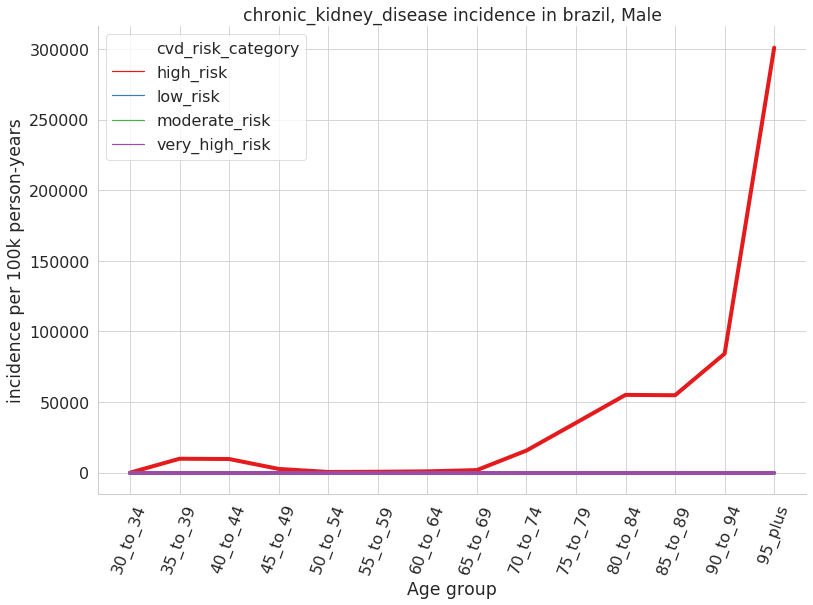

...

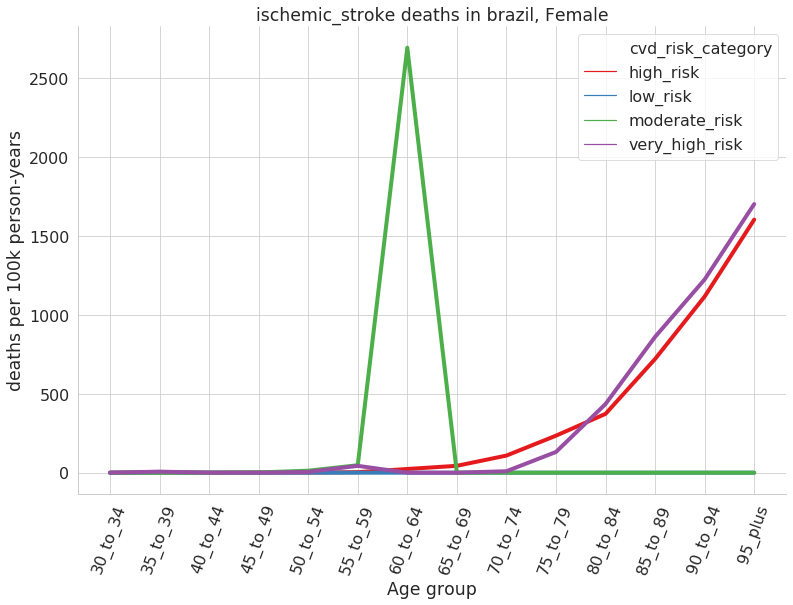

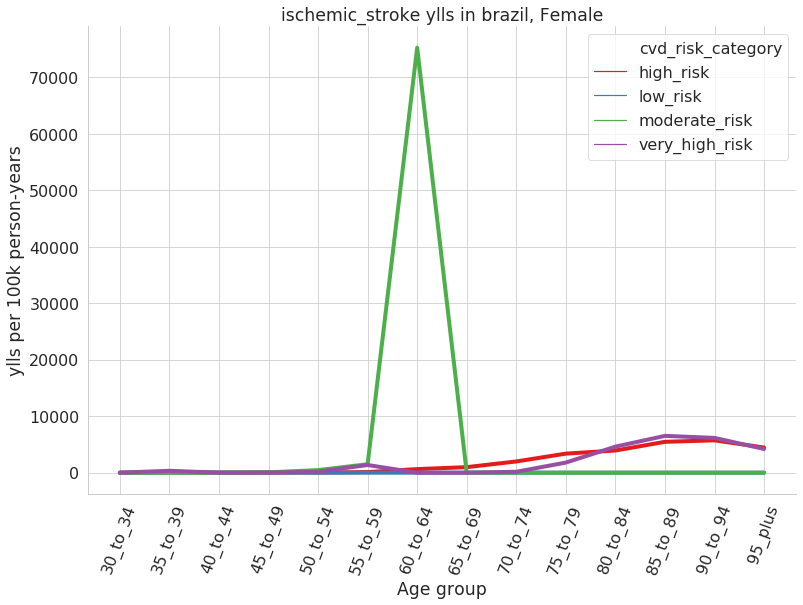

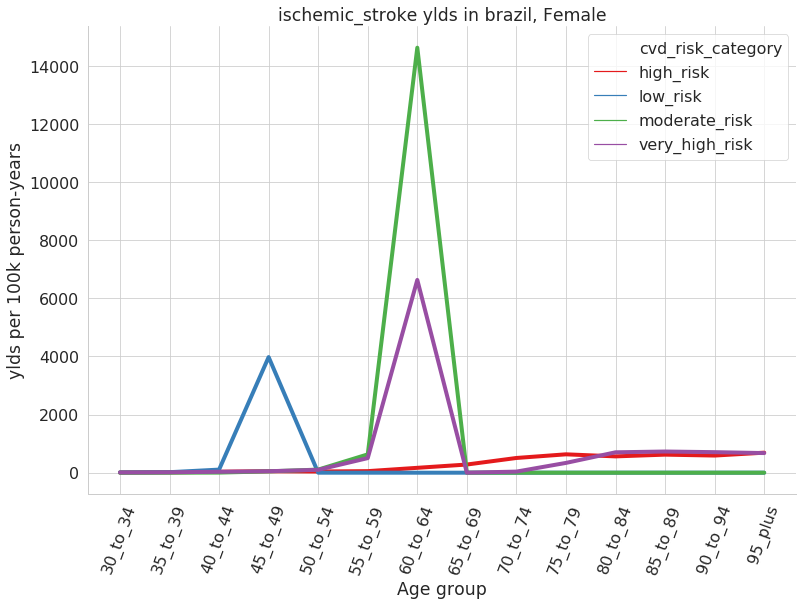

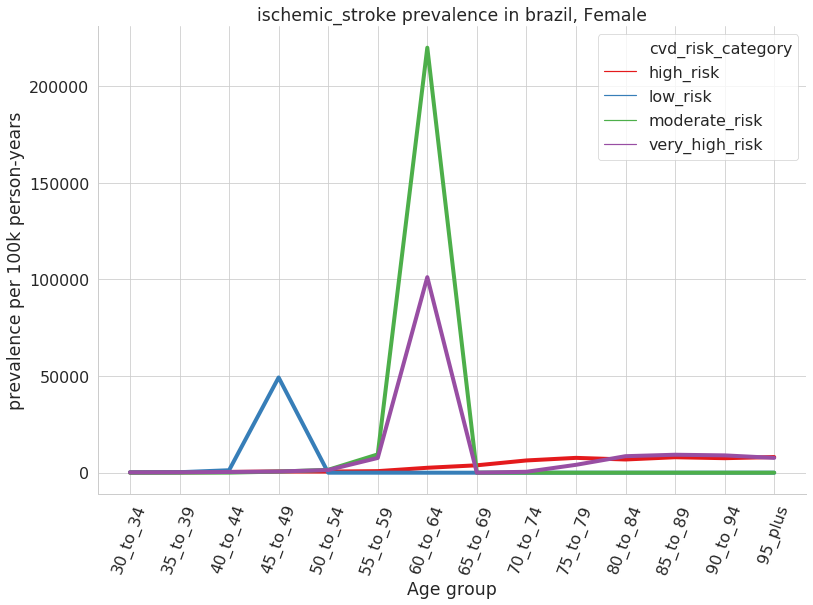

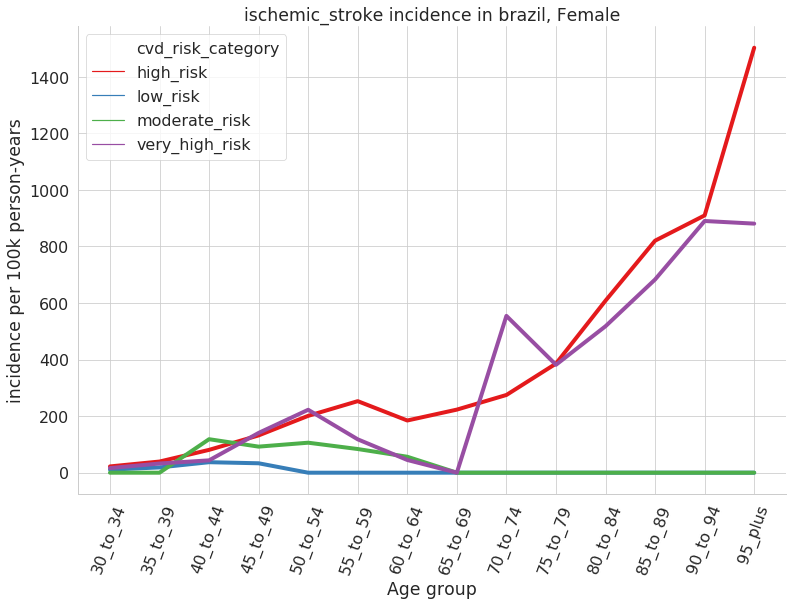

<Figure size 914.4x619.2 with 0 Axes>

In [125]:
plot_results_cvd(rates,locations)

In [120]:
def plot_results_cvd_cause_measure_location(rates,locations):
    cause_names = ['chronic_kidney_disease','diabetes_mellitus','ischemic_heart_disease', 'ischemic_stroke']
    for cause in cause_names:
#             for measure in ['deaths','ylls', 'ylds', 'prevalence','incidence']:
            for measure in ['incidence']:
                for location in locations:
                    with PdfPages(str(save_path)+f'/{cause}_{measure}_{location}_cvd_risk_category_m4.2.pdf') as pdf:        
                        for sex in ['Male', 'Female']:
                            data_r = rates[(rates.cause == cause) & (rates.sex == sex) & (rates.measure == measure) & (rates.location == location) & (rates.year == '2020')]
                            data_m = data_r.groupby(['cvd_risk_category','age_group']).value.mean().reset_index().sort_values(by=['cvd_risk_category'])

                            sns.lineplot(x='age_group', y='value', hue='cvd_risk_category',
                                         linewidth=4, 
                                         data=data_m)

                            plt.title(f'{cause} {measure} in {location}, {sex}')
                            plt.xticks(rotation=70)
                            plt.xlabel('Age group')
                            plt.ylabel(f'{measure} per 100k person-years')

                            pdf.savefig(orientation = 'landscape', bbox_inches='tight')

                            plt.show()
                            plt.clf() 

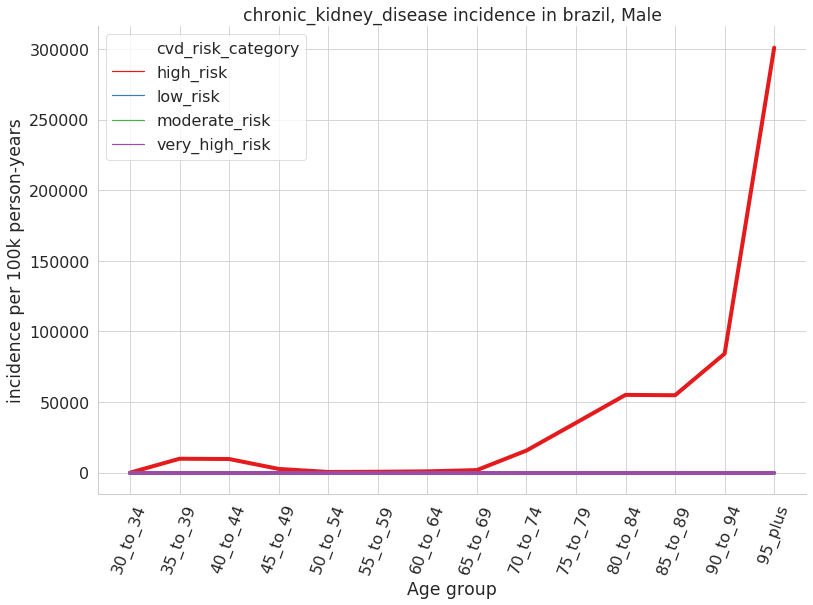

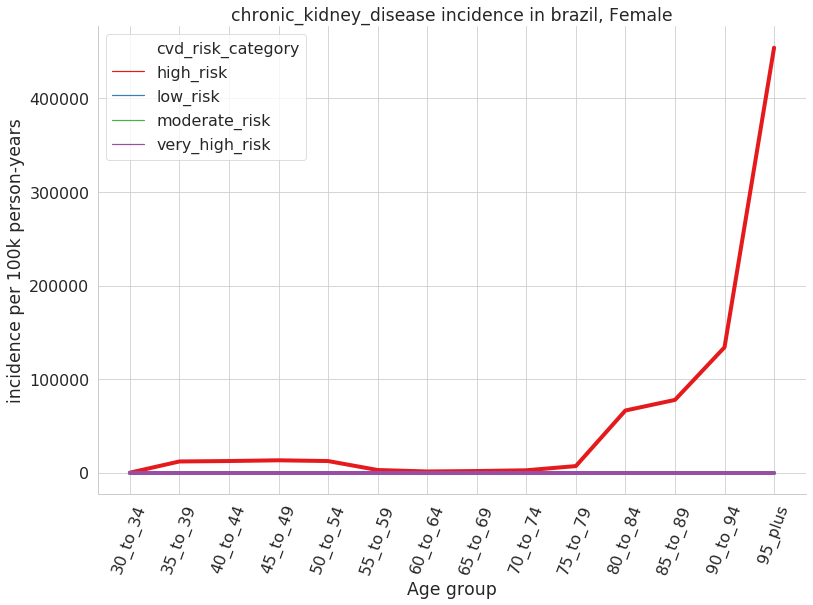

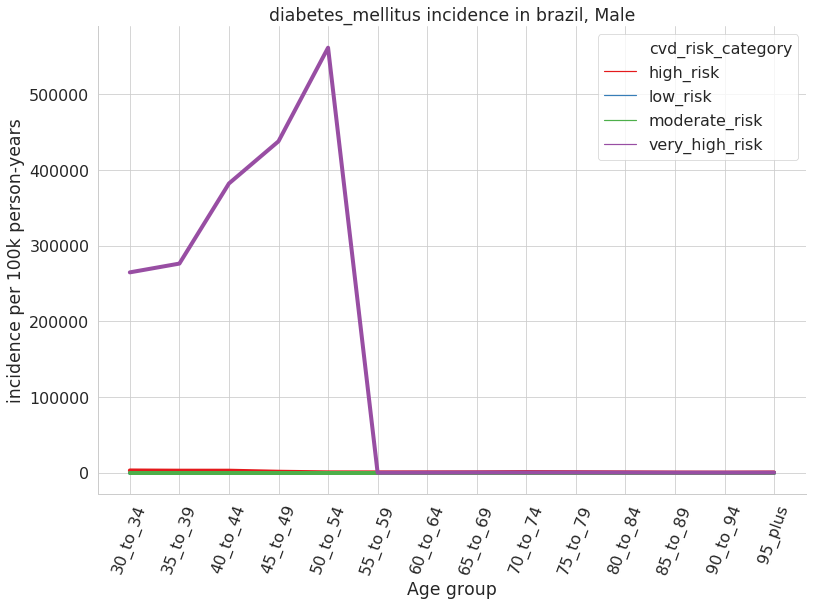

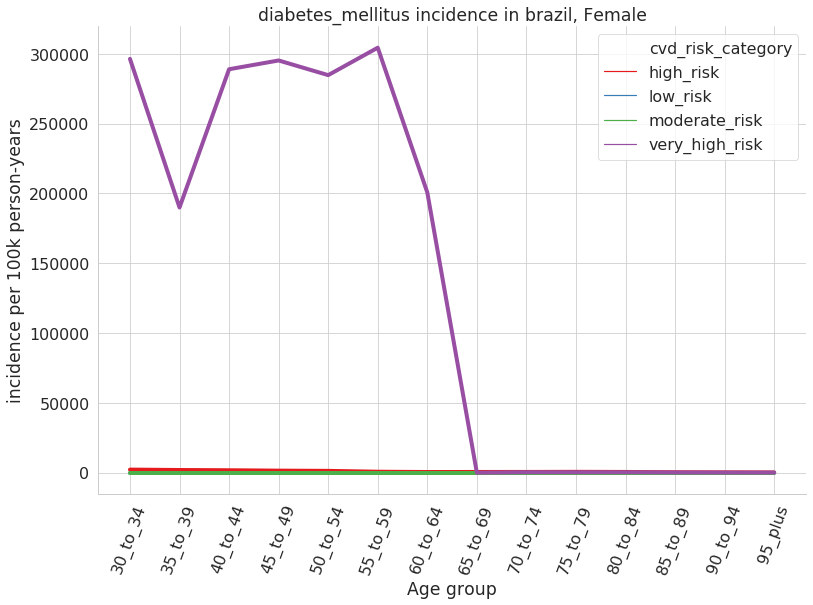

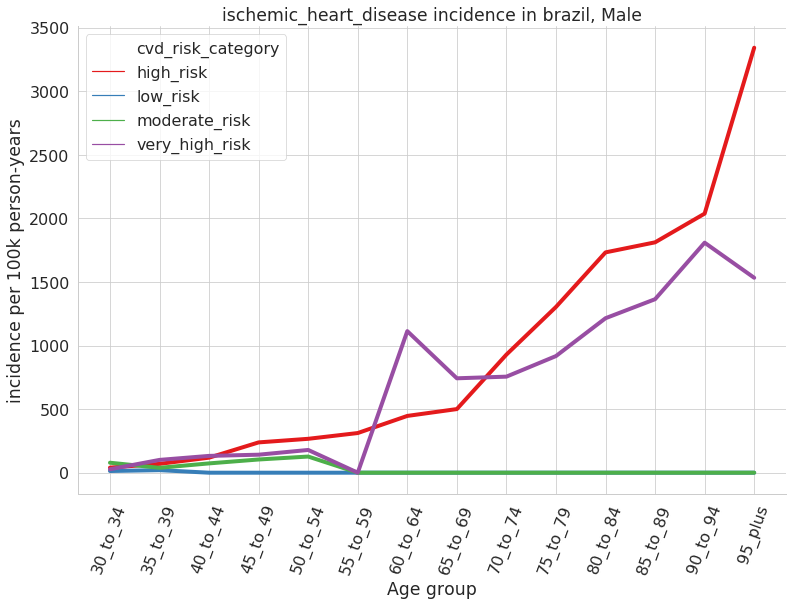

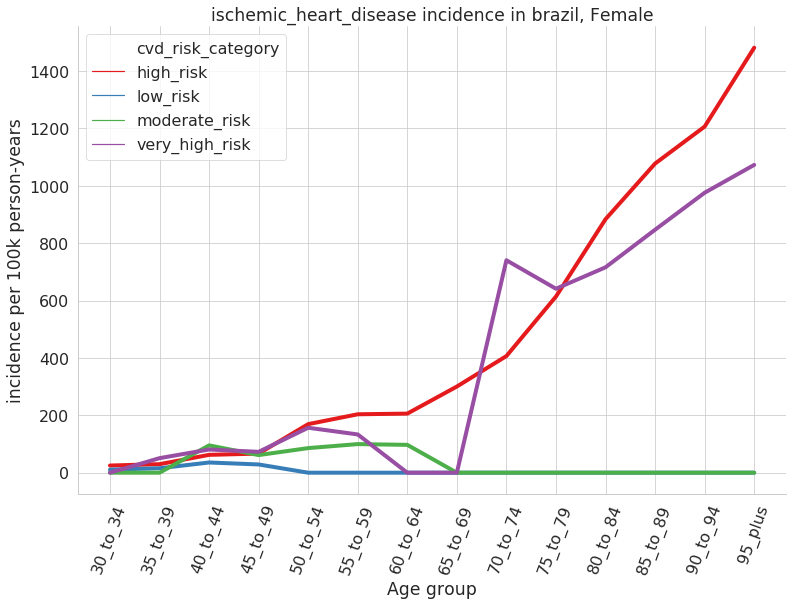

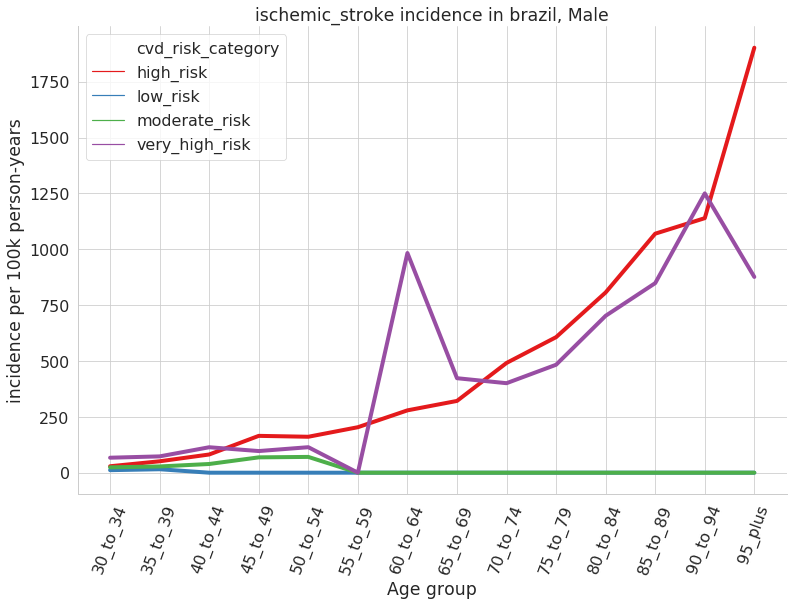

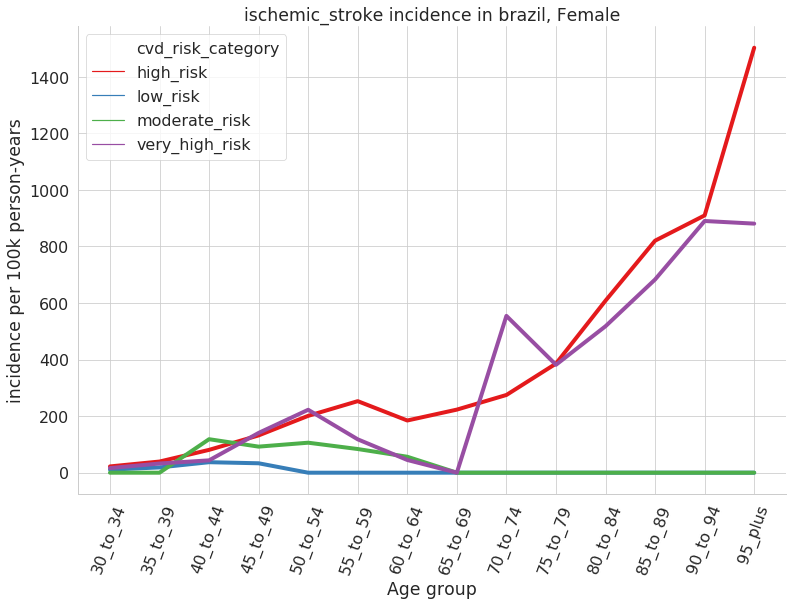

<Figure size 914.4x619.2 with 0 Axes>

In [121]:
plot_results_cvd_cause_measure_location(rates,locations)